## Chapter 3
## Conditional Heteroscedastic Models


https://faculty.chicagobooth.edu/ruey-s-tsay/research/an-introduction-to-analysis-of-financial-data-with-r


**Conditional heteroscedastic models** = the name for methods and econometric models for modeling conditional standard deviation of the underlying asset return.

**Conditional standard deviation** of the underlying asset return = asset return **volatility**.

**Black-Scholes option pricing formula**: price of a call option, derived in chapter 6, is:

(3.1)

$$\large c_t = P_t \phi(x) - K e^{-r * \ell} \phi (x - \sigma_t \sqrt{\ell})$$

$$\large x = \frac{ln\left(\frac{P_t}{K}\right) + r * \ell}{\sigma_t \sqrt{\ell}} + \frac{1}{2} \sigma_t \sqrt{el}$$

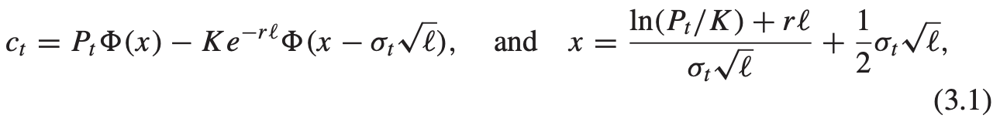

where:
- K = strike price
- $\ell$ = time until the expiration date **measured in years**.
- $P_t$ = current price of the asset
- r = continuously compounded risk-free rate **[annual]**
- $\sigma_t$ = **annualized conditional** standard deviation of the log return of the stock aka **volatility**
- $\phi(x)$ = cumulative distribution function of the standard normal random variable evaluated at x.

Volatility role:
- computing value at risk of financial position in risk management 
- computing asset allocation under the mean-variance framework
- modeling a time series' volatility improves 
    - the **efficiency** in **parameter** estimation
    - the accuracy in **interval** forecast
- volatility index as a financial instrument

Will discuss these **univariate models** advantages / disadvantages and applications:
- autoregressive conditional heteroscedastic ARCH model, (Engle, 1982).
- generalized ARCH aka GARCH model, (Bollerslev, 1986)
- exponential GARCH aka EGARCH model, (Nelson, 1991)
- threshold GARCH aka TGARCH model, (Glosten, Jagannathan, Runkle, 1993)(Zakoian, 1994)
- conditional heteroscedastic autoregressive moving-average CHARMA model, (Tsay, 1987)
- random coefficient autoregressive RCA model, (Nichols and Quinn, 1982)
- stochastic volatility SV models, (Melino and Turnbull, 1990), (Taylor, 1994), (Harvey, Ruiz, and Shephard, 1994), (Jacquier, Polson, and Rossi, 1994).

Multivariate models including ones with **time-varying correlations** are discussed in Chapter 10.

Daily high low prices in volatility modeling are in Section 3.15.

In [1]:
Pt = 4 
K = 2
log(Pt/K); log(Pt) - log(K)

[1] 0.6931472

[1] 0.6931472

## 3.1 Characteristics of volatility

[**Cannot observe daily empirical volatility and evaluate daily volatility forecast performance.**]

If observe daily log returns [one return per day], then daily volatility [volatility of each day] is not directly observable because there is only one return observation per day.   

If observe 10-minute log returns, then daily volatility can be estimated, but then this daily volatility consists of (a) **intraday volatility** denoting variation inside of a trading day [when 10-minute log returns are measured] and (b) **overnight volatility** denoting variation between trading days [when 10-minute log returns are not measured].  High frequency intraday returns contain limited information about overnight volatility.  

[Thus, volatility is unobservable.]

The unobservability of volatility **makes evaluation of** conditional heteroscedastic model forecasting performance difficult.

[**Implied volatility computed from option prices contains price distribution assumptions (e.g. Brownian motion) that are not followed in reality.**]

Options markets accept that [option] prices are governed by an econometric model, e.g. Black-Scholeso formula; then uses [an option] price to imply "implied volatility".  This approach uses a specific model whose assumptions may not hold in market practice.  For example, conditional standard deviation $\sigma_t$ aka implied volatility is derived from the Black-Scholes formula of (3.1) and a call option price, **assuming that the underlying asset price follows a geometric Brownian motion** which may be different from the actual volatility.  **Emirical studies** show that **implied volatility** of an asset return [from option prices] is **larger than** that obtained using **GARCH type volatility** model [that forecasts empirical volatility of asset not option prices]. This difference may be atrributable to (a) **risk premium** for volatility or (b) the **way daily returns are computed**.  

**Volatility is not directly observable but volatility has characteristics that are seen in asset returns**.  
- volatility clusters: it tends to be high **for periods** and low **for periods**.
- volatility **jumps are rare**: it tends to **evolve** over time in a **continuous** manner.
- volatility does **not diverge to infinity**; it tends to vary within some fixed range.
- volatility reacts differently to big [asset] **price increase** or big **price decrease**, referred to as **leverage effect**. 

Statistically, the first 3 characteristics mean that **volatility is often stationary**. 

All 4 characteristics play a role in volatility model development. Some models correct existing model inability to capture these and finer forms of these characteristics: e.g. EGARCH captures the asymmetry in volatility moves in response to positive and negative asset returns.

## 3.2 Structure of a model

$r_t$ = log return of an asset at time index t.

The basic idea of volatility study is that 
- series {$r_t$} is either serially uncorrelated or with minor lower order serial correlations.
- series {$r_t$} is a dependent series. [Some form of {$r_t$} shows time dependence.]

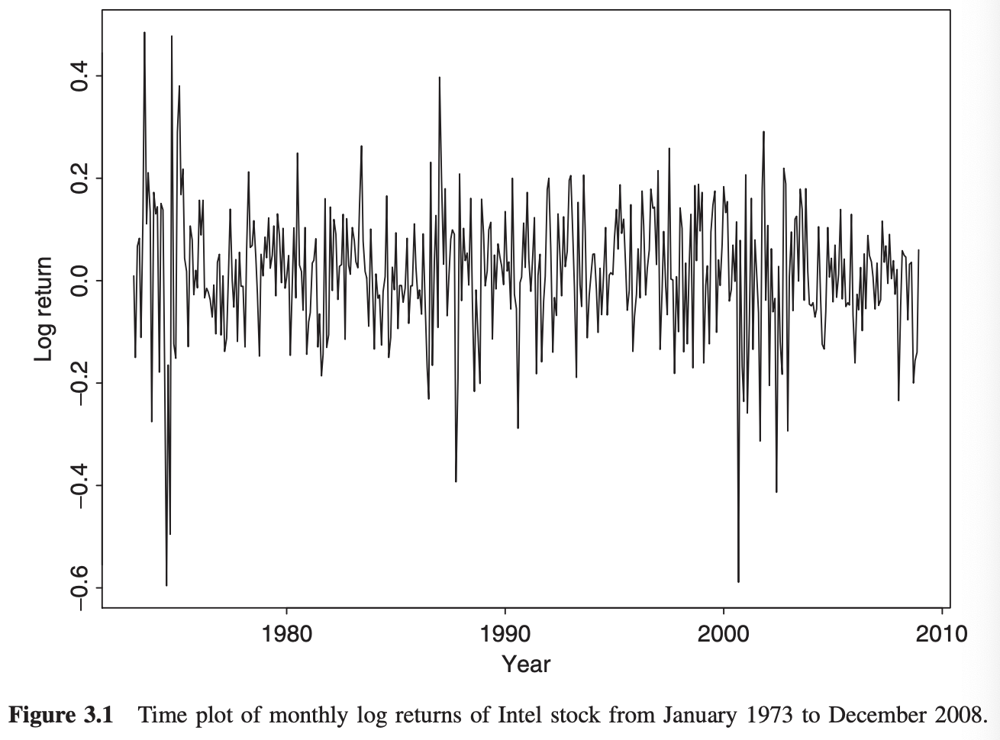

Example: 
- Figure 3.1 shows monthly log returns Intel Jan 1973 - Dec 2008
- Figure 3.2 (a) shows the sample ACF of the log return series suggesting no significant serial correlations except minor at lag 7
- Figure 3.2 (c) shows the sample ACF of absolute log returns = $|r_t|$ 
- Figure 3.2 (b) shows the sample ACF of squared log returns = $r_t^2$
- Figure 3.2 (d) shows the PACF of the squared log returns = $r_t^2$

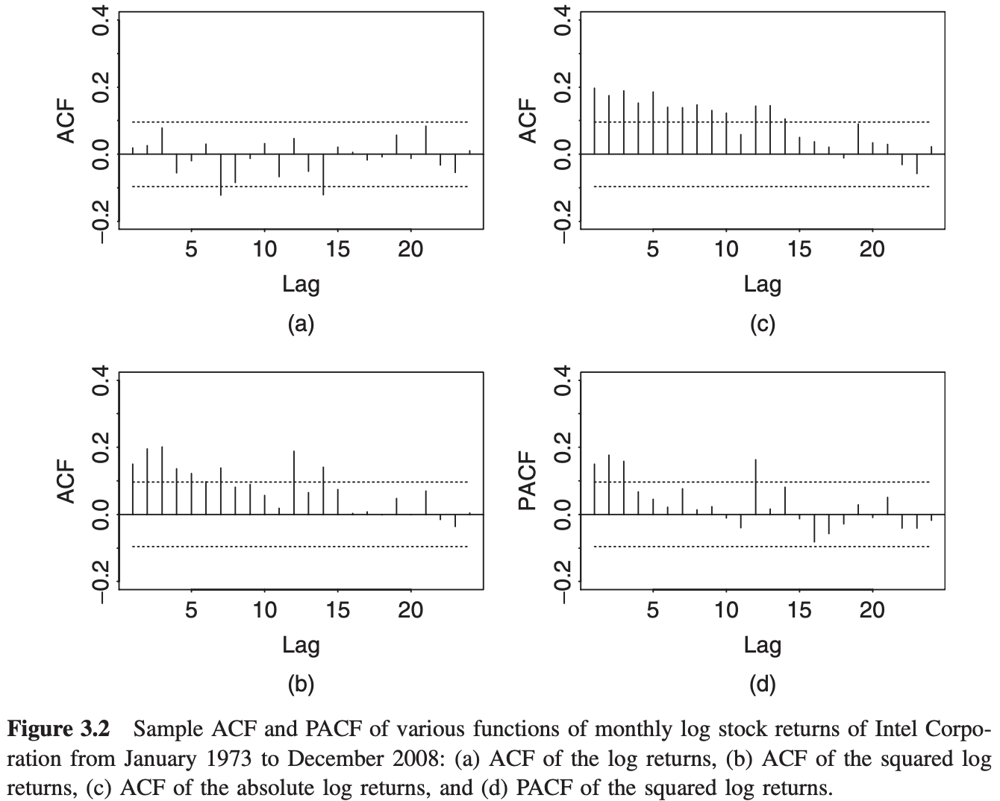

Conclusions:
- Figure 3.2 (a) suggest no significant serial correlation (except minor at lag 7).
- Figures 3.2 (c) and (b) suggest montly log returns are not serially independent.

Combining these two conclusion from three figures 3.2 (a) (b) (c) suggests **monthly log returns are indeed serially uncorrelated but dependent**.  Volatility models attempt to capture such dependence in return series.

Informative to compute the **conditional mean and variance of $r_t$ given** $F_{t-1}$:

(3.2)

$$ \large \mu_t = E(r_t|F_{t-1}), \,\,\, \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = E[(r_t - \mu_t)^2|F_{t-1}]$$

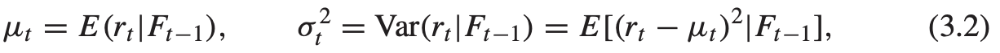

where:
- $F_{t-1}$ denotes the information set available at time t - 1, **typically consisting of all linear functions of the past returns**. 
    - Examples in chapter 2 and Figures 3.2 a-d have shown that serial dependence of stock returns $r_t$ is weak or nonexistent. Thus, the equation for $\mu_t$ in equation (3.2) should be simple if **assume that $r_t$ follows a simple time series model**, such as stationary ARMA(p,q) model with some explanatory variables. 
    
[So the above are conditional mean and variance because of "$|F_{t-1}$" but also because they have a t subscript.  If not conditional would on time sensitive F would they have subscripts?]

[Deriving a model of $\mu_t$ is easy: use the ARMA in (3.3).  Any error in $\mu_t$ = ARMA predicting $r_t$ is due to an innovation $a_t$.]

(3.3)

$$\large r_t = \mu_t + a_t, \,\, \mu_t = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it}$$
 
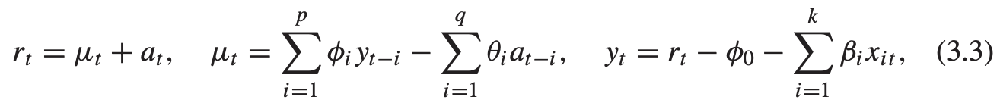

where:
- k, p, q are nonnegative integers
- $x_{it}$ are explanatory variables
- $y_t$ is a notation representing adjusted $r_t$ return series after removing the effect of explanatory variables:  $y_{t-i}$ is $r_{t-i} - \beta_i x_{it}$ explanatory variables - $\phi_0$.]
- [Integrating all parts of (3.3) results in an ARMA(p,q): 
    - resubscript from $y_t$ to $y_{t-1}$
    - substitute $y_{t-1}$ into the 2nd equation 
    - substitute $\mu_t$ into the first equation]

(3.3)
$$ 
\begin{aligned}
 \large r_t = \mu_t + a_t, \,\, \mu_t &= \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it}\\
\large & = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_{t-1} = r_{t-1} - \phi_0 - \sum_{i=1}^k \beta_i x_{i,t-1}\\
\large &= \sum_{i=1}^p \phi_i [r_{t-1} - \phi_0 - \sum_{i=1}^k \beta_i x_{i,t-1}] - \sum_{i=1}^q \theta_i a_{t-i}\\
\large r_t =\mu_t + a_t  &= \sum_{i=1}^p \phi_i [r_{t-1} - \phi_0 - \sum_{i=1}^k \beta_i x_{i,t-1}] - \sum_{i=1}^q \theta_i a_{t-i} + a_t
\end{aligned}
$$



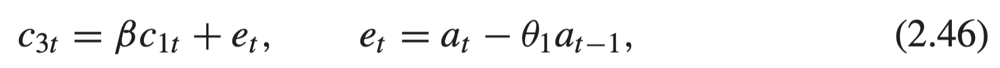

(3.3) illustrates financial application of the **regression model with time series errors** of chapter 2.  
- The (p,q) order of an ARMA model depends on the return series frequency: monthly returns rarely contain serial correlation while daily market returns may show minor serial correlations. 
- the $x_t$ explanatory variables in (3.3) are flexible: 
    - a dummy variable might be used to represent Mondays in a study of weekend effect's on daily returns.
    - CAPM's mean equation of $r_t = \phi_0 + \beta r_{m,t} + a_t$
        - where $r_{m,t}$ denotes the market return.
        - [he seems to be equilibrating $y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it}$ with the CAPM model.]
        
Combine (3.2) and (3.3) to obtain (3.4) [see note below (3.4)]:

(3.2)

$$ \large \mu_t = E(r_t|F_{t-1}), \,\,\, \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = E[(r_t - \mu_t)^2|F_{t-1}]$$

(3.3)

$$ \large r_t = \mu_t + a_t, \,\, \mu_t = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it} $$

(3.4) 

$$\large \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = \text{Var}(a_t|F_{t-1})$$


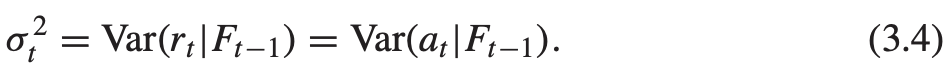


- [If you insert $r_t = \mu_t + a_t$ from LHS of (3.3) into $\sigma_t^2 = \text{Var}(r_t|F_{t-1})$ from RHS of (3.2) then you get $\sigma_t^2 = \text{Var}((\mu_t + a_t)|F_{t-1}) = \text{Var}((a_t)|F_{t-1})$ on RHS of (3.4).]

- [If you insert $a_t = r_t - \mu_t$ from LHS of (3.3) into $\sigma_t^2 = E[(r_t - \mu_t)^2|F_{t-1}]$ from RHS of (3.2), you get this which is helpful later: $E[(a_t)^2]=\text{Var}(a_t)$:]

$$\large \sigma_t^2 = E[(a_t)^2|F_{t-1}]$$ 

- [All together get (this is my equation set):]

$$\large \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = \text{Var}((\mu_t + a_t)|F_{t-1}) = \text{Var}(a_t|F_{t-1}) = E[(a_t)^2|F_{t-1}]$$ 



This chapter's **conditional heteroscedastic models** are distinguished by the manner under which $\sigma_t^2$ evolves over time.  Two general categories class volatility models:
- models that use **an exact function** to govern $\sigma_t^2$ evolution
    - e.g. GARCH
- models that use **a stochastic equation** to describe $\sigma_t^2$.
    - e.g. stochastic volatility model

Definitions for the book:
- $a_t$ = **the shock** or **the innovation** of an asset return at time t
- $\sigma_t$ = the positive square root of $\sigma_t^2$
- equation (3.3)'s model for $\mu$ = **the mean equation for $\mathbf{r_t}$**.
- [equation (3.4)'s] model for $\sigma_t^2$ is **the volatility equation for $\mathbf{r_t}$**.

(3.3)

$$ \large r_t = \mu_t + a_t, \,\, \mu_t = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it}$$

(3.4) 

$$\large \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = \text{Var}(a_t|F_{t-1})$$

Thus, (a) a dynamic equation governs the time evolution of the conditional variance of the asset return and (b) modeling conditional heteroscedasticity amounts to agumenting this dynamic equation to a time series model. [??]

[The mean equation is not about the mean of the time series; the mean equation is about the non $a_t$ part of $r_t$ which is a linear combination of $x_t$, prior $r_t$, prior $a_t$ while the volatility equation is about the variance of the non-$\mu$ part of $r_t$: $a_t = r_t - \mu_t$.]


## 3.3 Model building

Build a volatility model for an asset return series in four steps:

1. Specify mean equation 
    - by testing for serial dependence in the data [testing returns data not returns squared data]
    - then if necessary, by building an econometric model, e.g. ARMA model, to remove any **linear** dependence from the return series.
    
2. Use the squared "residuals of the mean equation" to test for ARCH effects [after cleaning returns data of correlations].

3. Specify the volatility model if ARCH effects are statistically significant. Perform joint estimation of the mean and volatility equations.  [Return to returns and add in volatility and co-determine the 2 equations.]

4. Check the fitted model and refine if needed.

[Step 1 implies that that is what the mean equation does: strip linear dependence from the return series to end up with only $\mu_t$ which is equal to $\phi_i$ scaled (a la AR) previous $r_t$, that had been stripped of $\phi_0$ and $\beta_i x_i$ explanatory factors, together with $\theta_i$ scaled (a la MA) previous innovations.]

[Step 1 merely models the linear dependence of the time series.  Step 1 models the mean equation.]  

[Step 2 tests if ARCH effects (volatility equation and ?nonlinear dependence? $\phi_i \text{ mulitplies } \phi_0 and \beta_i$) exist in the time series that the ARMA (mean equation and ?linear dependence?) models could not model.  These dependencies will be found in the residuals = time series $r_t$ - linear model of time series $\mu_t$ = $a_t$.]

[Step 3 models the ARCH effects with the volatility equation if ARCH effects were found in step 2.]

[Jointly estimate the mean and volatility equations as part of Step 3.]

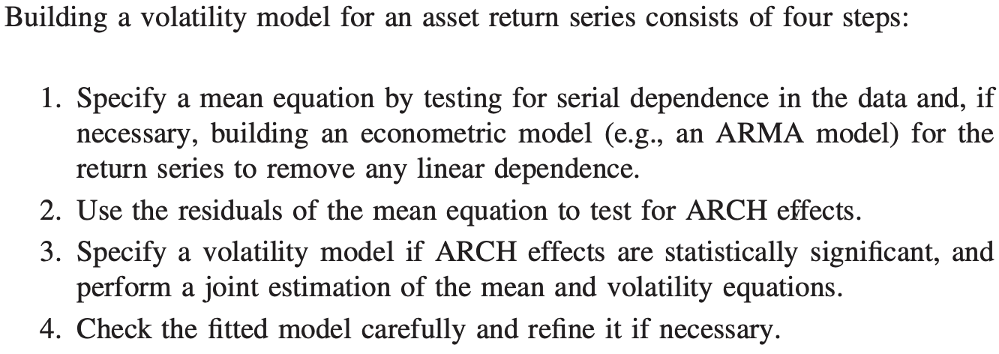

[Notes for skipping over step 1:]

- Most asset return series serial correlations are weak.  Thus, building a mean equation in step 1 amounts to removing the sample mean from the data if the sample mean is significantly different from zero. 

- For daily return series, an AR model might be needed.

- The mean equation may employ explanatory variables, such as indicator variables for weekend or January effects.

Empirical examples employ R (with and without OX) and S-Plus.  Other software options include Eviews, SCA, RATS.

## 3.3.1 Testing for ARCH Effect

[step 2 of the model building 4 steps]

Let $a_t = r_t - \mu_t =$ the **resiuals of the mean equation** [= the time series minus any linear model of the time series].

The squared series $a_t^2$ checks for **conditional heteroscedasticity aka ARCH effects** 
- [= autoregressive conditional heteroscedasticity]
- [= autocorrelation in $a^2 = $ the squared residuals of the mean equation]

[Is Var$(a_t|F_{t-1}) = \sigma_t^2$ from (3.4) $= a_t^2$? Yes! It is equal to $E(a_t^2 = (r_t - \mu_t)^2)$]

Two tests for ARCH effects:
1. apply Ljung-Box satistics Q(m) to the $a_t^2$ series (McCleod and Li, 1983).  The null hypothesis is that the first m lags of ACF of the $a_t^2$ series are zero.

2. apply the Lagrange multiplier test of Engle (1982).
    - Equivalent to the F statistic for testing $\alpha_i = 0, (i = 1, 2, ..., m)$ in the linear regression:
    
    $$\large a_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2 + e_t, \text{  } t = m + 1, ....T$$

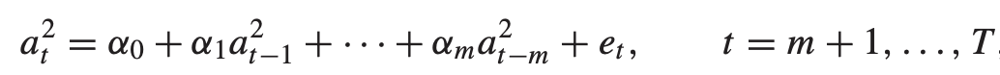

   - where 
        - $e_t$ denotes the error term
        - m is a prespecified positive integer
        - T is the sample size
        - Null hypothesis = $H_0: \alpha_1 = ... = \alpha_m = 0$
        
   - let
    
    $$\large \text{SSR}_0 = \sum_{t=m+1}^T (a_t^2 - \bar{\omega})^2$$
    
    $$\large \text{where: } \bar{\omega} = \frac{1}{T} \sum_{t=1}^T a_t^2 = \text{sample mean of } a_t^2$$
    
    $$\large \text{SSR}_1 = \sum_{t=m+1}^T \hat{e}_t^2$$

    $$\large \text{where: } \hat{e}_t = \text{ least squares residual of the above regression:}$$ 
    $$\large a_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_1 a_{t-m}^2 + e_t$$

    - this gives us an F test statistic   
$$\large F = \frac{ \left( \frac{(\text{SSR}_0 - \text{SSR}_1)}{m} \right)}{\left( \frac{\text{SSR}_1}{(T - 2m - 1)} \right)}$$

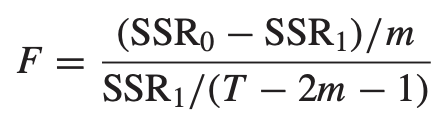


[explained $a_t^2$ variance from mean $a_t^2$ less model error all over all model error; F > 1]

   - that is asymptotically distributed as a chi-squared distribution with **m degrees of freedom** under the null hypothesis.
       - where the decision rule is to reject the null hypothesis 
            - if 
            
            $$\large F > \chi_m^2(\alpha)$$
            
            - where 
            
            $$\large \chi_m^2(\alpha) = \text{upper} 100 (1 - \alpha)^{th} \text{ percentile of } \xi_m^2$$
            
            - or the p value of F is less than $\alpha$ type-1 error.
            
            [unfortunate re-use of $\alpha$ here is not a coeff of the regression, but a measure of 1-quantile of $\chi^2$ distribution.]  
            
[If the alpha's of the regression are significantly away from zero then $a_t^2$ = current residual squared of the mean equation is some linear combination of the previous m residuals squared of the mean equation, and thus there is some dependence of the squared residuals = some conditional heteroscedasticity in the time series.]
            
Example:
- monthly log returns INTC from 1973 to 2008 from Example 3.1
- the series does not have significant serial correlation and thus can be used directly to test for the ARCH effect: Q(m) statistics of the return series give Q(12) = 18.26 with a p value 0.11 confirming no serial correlation in the data at the 10% significance level.
- However, the [residuals of the mean equation] show strong ARCH effects 
    - Lagrance multiplier test statistic = $F \approx 53.62$ and p value close to zero.
    - The Ljung-Box statistics of the $a_t^2$ series [aka the square of the residuals of the mean equation] also show strong ARCH effects with Q(12) = 89.85 with p value close to zero. 
- R demonstration
    - libraries
    - test for autocorrelation in the log returns
    - test the ARCH effects = autocorrelation in $a_t^2$ the squared residuals of the mean equation via Lagrange and Ljung-Box.
        - Brief on Lagrange test: 
            - log of original series [not the squared residuals of mean equation] are fed into ArchTest 
            - ArchTest performs the regression on residuals of mean equation squared series:

$$a_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ··· + \alpha_m a_{t-m}^2 + e_t, t = m+1, ..., T$$

- an F Test statsitic is compared to chi-squared distribution at alpha **level of significance** to determine whether alphas **of the regression** are zero per the null hypothesis or if the null hypothesis can be rejected. 

[I know above that I said the mean equation isnt just taking the mean of $r_t$ or even $r_t - a_t$ that it is modeling the past $r_t$ and past $a_t$ and explanatory variables $x_t$, but if tests reveal no dependence then the mean equation is the mean of $\{r_t\}$.  If worried about this, see the brief notes that preceded the next section and see that $\mu$ is not $\mu_t$ when there is no serial dependence.] 

In [2]:
#install.packages("fUnitRoots")
#install.packages("psych")

In [3]:
require(fBasics)
require(forecast)
require(fUnitRoots)
require(psych)
library(urca)

Loading required package: fBasics

Loading required package: timeDate

Loading required package: timeSeries

Loading required package: forecast

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Loading required package: fUnitRoots

Loading required package: psych


Attaching package: ‘psych’


The following object is masked from ‘package:fBasics’:

    tr


The following object is masked from ‘package:timeSeries’:

    outlier



Attaching package: ‘urca’


The following objects are masked from ‘package:fUnitRoots’:

    punitroot, qunitroot, unitrootTable




In [4]:
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
Box.test(intc, lag=12, type="Ljung")


	Box-Ljung test

data:  intc
X-squared = 18.263, df = 12, p-value = 0.1079


In [7]:
at <- intc-mean(intc)
Box.test(at,lag=12,type="Ljung")
Box.test(at^2,lag=12,type="Ljung")


	Box-Ljung test

data:  at
X-squared = 18.263, df = 12, p-value = 0.1079



	Box-Ljung test

data:  at^2
X-squared = 89.851, df = 12, p-value = 5.274e-14


https://www.rdocumentation.org/packages/nortsTest/versions/1.0.1/topics/Lm.test    
https://cran.r-project.org/web/packages/nortsTest/index.html  
the above packages and other dont appear to run lm test; tried lmtest, Lm.test and other variations.  This works from Tsay's package:

In [59]:
library(FinTS)
ArchTest(intc, lag=12)
ArchTest(at, lag=12)


	ARCH LM-test; Null hypothesis: no ARCH effects

data:  intc
Chi-squared = 43.476, df = 12, p-value = 1.875e-05



	ARCH LM-test; Null hypothesis: no ARCH effects

data:  at
Chi-squared = 52.248, df = 12, p-value = 5.602e-07


## notes

Going into the next section, it is useful to remember these from section 2.3:

A time series $r_t$ is said to be linear if it can be written as:

(2.4) 

$$\large r_t = \mu + \sum_{i=0}^{\infty} \psi_i a_{t-1}$$

where 
- $\mu$ = the mean of $r_t$
- $\psi_0$ = 1
- [$a_t$] is a white noise series: 
    - $a_t$ denotes the new information at time t of the time series. 
    - $a_t$ is aka the innovation or shock at time t
- a time series $r_t$ [or $a_t$] is called a white noise series if {$r_t$} is a sequence of independent and identically distributed random variables with finite mean and variance. 
- a time series $r_t$ [or $a_t$] is called a Gaussian white noise series if {$r_t$} is normally distributed with mean zero and variance $\sigma^2$
- For a white noise series, all the ACFs are zero.  Practically if all sample ACFs are close to zero, then the series is a white noise. 

If $r_t$ is weakly stationary, then as a consequence of the independence of {$a_t$}, $r_t$'s mean and variance are:

$$\large E(r_t) = \mu, \text{     Var}(r_t) = \sigma_a^2 \sum_{i=0}^{\infty} \psi_i^2$$ 


[just remember that the above is about $a_t$ not $a_t^2$]

## 3.4 The ARCH model

Engle's (1982) **ARCH model** provides a **systemic framework** for volatility modeling.  The basic idea of ARCH models is that:
- the shock $a_t$ of an asset return is serially uncorrelated but dependent
- the dependence of $a_t$ can be described by a simple quadratic equation of its lagged value.  ARCH(m) model assumes that:

(3.5) 

$$\large a_t = \sigma_t \epsilon_t, \text{            } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$

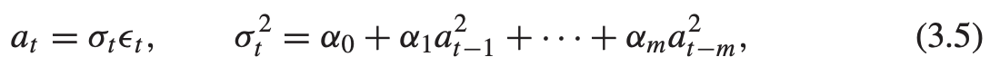

where:
- {$\epsilon_t$} is a sequence of independent and identically distributed (iid) random variables with mean zero and variance 1. 
- In practice $\epsilon_t$ is assumed to follow a **standard normal** or **standard Student-t** or a **generalized error** distribution. [and these distributions form models that followed Engle's GARCH]. 
- [$a_t$ is also iid but not Gaussian, Student-t or Generalized Error like $e_t$ [<-- $a_t$ white noise can be Gaussian ($\mu=0$) or not]. So seems that the stdev of $a_t$ (not $r_t$ as made clear soon) that is scaled by an $\epsilon_t$ iid to make a white noise $a_t$.]
- $\alpha_0 > 0$
- $\alpha_i ≥ 0 \text{ for } i > 0$.
- the coefficient $\alpha_i$ satisfies regularity conditions to ensure the **unconditional** variance of $a_t$ is finite.
- some authors use $h_t$ to denote the **conditional** variance in (3.5).  In this case, the shock $a_t = \sqrt{h_t} \epsilon_t$.  [same as $a_t = \sigma_t \epsilon_t$]

[From the last 2 bullets and the next paragraph, it **is clear** that $\sigma_t$ in (3.5) is the **conditional** variance of $a_t$.  So, it would seem the regularity conditions are meant to limit the **unconditional** variance.]

The structure of the GARCH model shows that large past squared shocks $\{a_{t-i}^2\}_{i=1}^m$ imply a **large conditional variance** $\sigma_T^2$ **for the innovation** $a_t$ [$\sigma_t$ is for $a_t$], and thus a large value $a_t = \sigma_t \epsilon_t$ value in modulus.
- As a consequence, under GARCH, large shocks "tend" to be followed by another large shock. 
- The word "tend" is used because a large variance does not necessarily product a large realization.  It only says that the probability of obtaining a large variate is greater than that of a small variance.  This feature is similar to the volatility clusterings observed in asset returns. 

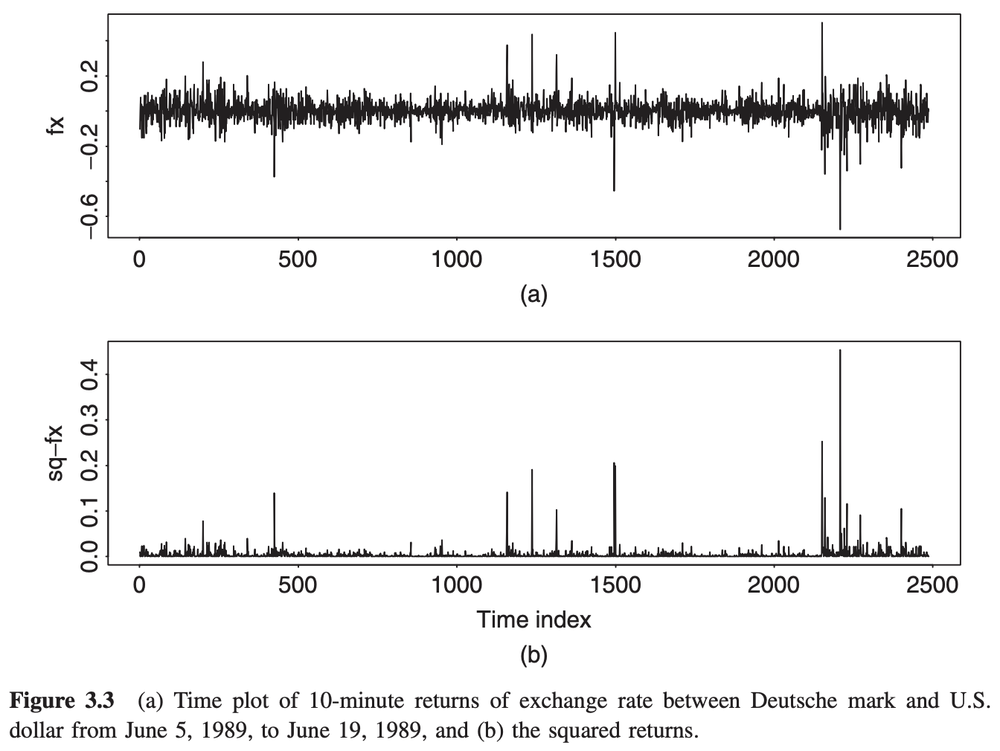

Example: 
- ARCH effect shown in Figure 3.3 time plots of (a) 2488 observations of USDDEM 10-minute interval percentage changes from 5 Jun 1989 to 19 Jun 1989 (b) the squared series of those percentage changes.  Notice: Big percentage changes occurred occasionally but there were certain stable periods.
- Figure 3.4a shows the sample ACF of the percentage change series with no serial correlation.
- Figure 3.4b shows teh sample PACF of the squared series of percentage change with some big spikes in the PACF suggesting that **the percentage changes are not serially independent and have ARCH effects**.

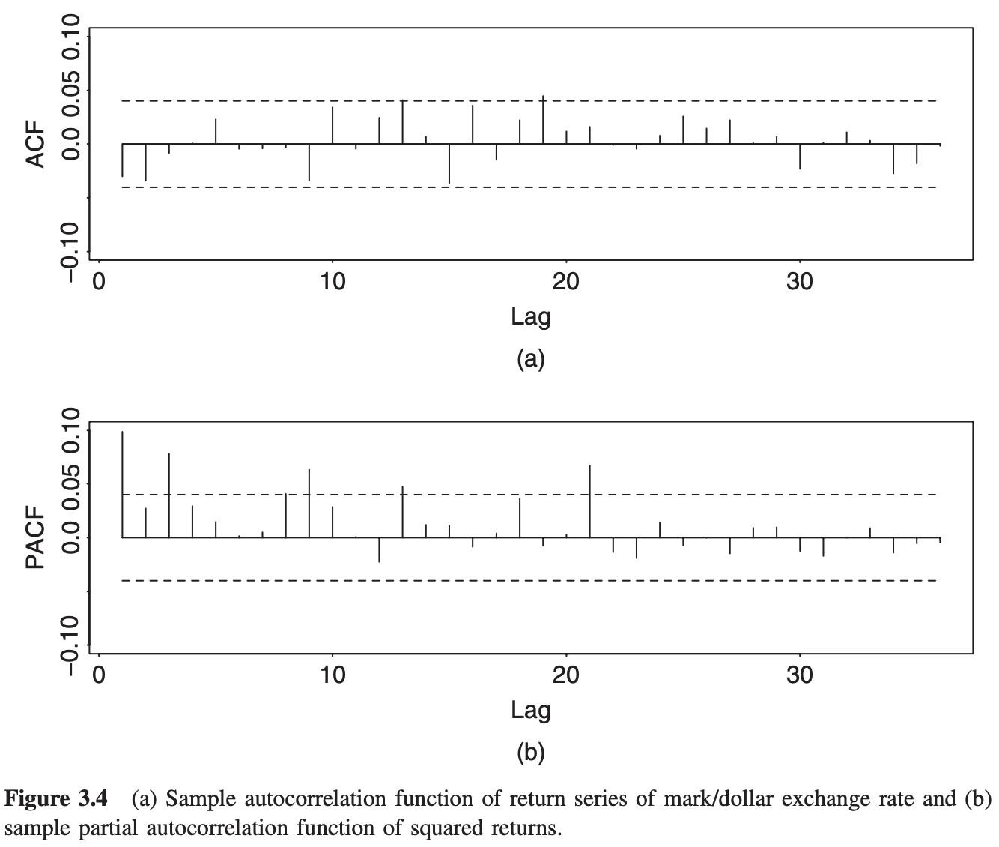

GARCH model: $a_t$ is serially uncorrelated but dependent based a function of (a) $\epsilon_t$ that is IID modeled as standard Student t or standard normal or generalized error distribution ($\mu=0 \sigma=1$) and (b) [$a_t$'s variance =] $\sigma_t^2$ that is modeled as a linear function of past squared $a_t^2$s which of course are functions of unsqaured product of $\sigma_t$s and $\epsilon_t$s.

$\sigma_t^2$ is 'conditional variance' of $a_t$.  $a_t$ is 'innovation'.  $\alpha_i$ are regularlized so that the unconditional variance of $a_t$ = Var($a_t$) is not unbounded.

## 3.4.1 Properties of ARCH Models

ARCH model understanding begins with the ARCH(1) model:

$$\large a_t = \sigma_t \epsilon_t, \text{      } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2$$

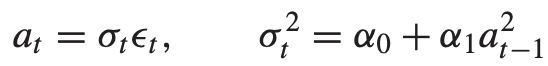

where
- $\alpha_0 > 0$
- $\alpha_1 ≥ 0$

Understanding:
- FIRST, the unconditional mean of $a_t$ remains zero because:

$$\large E(a_t) = E[ E(a_t | F_{t-1}) ] = E[ \sigma_t E(\epsilon_t) ] = 0$$

[because $E(\epsilon_t)$ = 0]

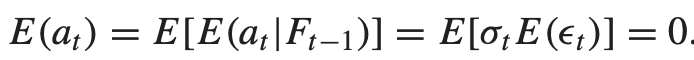

- SECOND, the **unconditional** variance of $a_t = \text{Var}(a_t)$:

the first line below works because $a_t$ is a stationary process with 
- $E(a_t) = 0$ in the variance computation
- $\text{Var}(a_t) = E(a_t^2) = \text{Var}(a_{t-1}) = E(a_{t-1}^2)$ 
- law of iterated expectation brings in the conditions of $a^2$ with E[E(...)]

[the second line below works and follows because the first line's $E(a_t^2|F_{t-1})]$ contains conditions $F_{t-1}$ that are estimated by $\alpha_i$ parameters in the previously-defined **conditional** variance of $a_t = \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 = a_t^2$. [<--think true since $\mu_a = 0$, but not sure where got.] By including all conditions, the RHS of line 1 and LHS of line 2 make the variance **unconditional** as denoted by Var($a_t$). This double expectations is outlines in the law of iterated expectation (LIE), links provided in the next cell]

$$ \begin{aligned}
\large \text{Var}(a_t) & \large= E(a_t^2) = E[E(a_t^2|F_{t-1})]\\
& \large = E(E(\alpha_0 + \alpha_1 a_{t-1}^2) = \alpha_0 + \alpha_1 E(a_{t-1}^2)
\end{aligned}$$

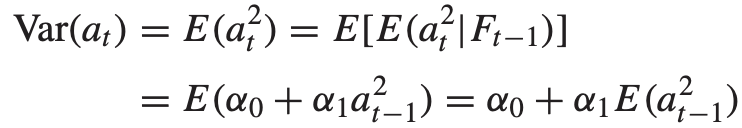

Therefore we have from the **unconditional** variance:

$\large \text{Var}(a_t) = \alpha_0 + \alpha_1 * \text{Var}(a_{t-1})$

$\large \text{Var}(a_t) = \alpha_0 + \alpha_1 * \text{Var}(a_t)$

rearranged

$\large \text{Var}(a_t) - \alpha_1 * \text{Var}(a_t) = \alpha_0$

factored

$\large \text{Var}(a_t) * (1 - \alpha_1) = \alpha_0$

$\Large \text{Var}(a_t) = \frac{\alpha_0}{1 - \alpha_1}$

Since the variance of $a_t$ must be positive, require $0 ≤ \alpha_1 < 1$

ONE covered means of and TWO covered variance of $a_t$.

THIRD, in order that some higher order moments of $a_t$ exist, $\alpha_1$ must be constrained:
- For example: in order to study $a_t$ tail behavior, the fourth moment of $a_t$ must be finite. [First, study $a_t^4$ then divide by $[\text{Var}(a_t)]^2$ for kurtosis = 4th moment.] Under the normality assumption of $\epsilon_t$ in (3.5) where $a_t = \sigma_t \epsilon_t, \text{   } \{ \epsilon_t \} \sim \text{iid}[\mu = 0, \sigma = 1]$, we have [no understanding of what 3 is for except maybe excess kurtosis = 3 * kurtosis]:

$$\large \mathbb{E}(a_t^4|F_{t-1}) = 3 [\mathbb{E} (a_t^2|F_{t-1})]^2 = 3(\alpha_0 + \alpha_1 a_{t-1}^2)^2$$

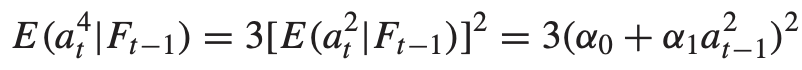

Therefore:

$$\large \mathbb{E}(a^4) = \mathbb{E}[\mathbb{E}(a^4|F_{t-1})] = 3 [\mathbb{E} (\alpha_0 + \alpha_1 a_{t-1}^2)^2 = 3 \mathbb{E} (\alpha_0^2 + 2 \alpha_0 \alpha_1 a_{t-1}^2 + \alpha_1^2 a_{t-1}^4)$$

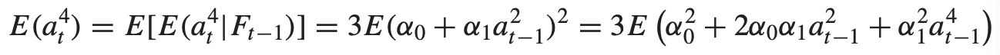

https://en.wikipedia.org/wiki/Stationary_process

**If $a_t$ is fourth-order stationary** with $m_4 = \mathbb{E}(a_t^4)$, then:

$$ \large m_4 = 3 [\alpha_0^2 + 2 \alpha_0 \alpha_1 \text{Var}(a_t) + \alpha_1^2 m_4]$$

[Last line replaces $a_{t-1}^2$ with $\text{Var}(a_t)$ **unconditional** variance of $a_t$ where previously $a_{t-1}^2 = \sigma_t^2$ conditional variance of $a_t$.]

$$ \large m_4 = 3 [\alpha_0^2 + 2 \alpha_0 \alpha_1 \frac{\alpha_0}{1-\alpha_1} + \alpha_1^2 m_4]$$

$$ \large m_4 = 3 \alpha_0^2 \left( 1 + 2 \frac{\alpha_1}{1-\alpha_1} \right) + 3 \alpha_1^2 m_4$$

$$ \large m_4 - 3 \alpha_1^2 m_4 = 3 \alpha_0^2 \left( 1 + 2 \frac{\alpha_1}{1-\alpha_1} \right)$$

$$ \large m_4 (1 - 3 \alpha_1^2) = 3 \alpha_0^2 \left( 1 + 2 \frac{\alpha_1}{1-\alpha_1} \right)$$

$$ \large m_4 = \frac{3 \alpha_0^2 \left( 1 + 2 \frac{\alpha_1}{1-\alpha_1} \right)}{(1 - 3 \alpha_1^2)}$$

$$ \large m_4 = \frac{3 \alpha_0^2 \left( \frac{1-\alpha_1}{1-\alpha_1} + 2 \frac{\alpha_1}{1-\alpha_1} \right)}{(1 - 3 \alpha_1^2)}$$

$$ \large m_4 = \frac{3 \alpha_0^2 \left( \frac{1-\alpha_1 + 2 \alpha_1}{1-\alpha_1} \right)}{(1 - 3 \alpha_1^2)}$$

$$ \large m_4 = \frac{3 \alpha_0^2 \left( \frac{1+\alpha_1}{1-\alpha_1} \right)}{(1 - 3 \alpha_1^2)}$$

$$ \large m_4 = 3 \alpha_0^2 \left( \frac{1+\alpha_1}{1-\alpha_1} \right) \frac{1}{(1 - 3 \alpha_1^2)}$$

$$ \large m_4 = \frac{3 \alpha_0^2 (1+\alpha_1)}{(1-\alpha_1) (1 - 3 \alpha_1^2)}$$

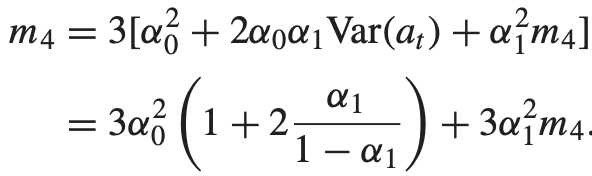

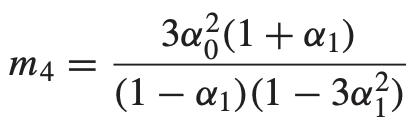

with 2 important implications:
1. Since the fourth moment of $a_t$ is positive, [and $0 ≤ \alpha_1 < 1$ for variance of $a_t ≥ 0$ stated above], then $\alpha_1$ must satisify the condition $1 - 3 \alpha_1^2 > 0$ or $0 < \alpha_1^2 < \frac{1}{3}$.
2. [now that have $m_4 = E(a_t^4)$] the **unconditional kurtosis** of $a_t$ is:

$$\large \frac{\mathbb{E} (a_t^4)}{[\text{Var}(a_t)]^2} = 3 \frac{\alpha_0^2 (1+\alpha_1)}{(1-\alpha_1) (1 - 3 \alpha_1^2)} \times \frac{1}{[\text{Var}(a_t)]^2}$$

$$\large \frac{\mathbb{E} (a_t^4)}{[\text{Var}(a_t)]^2} = 3 \frac{\alpha_0^2 (1+\alpha_1)}{(1-\alpha_1) (1 - 3 \alpha_1^2)} \times \frac{1}{[\frac{\alpha_0}{1 - \alpha_1}]^2}$$

$$\large \frac{\mathbb{E} (a_t^4)}{[\text{Var}(a_t)]^2} = 3 \frac{\alpha_0^2 (1+\alpha_1)}{(1-\alpha_1) (1 - 3 \alpha_1^2)} \times \frac{(1 - \alpha_1)^2}{\alpha_0^2}$$

$$\large \frac{\mathbb{E} (a_t^4)}{[\text{Var}(a_t)]^2} = 3 \frac{(1+\alpha_1)}{(1 - 3 \alpha_1^2)} \times \frac{(1 - \alpha_1)}{1}$$

$$\large \frac{\mathbb{E} (a_t^4)}{[\text{Var}(a_t)]^2} = 3 \frac{1+\alpha_1^2}{1 - 3 \alpha_1^2} > 3$$

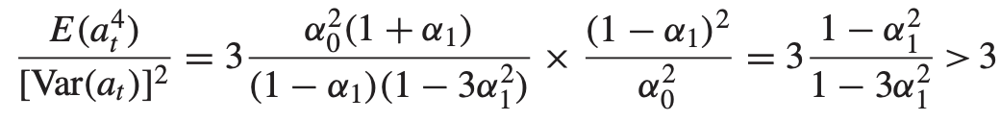

Thus, [the conditions placed on $\alpha_1: 1 - 3 \alpha_1^2 > 0 \longrightarrow 0 ≤ \alpha_1^2 < \frac{1}{3}$ have consequence that], the excess kurtosis of $a_t$ is positive and tail distribution of $a_t$ is heavier than that of the normal distribution. [Seems to me that $a_t^2 = 0 \longrightarrow \frac{\mathbb{E} (a_t^4)}{[\text{Var}(a_t)]^2}$ = 3 not > 3]

In other words, [due to kurtosis > 3,] the shock $a_t$ of a conditional Gaussian ARCH(1) model is more likely than a Gaussian white noise series to produce outliers.  This agrees with the empirical finding that outliers appear more often in asset returns than implied by an iid sequence of normal random variables.

These properties hold for general ARCH models, [beyond ARCH(1)], but the formulas are complicated for higher order ARCH models. 

The condition in (3.5) that $\alpha_i ≥ 0$ can be relaxed.  It is a condition to ensure that the conditional variance $\sigma_t^2$ is positive for all t.  In fact, a natural way to achieve this positiveness of the conditional variance is to rewrite an ARCH(m) model as 

(3.6)

$$\large a_t = \sigma_t \epsilon_t \text{,     } \sigma_t^2 = \alpha_0 + A_{m, t-1}' \Omega A_{m,t-1}$$

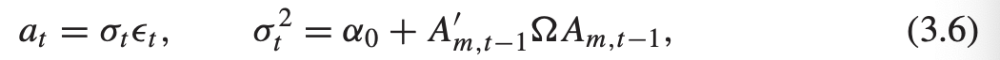

where $A_{m, t-1} = (a_{t-1}, ..., a_{t-m})'$ and $\Omega$ is an m x m nonnegative definite matrix.  The ARCH(m) model in (3.5) requires $\Omega$ to be diagonal. **Thus Engle's model uses a parsimonious approach in order to approximate a quadratic function. [??]** A simple way to achieve (3.6) is to employ a random coefficient model for $a_t$; see CHARMA and RCA models discussed later.

(3.5) 

$$\large a_t = \sigma_t \epsilon_t, \text{            } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$


https://math.stackexchange.com/questions/3032558/the-fourth-moment-of-a-centered-random-variable-is-at-least-equal-to-the-square

Setting $Y - X - \mu, \mathbb{E} Y^4 ≥ (\mathbb{E} Y^2)^2 \text{ because } \mathbb{E} Y^4 - (\mathbb{E} Y^2)^2 = \text{ Var } Y^2 ≥ 0$

Law of Iterated Expectations
https://brilliant.org/wiki/law-of-iterated-expectation/

Exlanation of some of the above formulas is better handled here
https://www.fsb.miamioh.edu/lij14/672_2014_s5.pdf

## 3.4.2 Weakness of ARCH Models

Weaknesses:
1. The ARCH model assumes that positive and negative shocks have same effects on volatility because it [the model and volatility i.e. the modeled volatility] depends on the square of the previous shocks.  In practice, the price of a financial asset responds differently to positive and negative shocks.
2. The ARCH model is restrictive:
    - $\alpha_1^2$ of ARCH(1) model must be in the interval $[0, \frac{1}{3}]$ if the series has a finite fourth moment. This constraint
        - becomes complicated for higher order ARCH models
        - limits the ability of ARCH models with Gaussian innovations to capture excess kurtosis. [Gaussian innovations is Gaussian $a_t$ (w $\mu=0$) that squared enter an ARCH model of $\sigma_t^2$]   
3. The ARCH model does not provide any new insight for understanding the variances of a financial time series.  The ARCH model only provides a mechanical way to describe the behavior of the conditional variance without giving any indication about what causes the behavior to occur.   
4. ARCH models are likely to overpredict the volatilitu because ARCH models respond slowly to large isolated shocks to the return series.

### Gamma is used in Student's t distribution in the next cell

Gamma function used originally to compute z!

!https://en.wikipedia.org/wiki/Gamma_function

$\large \Gamma(z) = \int_0^\infty x^{z-1} e^{-x} dx$

Gamma is used in Student's-t probability density function

https://en.wikipedia.org/wiki/Student%27s_t-distribution

appearing as 

$\large \Gamma \left(\frac{v+1}{2}\right)$

and as 

$\large \Gamma \left(\frac{v}{2}\right)$

where v = fixed degrees of freedom, the function below computes / plots gamma for $z = \frac{v+1}{2}$

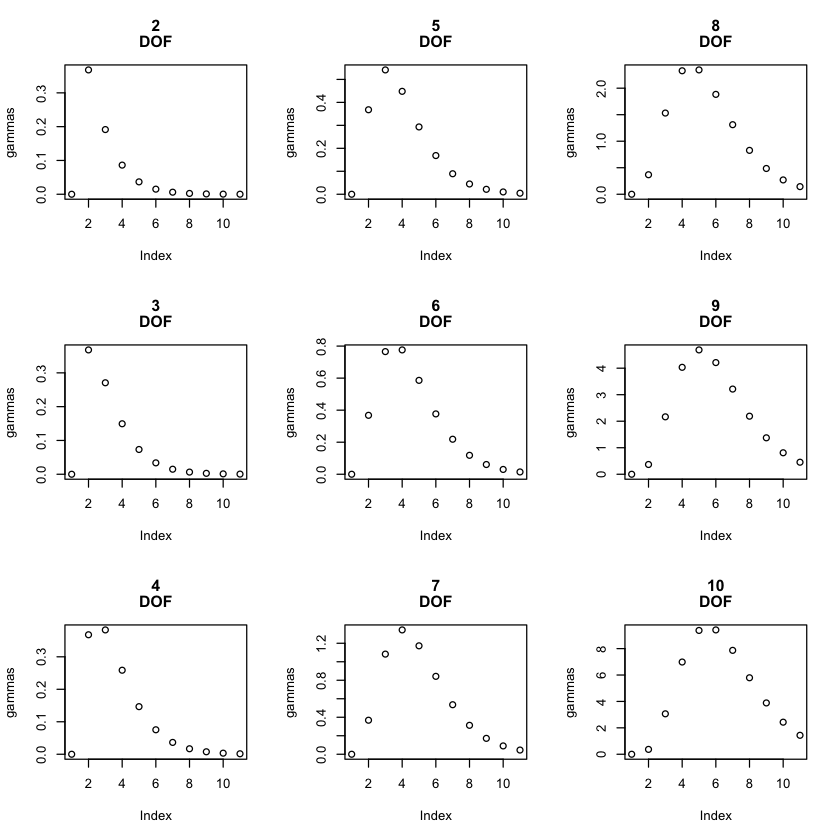

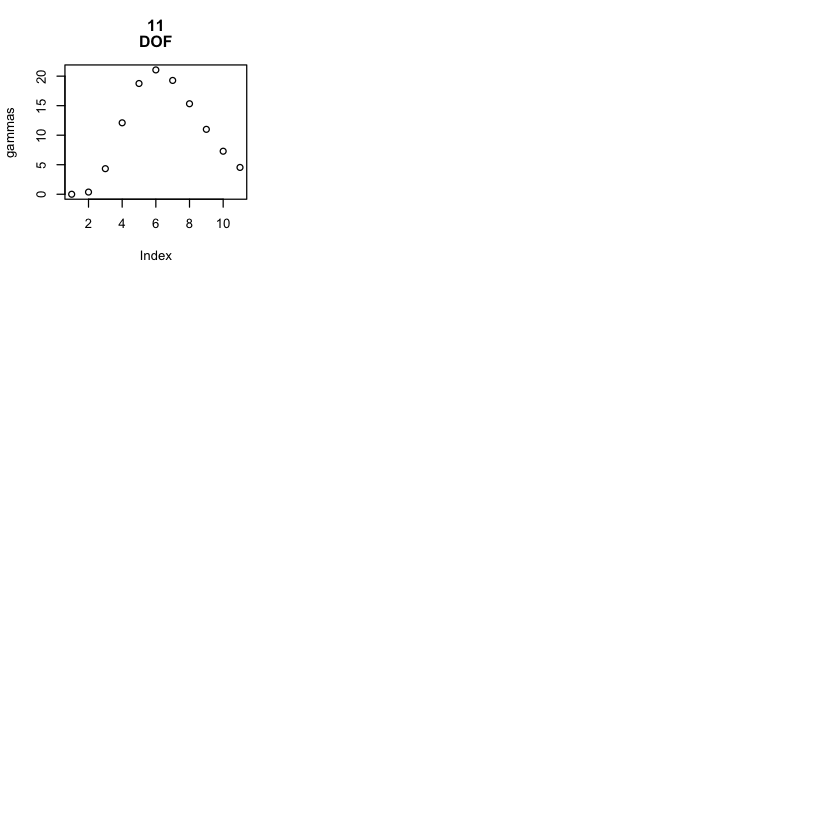

In [48]:
# v degrees of freedom in student t distribution
par(mfcol=c(3,3))
for (v in 2:11) {
    gammas = c()
    for (x in 0:10) {
        z = (v+1)/2
        y = x**(z-1) * exp(-x)
        gammas = c(gammas, y)
    }
    plot(gammas, main=c(v,'DOF'))
}

## 3.4.3 Building an ARCH Model

Specifying ARCH model

### Order determination

Once an ARCH effect is found to be signficant, the PACF of $a_t^2$ can be used to determines the ARCH order as justified here.  [Gives a way to think of ARCH as AR model of $a_t^2$ dependent on prior $a_t^2$ and thus who's oder can be determined by PACF. ]

[Justification:]

- For a given sample, $a_t^2$ is an unbiased estimate of $\sigma_t^2$. Thus, expect that $a_t^2$  is linearly related to $\alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$ in a manner similar to that of an AR(m) model. Note: A single $a_t^2$ is generally **not an efficient estimate** of $\sigma_t^2$ but $a_t^2$ can serve as an approximation that can be informative in specifying the order m. [linear relationship: $\alpha_t = \sigma_t \epsilon_t$ ? and thus the 4 cases for $\epsilon_t$ distributions: normal, std, sstd, ged]

- Alternatively, define $\eta_t = a_t^2 - \sigma_t^2$ where it can be shown that {$\eta$} is **an uncorrelated series** with mean = 0. The ARCH model then takes the form of an AR(m) model for $a_t^2$ except that {$\eta_t$} is **not an iid series**:

[I am unsure whether he means no autocorrelation within {$\eta_t$}  or that {$\eta_t$} is uncorrelated with [orthogonal to?] {$a_t$} or {$\sigma_t$}.  The latter seems a tall ask, orthogonal even taller. and he does say {$\eta_t$} is **not an iid series** next clarified to mean **i** but not **id** which adds weight to the 'correlation' is within {$\eta_t$} and not between {$\eta_t$} and some other series.] 

recall (3.5) 

$$\large a_t = \sigma_t \epsilon_t, \text{            } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$

Substitute AR model of $\sigma_t^2$ from RHS of (3.5) into $a_t^2 = \sigma_t^2 + \eta_t$:

$\large \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$

$\large \eta_t = a_t^2 - \sigma_t^2$

$\large a_t^2 = \sigma_t^2 + \eta_t$

$\large a_t^2 = \sigma_t^2 + \eta_t = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2 + \eta_t$

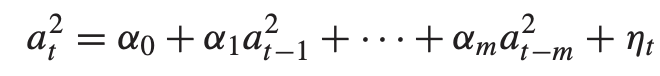

[Think $\eta_t$ is not iid: is independent $\approx$ uncorrelated, is not identically distributed.]

From Chapter 2, PACF of $a_t^2$ is a useful tool to determine order m.  Because [$\eta_t$] are **not identically distributed**, the least-squares estimates of this model $a_t^2 = \sigma_t^2 + \eta_t = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2 + \eta_t$ are **consistent but not efficient**.  The PAC of $a_t^2$ may not be effective when the sample size is small.[Why does **not id** make AR of $\alpha_{t-i}$ consistent but not efficient?]

[but PACF is useful when sample size is not small because we estimate m via an AR model of $a_t^2$]

https://personal.utdallas.edu/~scniu/OPRE-6301/documents/Estimation.pdf
**unbiased** = expected value of estimator is the population parameter: the sample mean $\bar{X}$ is **an** estimator $\hat{\mu}$ for parameter $\mu$.  **An** estimator $\hat{\mu}$ is unbiased **if** $E(\hat{\mu}) = \mu$.  The sample mean $\bar{X}$ is **an** unbiased estimator for the population mean $\mu$ **since** $E(\bar{\mu}) = \mu$.  **"an"** is used above because there are other estimators, $E(\hat{\mu})$.

**consistent** = an estimator is consistent if difference from population value declines as sample size increases. unbiased is a precondition for consitent.  formally, **an** unbiased estimator is consistent if Var$(\hat{mu}) \longrightarrow 0 \text{ as } n \longrightarrow \infty$

**efficient** = the estimator with the smaller variance is more efficient.

### Estimation

["order" = number of parameters precedes "estimation" = scale of parameters.]

ARCH estimation uses **different likelihood functions** depending on the **distributional assumptions of $\epsilon_t$** [which is iid and in " practice ... often assumed to follow s standard normal, or a standardized Student-t or a generalized error distribution.]

[In each case, product of PDF gves joint probabilities since they are iid and no conditionals needed(?) for likelihood function.  Then move $f(a_1, ..., a_m | \alpha)$ into the defined solution for conditional likelihood, then take log for conditional log likkelihood].

[**NORMAL**]

Under the **normality** assumption [for $\epsilon_t$], the likelihood function of an ARCH(m) model is [merely the product of the probability densities - see $\frac{1}{\sqrt{2\pi\sigma_t^2}} e^{-\frac{a_t^2}{2\sigma_t^2}}$ in "Families of densities" here https://en.wikipedia.org/wiki/Probability_density_function, where x-$\mu$ is $a_t$]

$$\begin{aligned} 
\large f(a_1, ..., a_T | \alpha) &\large= f(a_T | F_{T-1}) f(a_{T-1} | F_{T-2}) ... f(a_{m+1} | F_m)f(a_1, ..., a_m | \alpha) \\
&\large= \prod_{t=m+1}^T \frac{1}{\sqrt{2\pi\sigma_t^2}} exp \left(-\frac{a_t^2}{2\sigma_t^2} \right) \times f(a_1, ..., a_m | \alpha)
\end{aligned}$$

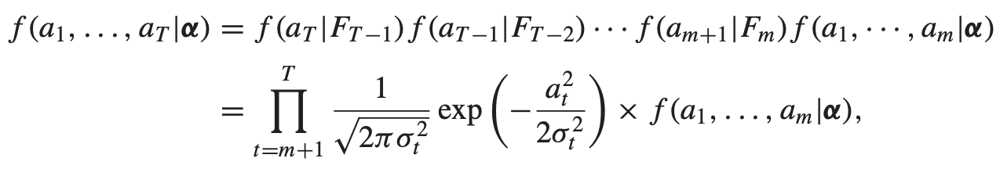

where:
- $\mathbf{\alpha} = (\alpha_0, \alpha_1, ..., \alpha_m)'$ 
- $f(a_1, ..., a_m | \alpha)$ 
    - is the joint probability density function of $a_1, ..., a_m$.
    - is often droped from this likelihood function  
        - because exact form of $f(a_1, ..., a_m | \alpha)$ is complicated
        - when the sample size is sufficiently large
        
Dropping the $f(a_1, ..., a_m | \alpha)$ portion, results in using the conditional likelihood function [with the additional conditional]:

$$
\large f(a_{m+1}, ..., a_T | \alpha, a_1, ..., a_m) = \prod_{t=m+1}^T \frac{1}{\sqrt{2\pi\sigma_t^2}} exp \left(-\frac{a_t^2}{2\sigma_t^2} \right))
$$

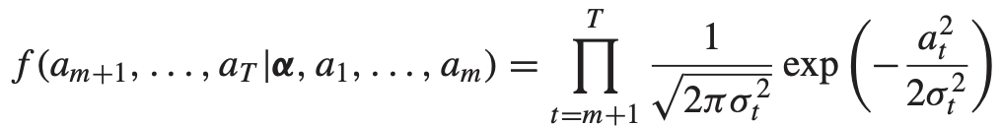

where $\sigma_t^2$ is evaluated recursively. 

[recursive means plugging the derived $a_t$'s and $\alpha$s into (3.3) $\sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$ and then using that $\sigma_t^2$ into the next round of optimization.] 

Estimates via maximizing this likelihood function are referred to as **the conditional maximum-likelihood estimates (MLE) under normality**.

Maximizing the conditional-likelihood function is equivalent to maximizing its logarithm which is easier to handle.  The **conditional log-likelihood function** is 

$$\large \ell(a_{m+1}, ..., a_T | \alpha, a_1, ..., a_m) = \sum_{t=m+1}^T \left[ -\frac{1}{2} ln(2\pi) - ln(\sigma_t^2) - \frac{1}{2} \frac{a_t^2}{\sigma_t^2} \right]
$$

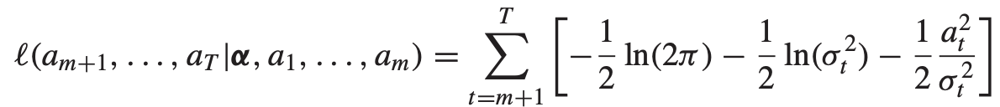

Since the first term $ln(2\pi)$ does not involve any parameters, the log-likelihood function becomes

$$\large \ell(a_{m+1}, ..., a_T | \alpha, a_1, ..., a_m) = \sum_{t=m+1}^T \left[ -  \frac{1}{2} ln(\sigma_t^2) - \frac{1}{2} \frac{a_t^2}{\sigma_t^2} \right]
$$

$$\large \ell(a_{m+1}, ..., a_T | \alpha, a_1, ..., a_m) = - \sum_{t=m+1}^T \left[  \frac{1}{2} ln(\sigma_t^2) + \frac{1}{2} \frac{a_t^2}{\sigma_t^2} \right]
$$

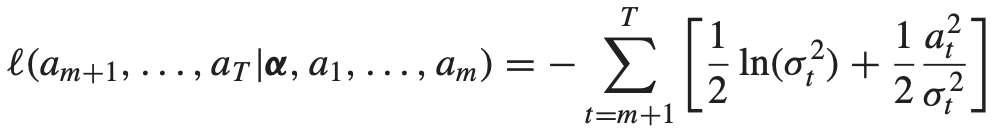

where $\sigma_t^2$ can be evaluated recursively [from its ~AR(m) formulation] as 

$$\large \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$

[which is drawn directly from (3.5) copied here by me]

$$\large a_t = \sigma_t \epsilon_t, \text{            } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$


[**FAT-TAILED**]

Under the assumption that $\epsilon_t$ follows a **heavy-tailed distribution** such as the **standardized Student-t distribution**, [the likelihood function of an ARCH(m) model unrolled this way:] 

Let $x_v$ be a Student-t distribution with v degrees of freedom.

Then, 

$$\large \text{Var}(x_v) = \frac{v}{v - 2} \text{ for } v > 2$$

[from here https://en.wikipedia.org/wiki/Student%27s_t-distribution can see where that variance comes from when v > 2]:

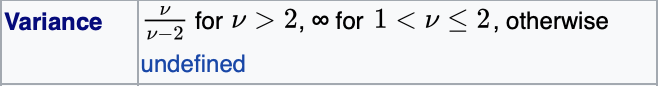

and use [this to represent $\epsilon_t$ because $\epsilon - \mu_{\epsilon} = x_v - 0$ and the variance of $x_v$ is in the denominator:]  

$$ \large \epsilon_t = \frac{x_v}{\sqrt{\frac{v}{v-2}}}$$

The probability density function of $\epsilon_t$ is 

(3.7)

$$\large f(\epsilon_t | v) = \frac{\Gamma \left[\frac{v+1}{2} \right]}{\Gamma \left(\frac{v}{2}\right) \sqrt{(v-2)\pi}} \left( 1 + \frac{\epsilon_t^2}{v-2} \right)^{\large-\frac{v+1}{2}} \text{,    } v > 2$$

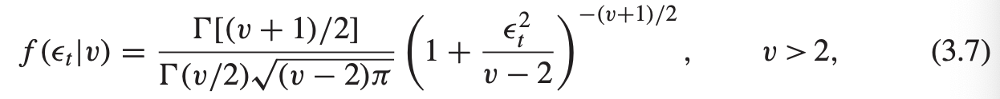

where $\Gamma(x)$ is the usual gamma function: 

$$\large \Gamma(x) = \int_0^{\infty} y^{x-1} e^{-y} dy$$
https://en.wikipedia.org/wiki/Gamma_function#Motivation

https://en.wikipedia.org/wiki/Student%27s_t-distribution

Using $a_t = \sigma_t \epsilon_t$, obtain the **conditional-likelihood function of $a_t$ [under a standardized Student-t]** as follows:

$\epsilon_t= \frac{a_t}{\sigma_t}$

[so replace $\epsilon$ on the RHS in parentheses of (3.7) with $\frac{a_t}{\sigma_t}$ and multiply the series of PDF of the joint probabilities for $a_{m+1}, ..., a_T$]: 

$$\large f(a_{m+1}, ..., a_T|\boldsymbol\alpha, A_m) = \prod_{t=m+1}^T \frac{\Gamma \left[\frac{v+1}{2} \right]}{\Gamma \left(\frac{v}{2}\right) \sqrt{(v-2)\pi}} \frac{1}{\sigma_t} \left[ 1 + \frac{a_t^2}{(v-2)\sigma_t^2} \right]^{-\frac{v+1}{2}}$$

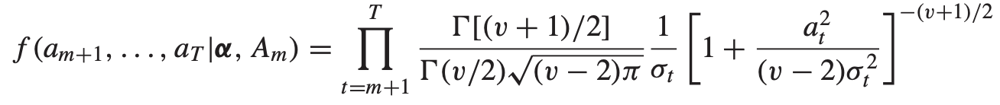

where v > 2 and $A_m = (a_1, a_2, ..., a_m)$.

Refer to the estimates that maximize this likelihood function as the **conditional MLEs under t distribution**.  The degrees of freedom of the t distribution can be specified a priori or estimated jointly with the other parameters.  A value between 4 and 8 is often used if it is prespecified. 

If the degrees of freedom v of the Student-t distribution is prespecified then the conditional log-likelihood function is:

(3.8)

$$\large \ell(a_{m+1}, ..., a_T|\boldsymbol\alpha, A_m) = - \sum_{t=m+1}^T \left[ \frac{v+1}{2} ln \left( 1 + \frac{a_t^2}{(v-2)\sigma_t^2} \right) + \frac{1}{2} ln(\sigma_t^2) \right]$$

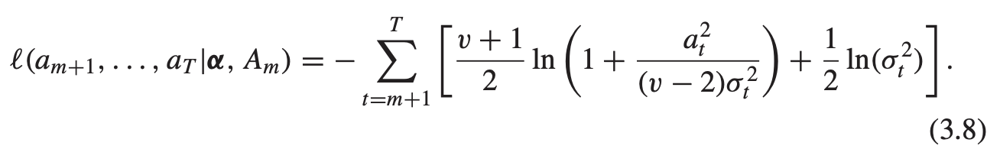

To estimate v jointly with the other parameters, the log-likelihood function becomes:

$$\large \ell(a_{m+1}, ..., a_T|\boldsymbol\alpha, v, A_m) = (T - m) \left\{ ln \left[ \Gamma \left( \frac{v + 1}{2} \right) \right] - ln \left[ \Gamma \left( \frac{v}{2} \right) \right] - 0.5 ln [(v-2)\pi] \right\} + \ell(a_{m+1}, ..., a_T | \boldsymbol\alpha, A_m)$$

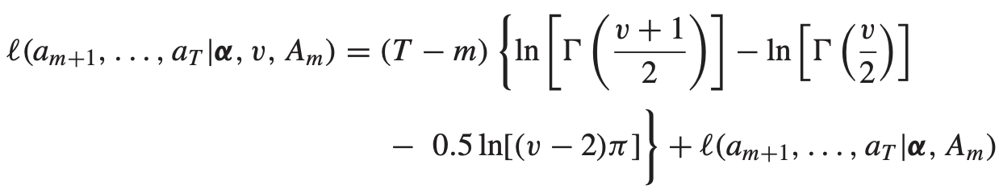

where the second term is given in (3.8) so in complete form it is :

$$\large \ell(a_{m+1}, ..., a_T|\boldsymbol\alpha, v, A_m) = (T - m) \left\{ ln \left[ \Gamma \left( \frac{v + 1}{2} \right) \right] - ln \left[ \Gamma \left( \frac{v}{2} \right) \right] - 0.5 ln [(v-2)\pi] \right\} - \sum_{t=m+1}^T \left[ \frac{v+1}{2} ln \left( 1 + \frac{a_t^2}{(v-2)\sigma_t^2} \right) + \frac{1}{2} ln(\sigma_t^2) \right]$$

[**SKEWED**]

Beside fat tails [like Student t], empirical distributions of asset returns can be skewed. To handle a skewed characteristic of asset returns, the **Student-t distribution** is modified to a **skew-Student-t distribution** of which there are several versions including **Fernandez and Steel** (1998) which introduces skewness into any continuous unimodal univariate distribution that is symmetric wrt zero.  For innovations, $\epsilon_t$, of an ARCH process **Lambert and Laurent** (2001) apply Fernandez and Steel method to the standardized Student-t distribution in (3.7) to produce **a standardized skew Student-t distribution** whose PDF is:

(3.9)

$$\large
g(\epsilon_t|\xi, v) =
\begin{cases}
\frac{2}{\xi + \frac{1}{\xi}} \varrho f[\xi(\varrho\epsilon_t + \bar{\omega})|v] & \text{if } \epsilon_t < -\frac{\bar{\omega}}{\varrho} \\
\frac{2}{\xi + \frac{1}{\xi}} \varrho f\left[\frac{(\varrho\epsilon_t + \bar{\omega}}{\xi}|v\right] & \text{if } \epsilon_t ≥-\frac{\bar{\omega}}{\varrho}
\end{cases}
$$

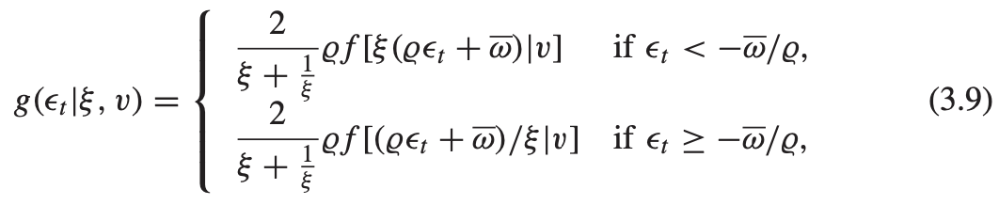

where 
- f(.) [that is $f[\xi(\varrho\epsilon_t + \bar{\omega})|v]$] is the PDF of the standardized Student-t distribution shown in (3.7) as $f(\epsilon_t|v)$ but replacing $\epsilon_t$ are
    - $\large \xi(\varrho\epsilon_t + \bar{\omega}) \text{ when } \epsilon_t < -\frac{\bar{\omega}}{\varrho}$
    - $\large \frac{(\varrho\epsilon_t + \bar{\omega})}{\xi} \text{ when } \epsilon_t ≥-\frac{\bar{\omega}}{\varrho}$
- $\xi$ is the skewness parameter
- $\xi^2$ is equal to ratio of probability masses above and below the mode of the distribution, and thusly, a measure of the skewness.
- v > 2 is the degrees of freedom
- $\bar{\omega}$

$$\large \bar{\omega} = \frac{\Gamma \left( \frac{v-1}{2} \right) \sqrt{v-2}}{\sqrt{\pi}\Gamma \left(\frac{v}{2} \right)} (\xi -\frac{1}{\xi})$$ 

- $\varrho$

$$\large \varrho^2 = (\xi^2 + \frac{1}{\xi^2} -1) - \bar{\omega}^2$$

[**GED**]

Finally, $\epsilon_t$ may assume a **generalized error distribution (GED)** with PDF:

(3.10)

$$ \large \text{f(x)} = \frac{\text{v} \times exp(-\frac{1}{2}|\frac{x}{\lambda}|^v)}{\lambda 2^{1+\frac{1}{v}}\Gamma(\frac{1}{v})}$$

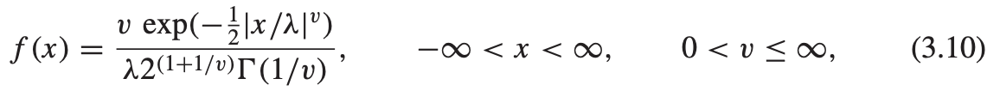

where
- $-\infty < x < \infty$
- $0 < v ≤ \infty$
- $\Gamma$ is the gamma function
- $\lambda$:

$$\large \lambda = \left[2^{-\frac{2}{v}}\frac{\Gamma(\frac{1}{v})}{\Gamma(\frac{3}{v})}\right]^{\frac{1}{2}}$$

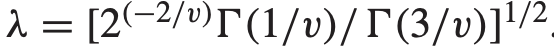

This distribution reduces to a Gaussian distribution if v = 2 and it has heavy tails when v < 2.  The **conditional log likelihood function** $\ell(a_{m+1}, ..., a_T|,\boldsymbol\alpha, \mathbf{A_m})$ can easily be obtained.

Note: Skew Student-t, skew normal, and skew GED distributions are available in the `fGarch` package of `Rmetrics`.  The commands are `sstd`, `snorm` and `sged` as shown in the R demo below.

[**need** to know how to derive normal, gaussian, std, ged, sstd, snorm, sged likelihood functions and expected values to code up these algorithms and test them!]

### Model checking

For a properly specified ARCH model, the standardized residuals ...

$$ \large \tilde{a_t} = \frac{a_t}{\sigma_t}$$

... form a sequence of iid random variables. 

To check the **adequacy** of the properly fitted ARCH model, [correctly specified type and order of model] examine the standardized residuals series {$\tilde{a_t}$} with 
- The Ljung-Box statistics of standardized residuals $\tilde{a}_t$ used to check the **adequacy** of the mean equation [coefficients in (3.3)].

(3.3)

$$ \large r_t = \mu_t + a_t, \,\, \mu_t = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it} $$

- The Ljung-Box statistics of standardized residuals $\tilde{a}_t^2$ used to check the **adequacy** of the volatility equation.

(3.4) 

$$\large \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = \text{Var}(a_t|F_{t-1})$$

- The skewness, kurtosis, and quantile-quantile plot QQ plot of standardized residuals {$\tilde{a_t}$} are used to check the **validity** of the distribution assumption [normal, fat tailed, skewed as discussed above].

[I think $\tilde{a}_t = \frac{a_t^2}{\sigma_t^2}$ is computed from $a_t$ drawn from the **mean equation** $r_t = \mu_t + a_t$ that is then used to compute estimates of $\sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$.  Then, $\tilde{a}_t$'s Ljung-Box assesses adequacy of the mean equation and its square $\tilde{a}_t^2$'s Ljung-Box assesses the validity of the **vol equation**]


 

### Forecasting

Forecasts of the ARCH model in (3.5) ...

(3.5) 

$$\large a_t = \sigma_t \epsilon_t, \text{            } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$

... are obtained recursively as those of an AR model.  

Consider an ARCH(m) model.  At the forecast origin h, the 1-step-ahead forecast begins with t = h where $\sigma_{h+1}^2$ is: 

$$\large \sigma_h^2(1) = \alpha_0 + \alpha_1 a_{h+1-1}^2 + ... + \alpha_m a_{h+1-m}^2$$

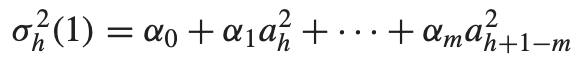

The 2-step ahead forecast begins with t = h + 2

$$\large 
\begin{aligned}
\sigma_h^2(2) &= \alpha_0 + \alpha_1 a_{h+2-1}^2 + \alpha_2 a_{h+2-2}^2 + ... + \alpha_m a_{h+2-m}^2 \\
&= \alpha_0 + \alpha_1 a_{h+1}^2 + \alpha_2 a_{h}^2 + ... + \alpha_m a_{h+2-m}^2\\
&= \alpha_0 + \alpha_1 \sigma_h^2(1) + \alpha_2 a_{h}^2 + ... + \alpha_m a_{h+2-m}^2
\end{aligned}$$

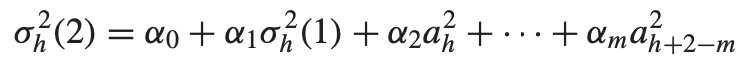

The $\ell$-step ahead forecasts is

(3.11)

$$
\large 
\sigma_h^2(\ell) = \alpha_0 + \sum_{i=1}^m \alpha_i \sigma_h^2(\ell-i)
$$

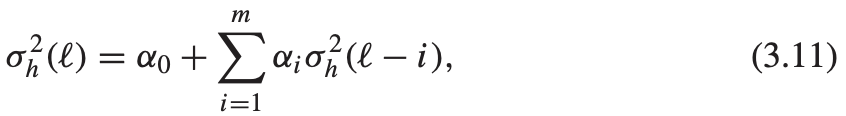

where  

$\large \sigma_h^2(\ell - i) = a_{h+\ell-i}^2 \text{if} \ell-i ≤ 0$ 

[i.e. $a_{h+\ell-i}^2$ will be a past innovation if forecasting $\ell$ steps ahead with m > $\ell$ parameters and will be a future recursive volatility if m < $\ell$].

## 3.4.4 Some examples

2 examples illustrate ARCH modeling:

### Example 3.1

The modeling procedure is applied to build a simple ARCH model for the monthly log returns of INTC.
- Figure 3.2 show sample ACF and PACF of squared returns that **indicate conditional heteroscedasticity**.
- The ARCH test shown in Section 3.3.1 **confirms heteroscedasticity** and is repeated here.

#### Begin cut and Paste of example from above:

[recall $a_t = r_t - u_t =$ "residuals of the mean equation"]

Example:
- monthly log returns INTC from 1973 to 2008 from Example 3.1
- the series does not have significant serial correlation and thus can be used directly to test for the ARCH effect: Q(m) statistics of the return series give Q(12) = 18.26 with a p value 0.11 confirming no serial correlation in the data at the 10% significance level.
- However, the squared [residuals of the mean equation] show strong ARCH effects 
    - Lagrange multiplier test statistic = $F \approx 53.62$ and p value close to zero.
    - The Ljung-Box statistics of the $a_t = r_t - \mu$ series [aka the residuals of the mean equation] also show strong ARCH effects with Q(12) = 89.85 with p value close to zero. 
- R demonstration
    - libraries
    - test for autocorrelation in the log returns
    - test the ARCH effects = autocorrelation in $a_t^2$ the squared residuals of the mean equation via Lagrange and Ljung-Box.
        - Brief on Lagrange test: 
            - log of original series [not the squared residuals of mean equation] are fed into ArchTest 
            - ArchTest performs the regression on residuals of mean equation squared series:

$$a_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ··· + \alpha_m a_{t-m}^2 + e_t, t = m+1, ..., T$$

- an F Test statsitic is compared to chi-squared distribution at alpha **level of significance** to determine whether alphas **of the regression** are zero per the null hypothesis or if the null hypothesis can be rejected. 

#### End Cut and Paste from above:

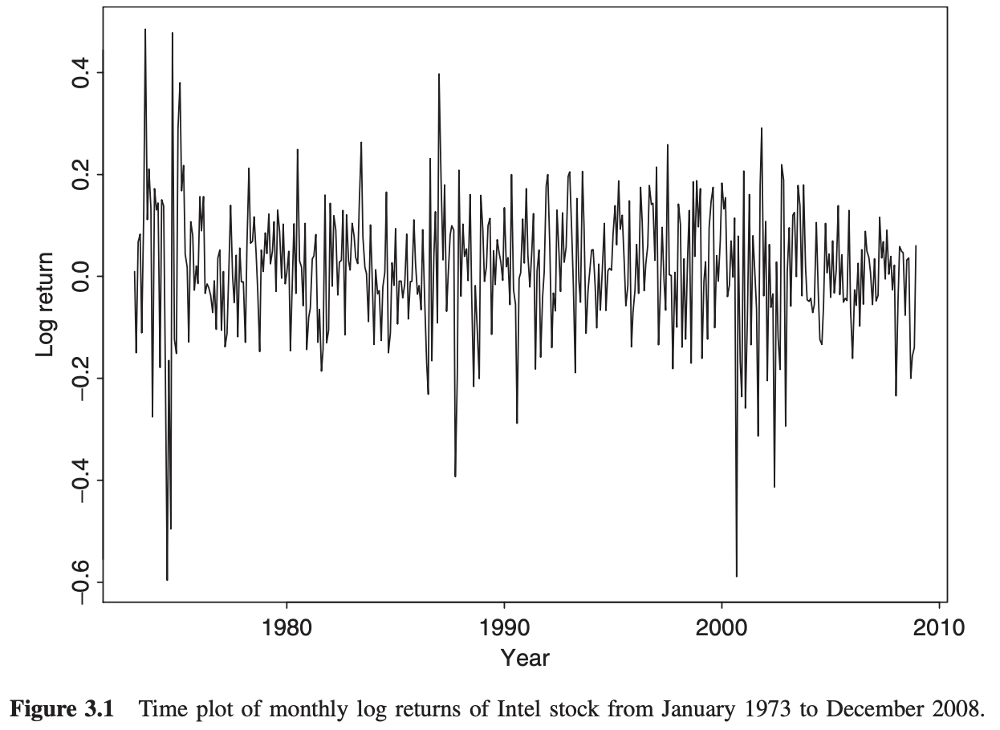

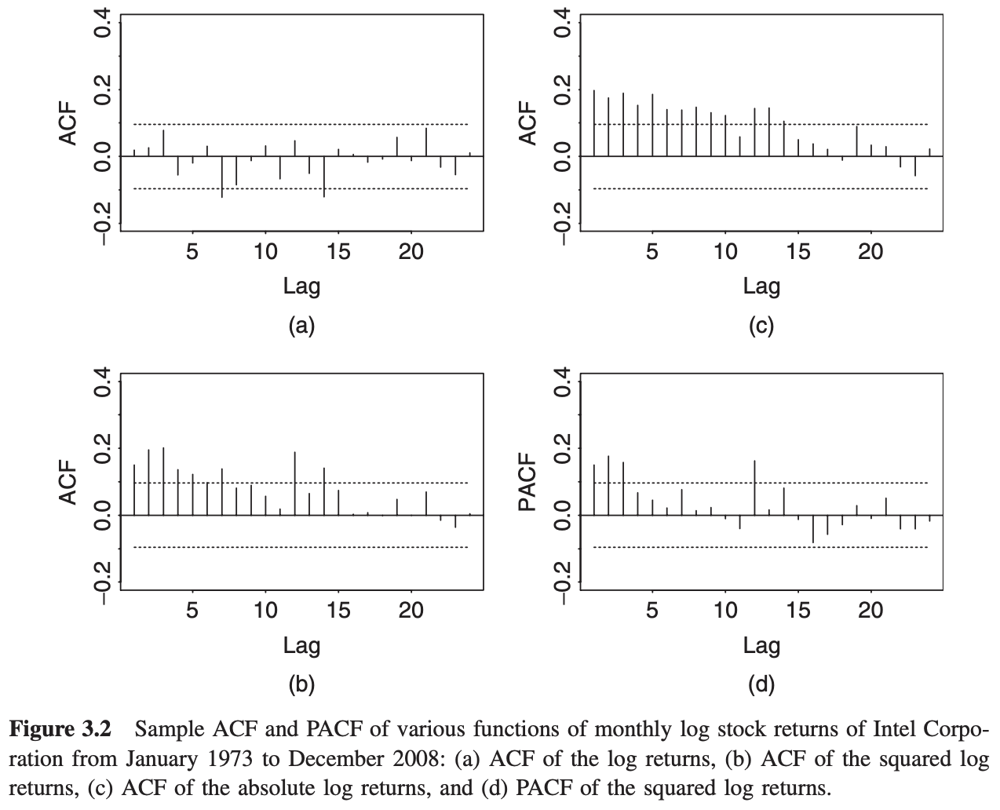


- Figure 3.2(d) sample PACF indicates that an ARCH(3) model might be the **appropriate** model [The R code to reproduce these Figures is below.]
- Thus, the **specified** model [mimics the **mean (3.3) equation**, **the volatility (3.4) equation** and the **ARCH (3.5) model**  cut and pasted here:] ...

(3.3)

$$ \large r_t = \mu_t + a_t, \,\, \mu_t = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it} $$

(3.4) 

$$\large \sigma_t^2 = \text{Var}(r_t|F_{t-1}) = \text{Var}(a_t|F_{t-1})$$

(3.5) 

$$\large a_t = \sigma_t \epsilon_t, \text{            } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + ... + \alpha_m a_{t-m}^2$$


... as follows for the monthly log returns of INTC:

$$\large r_t = \mu + a_t \text{,     } a_t = \sigma_t \epsilon_t \text{,     } \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + \alpha_2 a_{t-2}^2 + \alpha_2 a_{t-3}^2$$

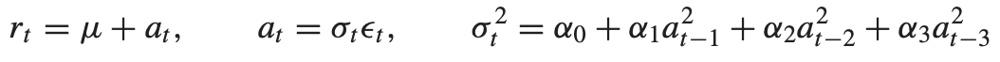

**Assuming** that $\epsilon_t$ are **iid standard normal** obtain the model:

$$\large r_t = 0.0122 + a_t \text{,     } \sigma_t^2 = 0.0106 + 0.2131 a_{t-1}^2 + 0.0770 a_{t-2}^2 + 0.0599 a_{t-3}^2$$

where standard error of the parameters are 0.0057, 0.0010, 0.0757, 0.0480 and 0.0688 in the S-Plus output shown here:

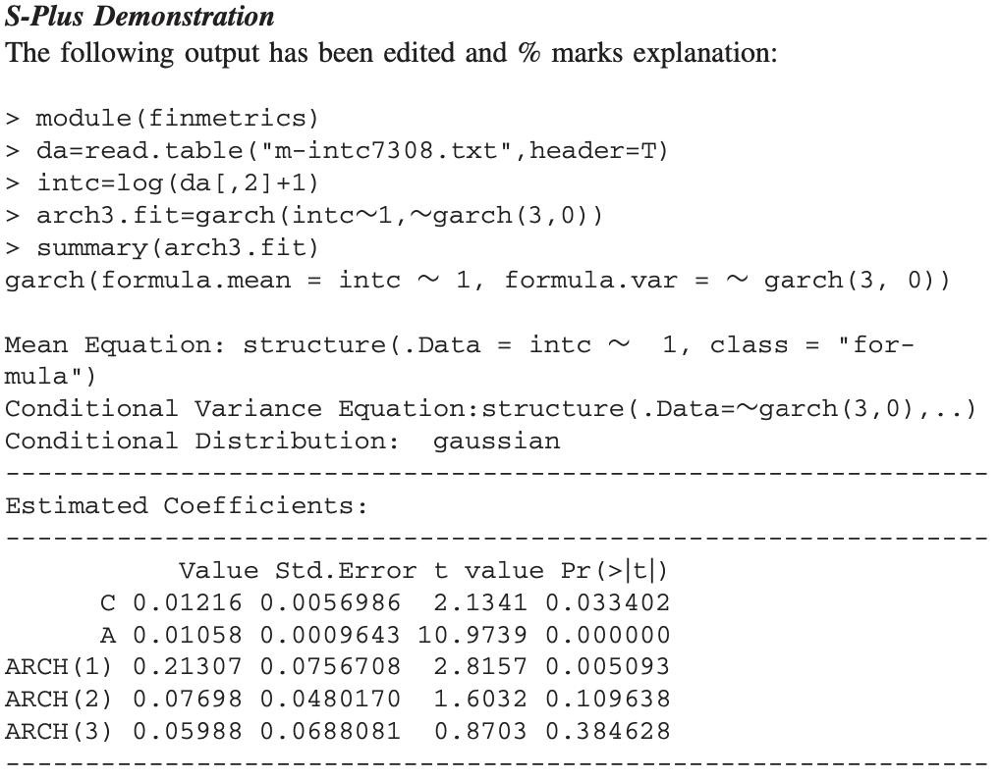

"While the estimates meet the general requirement of an ARCH(3) model" [??], the estimates of $\alpha_2$ and $\alpha_3$ are statistically nonsignificant at the 5% level, and are removed for a simplified model.

(3.12)

$$\large r_t = 0.0126 + a_t \text{,     } \sigma_t^2 = 0.0111 + 0.3560 a_{t-1}^2 $$

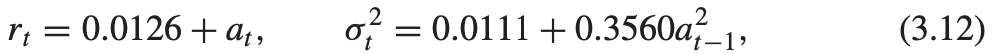

where standard error of the parameters are 0.0053, 0.0010 and 0.0761 yielding a conclusion that all estimates are highly significant. S-Plus output here:

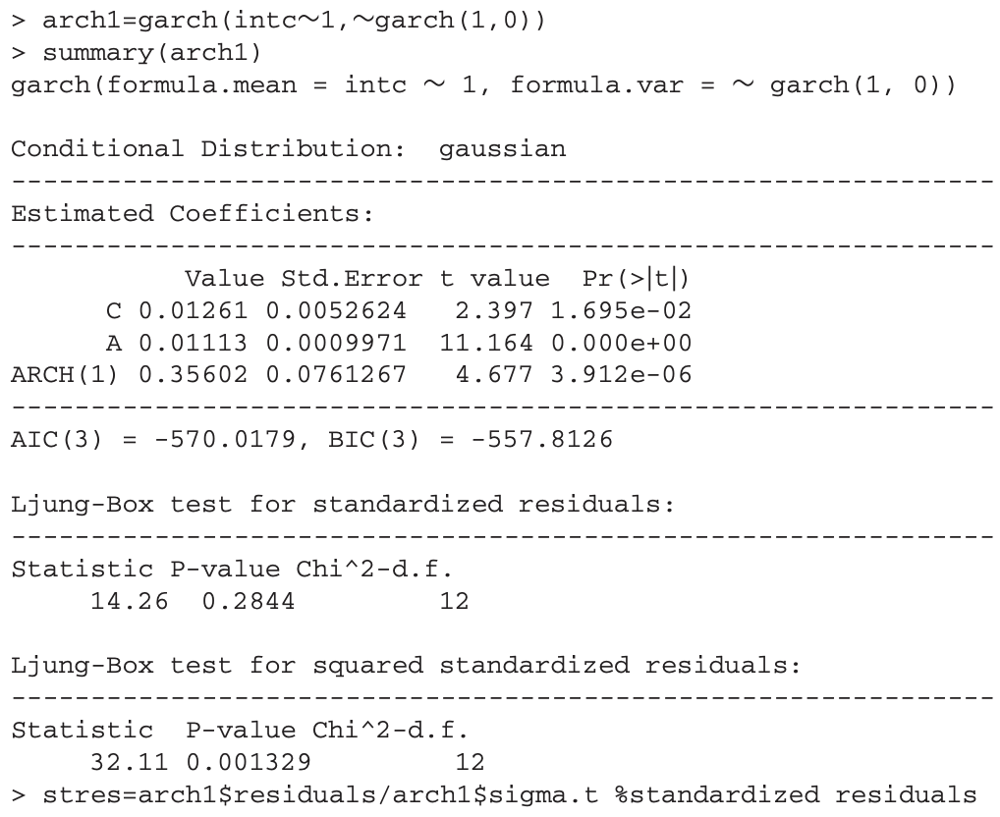

Figure 3.5 of standardized residuals {$\tilde{a_t}$} and the the sample ACF "of some functions" [??] of {$\tilde{a_t}$}.

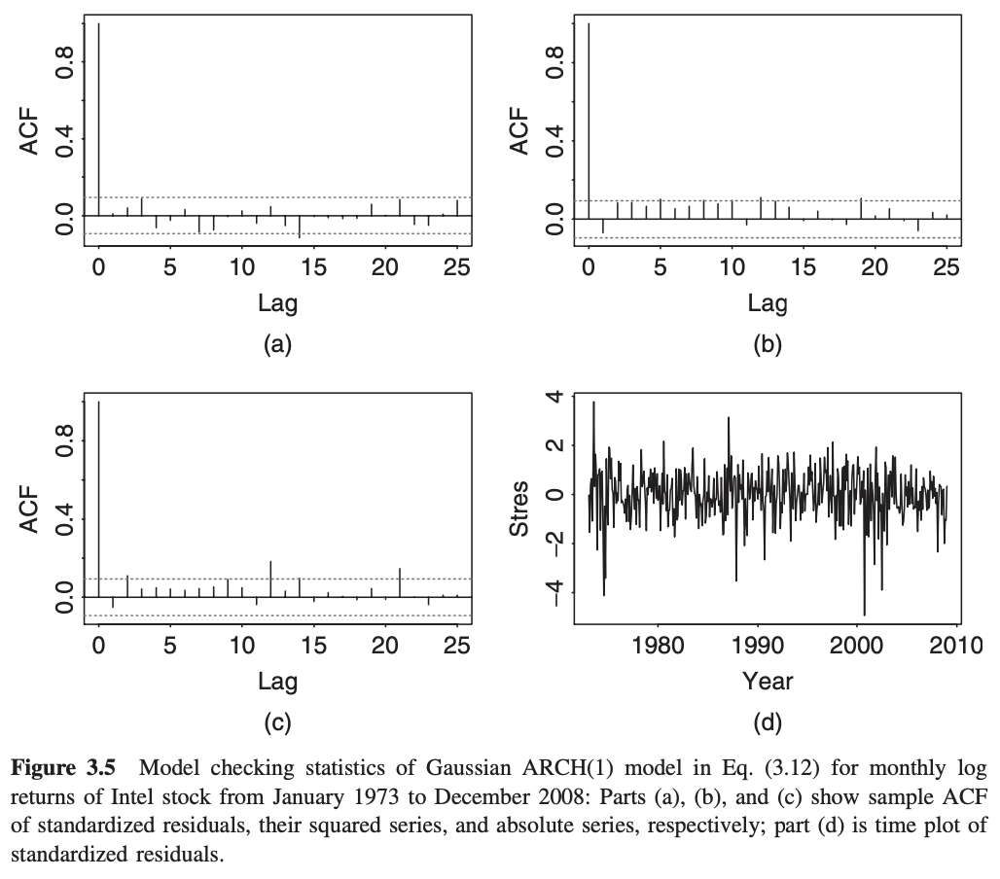

The Ljing-Box statistics of the standardized residuals give Q(10) = 14.75 with a p values of 0.14, [indicating one cannot reject the hyposthesis of no autocorrelation amongst {$\tilde{a_t}$} and thus no ARCH effects].  

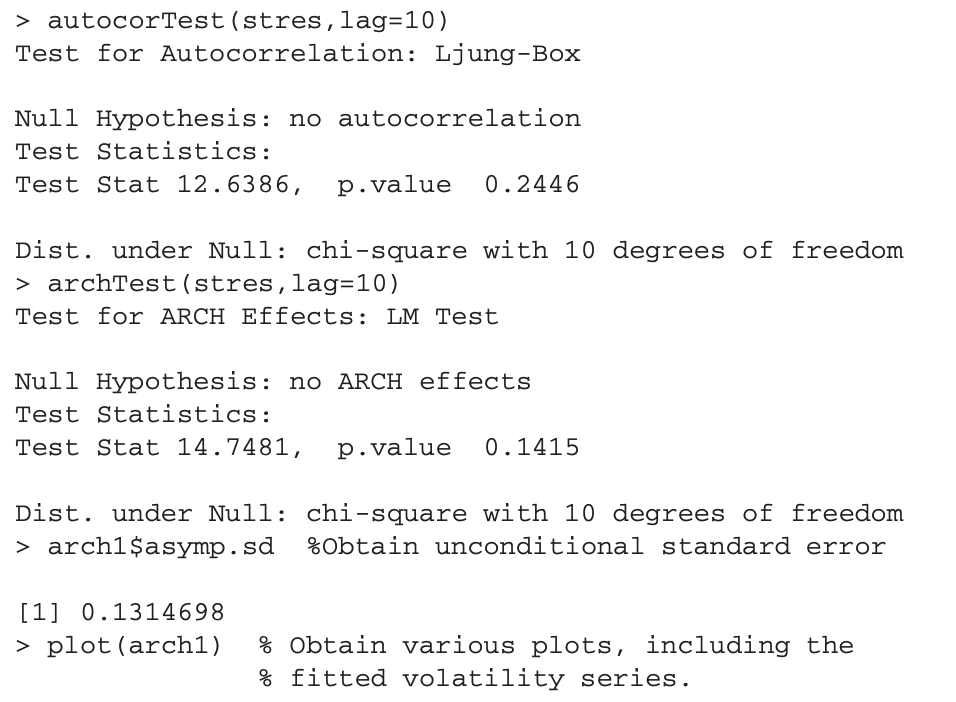

Consequently, the ARCH(1) model in (3.12) is **adequate** for describing the conditional heteroscedasticity of the data at the 5% level.

The ARCH(1) model in (3.12) has interesting properties:
1. The expected monthly log return for INCT is 1.26% [from C = 0.1261] including the span of time after the internet bubble.
2. $\hat{\alpha}_1$ = 0.356 [from ARCH(1) = 0.35602] which means $0 < \hat{\alpha}_1^2 = 0.35602^2 = 0.1267502404 < \frac{1}{3}$ which means that the **unconditional fourth moment** of the monhtly log returns of INTC exists.
3. The unconditional standard deviation of $r_t$ is $\sqrt{\frac{0.0111}{1-0.0356}} \approx 0.1315$ [from A = 0.01113 = $\alpha_0$ and ARCH(1) = 0.35602 = $\alpha_1$].
4. The ARCH(1) model can be used to predict monthly volatility of the INTC series.

### Example 3.1 similar commands in R generate "similar" output to S-Plus

Confirming heteroscedasticity:

load data  
take log of 1 + simple returns  
Ljung-Box test on log returns  
Compute innovation $a_t = r_t - \mu_t$   
Ljung-Box test on squared innovations = squared residuals of the mean equation    
Lagrange Multiplier test on the log returns   

Plotting Figure 3.2

ARCH(3) model

R doesnt agree 
$r_t = 0.011852 + a_t$ 
$\sigma_t^2 = 0.010588 + 0.27148 a_{t−1}^2 + 0.072747 a_{t−2}^2 + 0.03080 a_{t−3}^2$,

with the S-Plus figures:
$r_t = 0.0122 + a_t$ 
$\sigma_t^2 = 0.0106 + 0.2131 a_{t−1}^2 + 0.0770 a_{t−2}^2 + 0.0599 a_{t−3}^2$,

But R does also see SE of $\alpha_2$ and $\alpha_3$ doesnt allow rejection of $H_0$ that these coeffs = 0. 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu      0.011852    0.005640    2.102   0.0356 *  
omega   0.010588    0.001284    8.249 2.22e-16 ***
alpha1  0.237149    0.114734    2.067   0.0387 *  
alpha2  0.072747    0.046990    1.548   0.1216    
alpha3  0.053080    0.046526    1.141   0.2539   

Trim model to ARCH(1) model

R doesnt agree:
$r_t = 0.012637 + a_t$ 
$\sigma_t^2 = 0.011195 + 0.379492 a_{t-1}^2$, (3.12)

with the S-Plus figures:
$r_t = 0.01261 + a_t$ 
$\sigma_t^2 = 0.01113 + 0.35602 a_{t-1}^2$, (3.12)

But R does see the coefficients significance allowing rejection of $H_0$, though R shows constant p value 0.02 whereas S-Plus shows a constant's p value = 0

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu      0.012637    0.005428    2.328  0.01990 *  
omega   0.011195    0.001239    9.034  < 2e-16 ***
alpha1  0.379492    0.115534    3.285  0.00102 ** 

R does get the same notables:
1. INTC monthly return = 1.26%
2. $\hat{\alpha}_1^2 = 0.379492^2 = 0.144014178064 < \frac{1}{3}$ --> unconditional 4th moment of monthly log return exists
3. unconditional stdev of $r_t = \sqrt{\frac{0.011195}{(1-0.379492)}} = 0.1343$
4. ARCH(1) can be used to predict monthly volatility of INTC returns

In [51]:
install.packages("FinTS")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [52]:
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
Box.test(intc, lag=12, type="Ljung")

at <- intc-mean(intc)
Box.test(at^2,lag=12,type="Ljung")

library(FinTS)
ArchTest(intc, lag=12)


	Box-Ljung test

data:  intc
X-squared = 18.263, df = 12, p-value = 0.1079



	Box-Ljung test

data:  at^2
X-squared = 89.851, df = 12, p-value = 5.274e-14


Loading required package: zoo


Attaching package: ‘zoo’


The following object is masked from ‘package:timeSeries’:

    time<-


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



Attaching package: ‘FinTS’


The following object is masked from ‘package:forecast’:

    Acf





	ARCH LM-test; Null hypothesis: no ARCH effects

data:  intc
Chi-squared = 53.62, df = 12, p-value = 3.195e-07


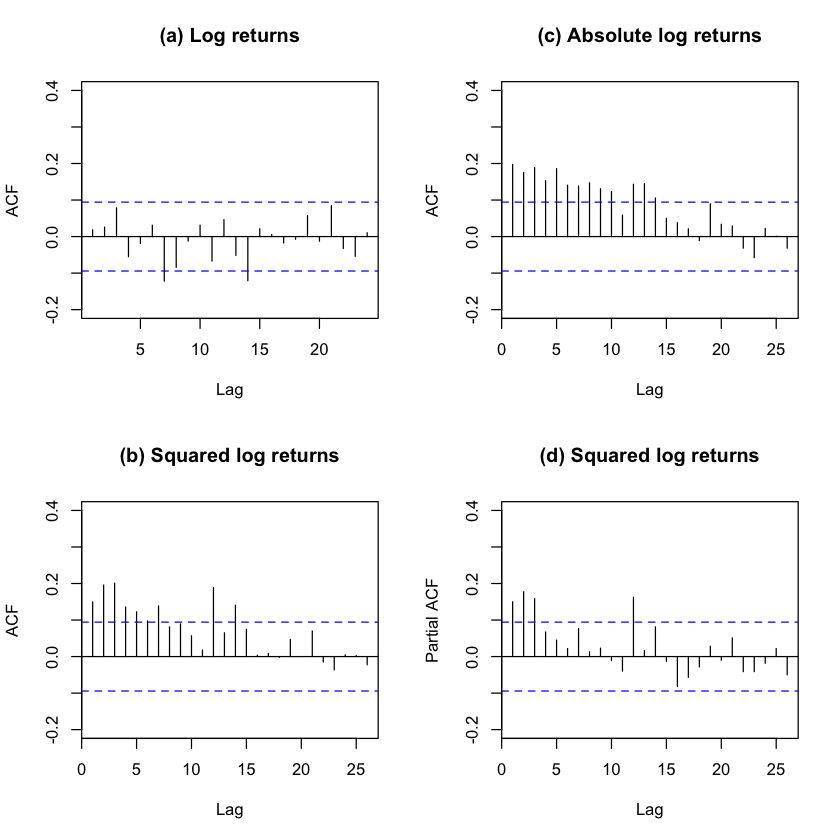

In [53]:
op <- par(mfcol=c(2,2))
Acf(intc, lag.max = 24, ylim=c(-0.2,0.4), main='(a) Log returns')
Acf(intc^2, ylim=c(-0.2,0.4), main='(b) Squared log returns')
Acf(abs(intc), ylim=c(-0.2,0.4), main='(c) Absolute log returns')
pacf(intc^2, ylim=c(-0.2,0.4), main='(d) Squared log returns')
par(op)

In [54]:
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

library(fGarch)
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
m3 <- garchFit(intc~garch(3,0), data=intc,trace=F)
summary(m3)

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = intc ~ garch(3, 0), data = intc, trace = F) 

Mean and Variance Equation:
 data ~ garch(3, 0)
<environment: 0x7fb50864b158>
 [data = intc]

Conditional Distribution:
 norm 

Coefficient(s):
      mu     omega    alpha1    alpha2    alpha3  
0.011852  0.010588  0.237149  0.072747  0.053080  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu      0.011852    0.005640    2.102   0.0356 *  
omega   0.010588    0.001284    8.249 2.22e-16 ***
alpha1  0.237149    0.114734    2.067   0.0387 *  
alpha2  0.072747    0.046990    1.548   0.1216    
alpha3  0.053080    0.046526    1.141   0.2539    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 291.8891    normalized:  0.6756692 

Description:
 Tue Feb  1 14:33:19 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  192.312 

In [55]:
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

library(fGarch)
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
m1 <- garchFit(intc~garch(1,0), data=intc,trace=F)
summary(m1)
predict(m1,5) # obtain 1 to 5 step predictions

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = intc ~ garch(1, 0), data = intc, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 0)
<environment: 0x7fb4eff6c1b0>
 [data = intc]

Conditional Distribution:
 norm 

Coefficient(s):
      mu     omega    alpha1  
0.012637  0.011195  0.379492  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu      0.012637    0.005428    2.328  0.01990 *  
omega   0.011195    0.001239    9.034  < 2e-16 ***
alpha1  0.379492    0.115534    3.285  0.00102 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 288.0589    normalized:  0.6668031 

Description:
 Tue Feb  1 14:33:21 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  137.919   0           
 Shapiro-Wilk Test  R    W      0.9679248 4.024058e-08
 Ljung-Box Test     R    Q(10)  12.54002  0.2505382   
 Ljung-Box Test  

meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.01263656,0.1098306,0.1098306
0.01263656,0.1255897,0.1255897
0.01263656,0.1310751,0.1310751
0.01263656,0.1330976,0.1330976
0.01263656,0.1338571,0.1338571


In [56]:
#fit a GARCH(1,1) model
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

library(fGarch)
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
m11 <- garchFit(intc~garch(1,1), data=intc,trace=F)
summary(m11)

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = intc ~ garch(1, 1), data = intc, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb538125c40>
 [data = intc]

Conditional Distribution:
 norm 

Coefficient(s):
        mu       omega      alpha1       beta1  
0.01073352  0.00095445  0.08741989  0.85118414  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     0.0107335   0.0055289    1.941   0.0522 .  
omega  0.0009544   0.0003989    2.392   0.0167 *  
alpha1 0.0874199   0.0269810    3.240   0.0012 ** 
beta1  0.8511841   0.0393702   21.620   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 299.9705    normalized:  0.6943761 

Description:
 Tue Feb  1 14:33:22 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  165.574   0           
 Shapiro-Wilk Test  R    W      0.971208

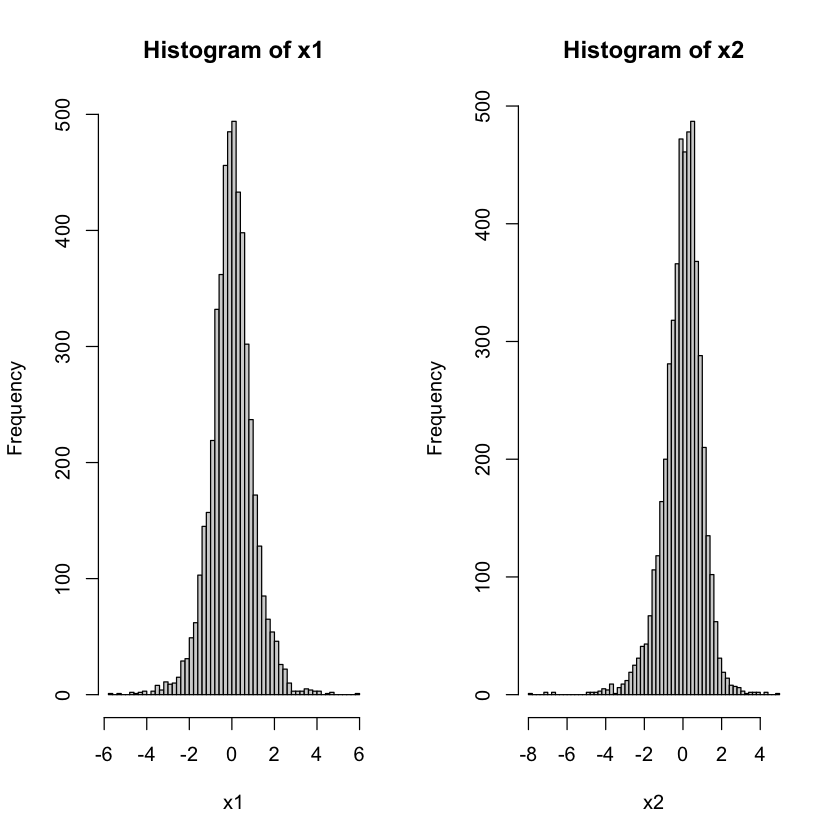

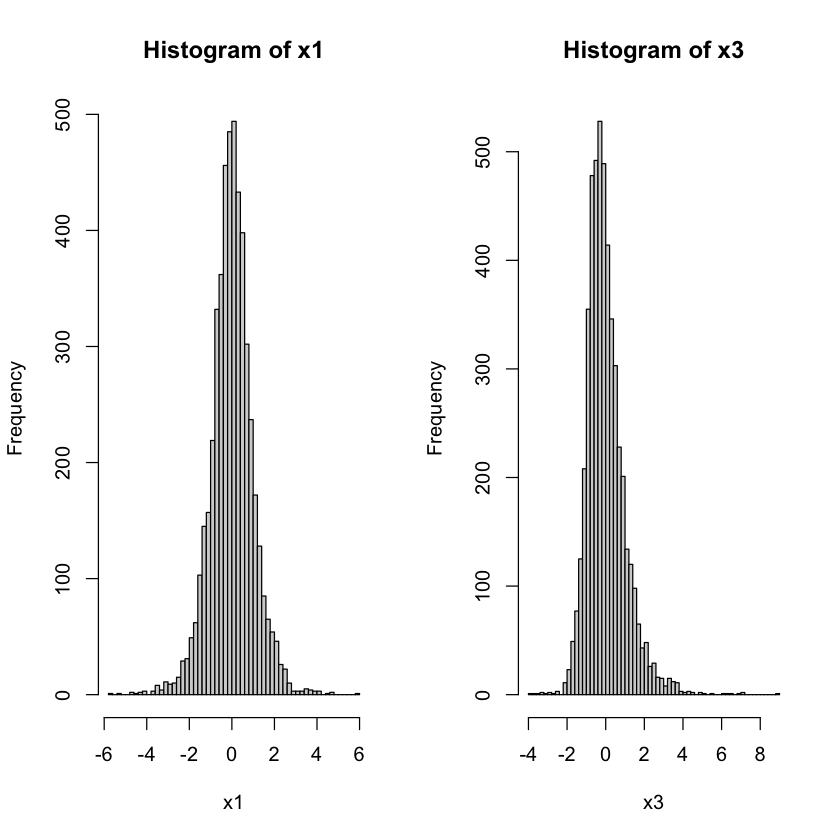

In [57]:
#compare skew-student-t and student-t distributions
# in fGarch the commands are rsstd and rstd respectively.
library(fGarch)
x1 = rstd(5000,0,1,5) # nobs, mean, sd, nu
x2 = rsstd(5000,0,1,5,0.8)
x3 = rsstd(5000,0,1,5,1.5)
par(mfcol=c(1,2))
hist(x1,nclass=50)
hist(x2,nclass=50)
hist(x1,nclass=50)
hist(x3,nclass=50)

I could not get this to work:

https://home.agh.edu.pl/~kostrzew/garchoxfit_R.txt

note that m-intc7308.txt is different than m-intc7303.txt used below per the scribd doc that is coded so I need to manually type it from here https://www.scribd.com/document/464537994/Lecture-4 to this notebook.

possible its only for windows based on some errors thrown.
arguments 'show.output.on.console', 'minimized' and 'invisible' are for Windows only
Warning message in system(command, show.output.on.console = trace, invisible = TRUE):
“error in running command”Warning message in file(file, "r"):
“cannot open file 'OxResiduals.csv': No such file or directory”

here are notes on teh package that imply getting a license.
https://www.rdocumentation.org/packages/fGarch/versions/260.72/topics/GarchOxInterface

https://faculty.chicagobooth.edu/ruey-s-tsay/research/analysis-of-financial-time-series-2nd-edition


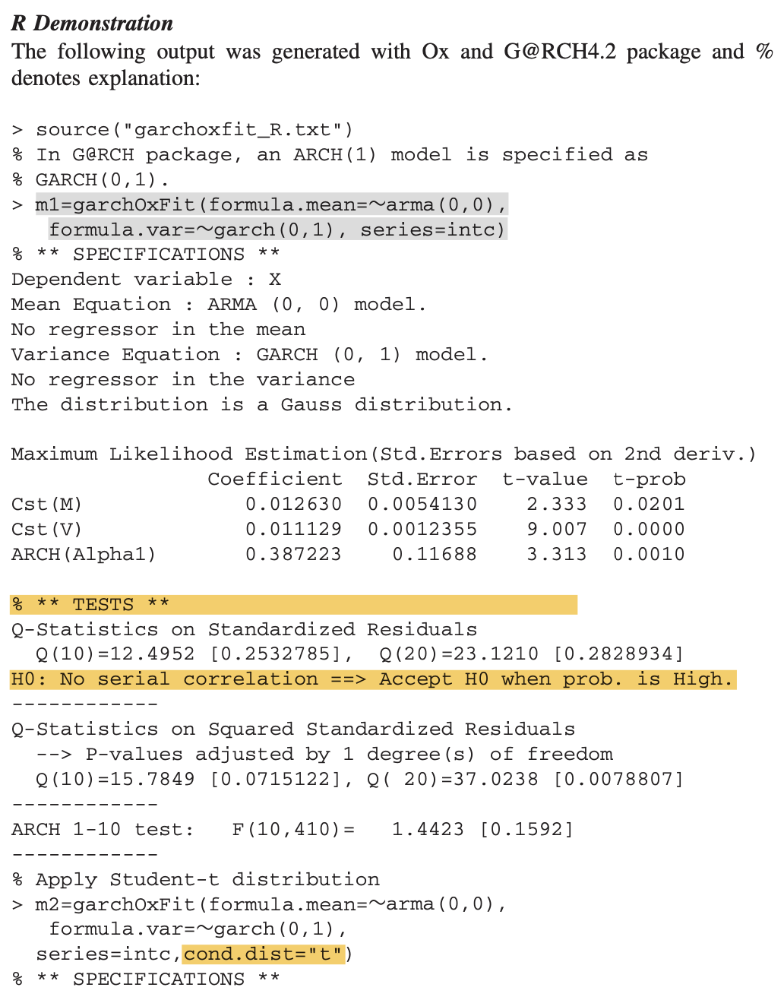
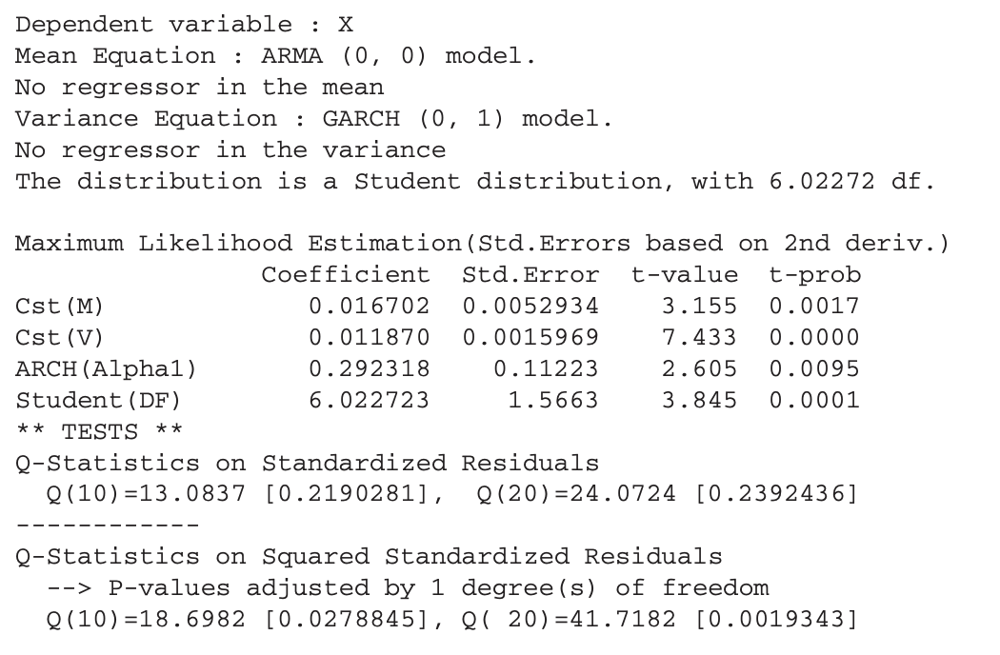

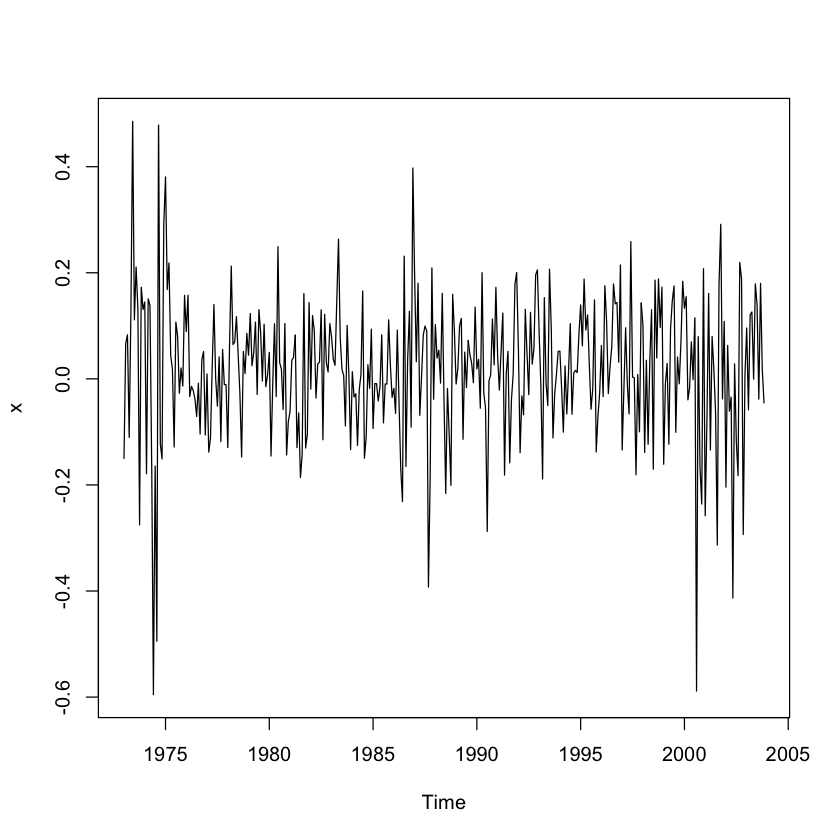

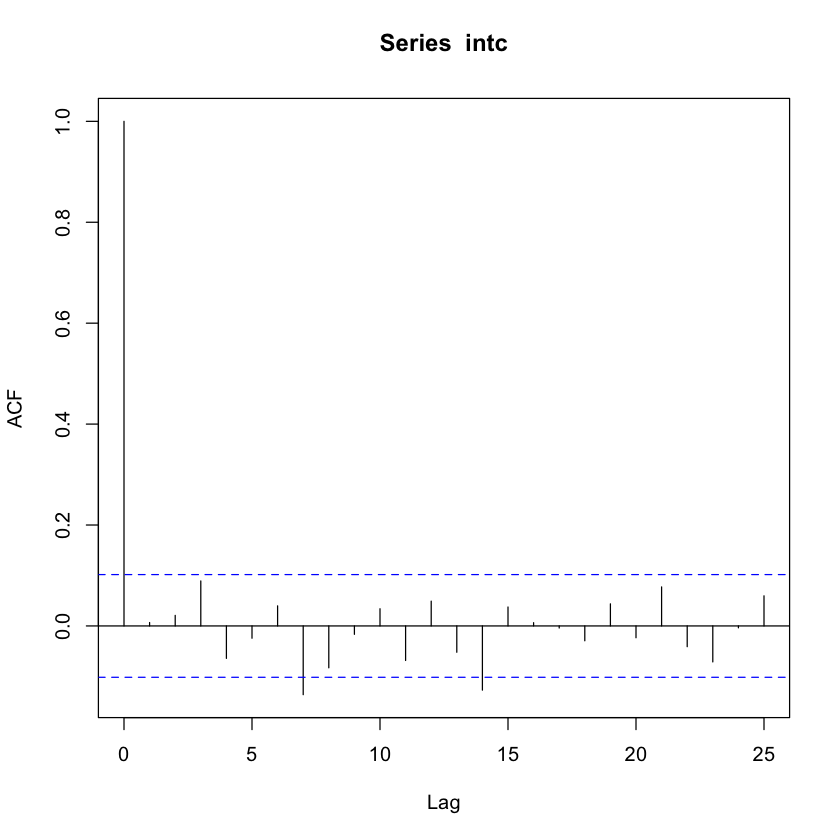


	Box-Ljung test

data:  intc^2
X-squared = 60.099, df = 10, p-value = 3.471e-09


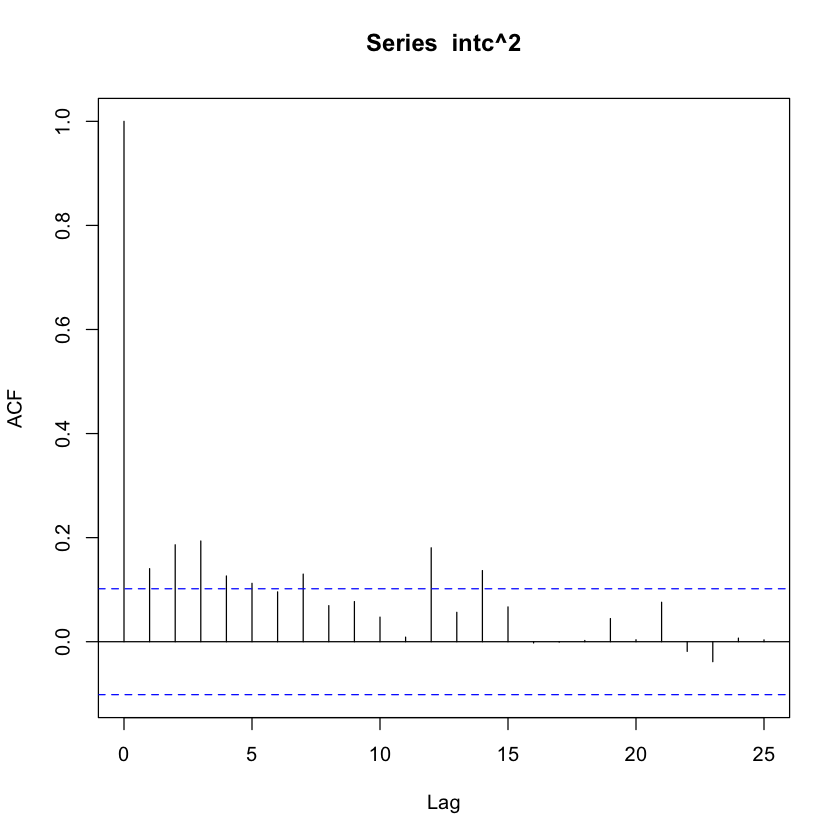

arguments 'show.output.on.console', 'minimized' and 'invisible' are for Windows only

Warning message in system(command, show.output.on.console = trace, invisible = TRUE):
“error in running command”
Warning message in file(file, "r"):
“cannot open file 'OxResiduals.csv': No such file or directory”


ERROR: Error in file(file, "r"): cannot open the connection


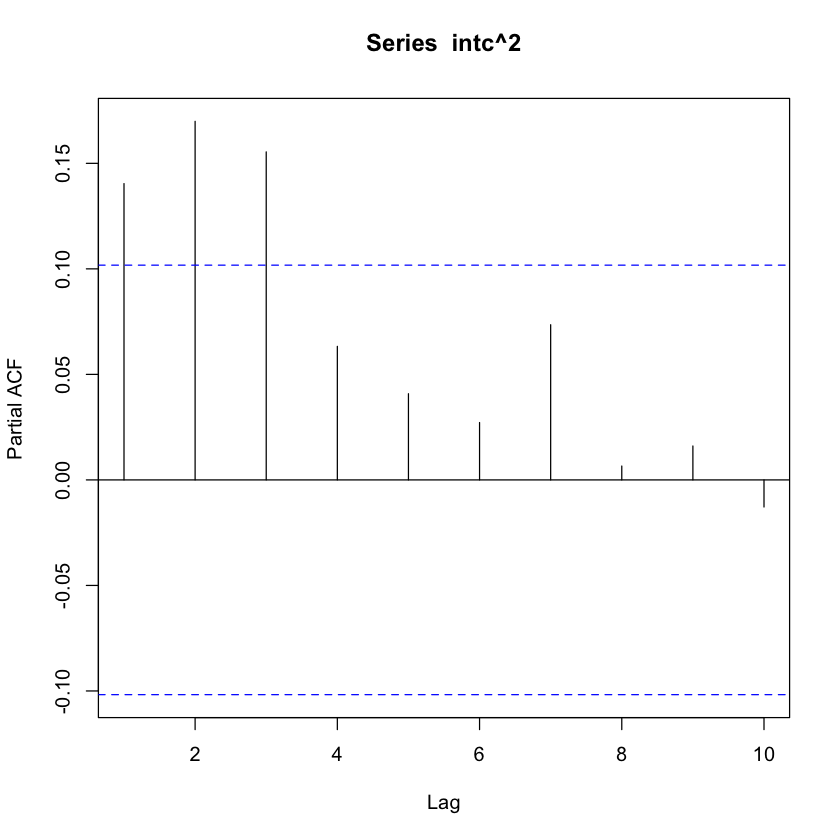

In [58]:
da=read.table("m-intc7303.txt",header=T)
intc <- log(da[,2]+1)
source("garchoxfit_R.txt")
x=ts(intc, frequency=12,start=c(1973,1))
plot(x)
acf(intc)
acf(intc^2)
Box.test(intc^2, lag=10,type='Ljung')
pacf(intc^2, lag=10)
m1=garchOxFit(formula.mean=~arma(0,0), formula.var=~garch(0,3), series=intc, cond.dist='t')
m1=garchOxFit(formula.mean=~arma(0,0), formula.var=~garch(0,1), series=intc, cond.dist='t')
names(m1)
par(mfcol=c(2,1))

### t Innovation

Fit an ARCH(1) model with **Student-t innovations** to the series resuling in the model:

(3.13)

$$\large r_t = 0.0169 + a_t, \;\;\;\; \sigma_t^2 = 0.0120 + 0.2845 a_{t-1}^2$$

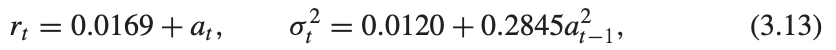

where all estimates are significant at the 5% level
- the standard errors of the parameters are 0.0053, 0.0017, 0.1129 
- [jointly estimated with the coefficients] the degrees of freedom estimate is 6.01 with standard error 1.50 
- the unconditional standard deviation is $\sqrt{\text{Var}(a_t)} = \sqrt{\frac{\alpha_0}{1-\alpha_1}} = \sqrt{\frac{0.0120}{1-0.2845}} \approx 0.1295$ which is similar to that unconditional standard deviation found under normality. 
- The Ljung–Box statistics of the standardized residuals give Q(12) = 14.88 with a p value of 0.25, confirming that the mean equation is adequate. 
- However, the Ljung-Box statistics for squared standardized residuals show Q(12) = 35.42 with p value of 0.0004. Further analysis shows that Q(10) = 15.90 with a p value of 0.10 for the squared standardized residuals. The inadequacy of the volatility equation at the 1% significance level is due to a large lag-12 ACF of the squared standardized residuals: $\rho_{12} = 0.188$

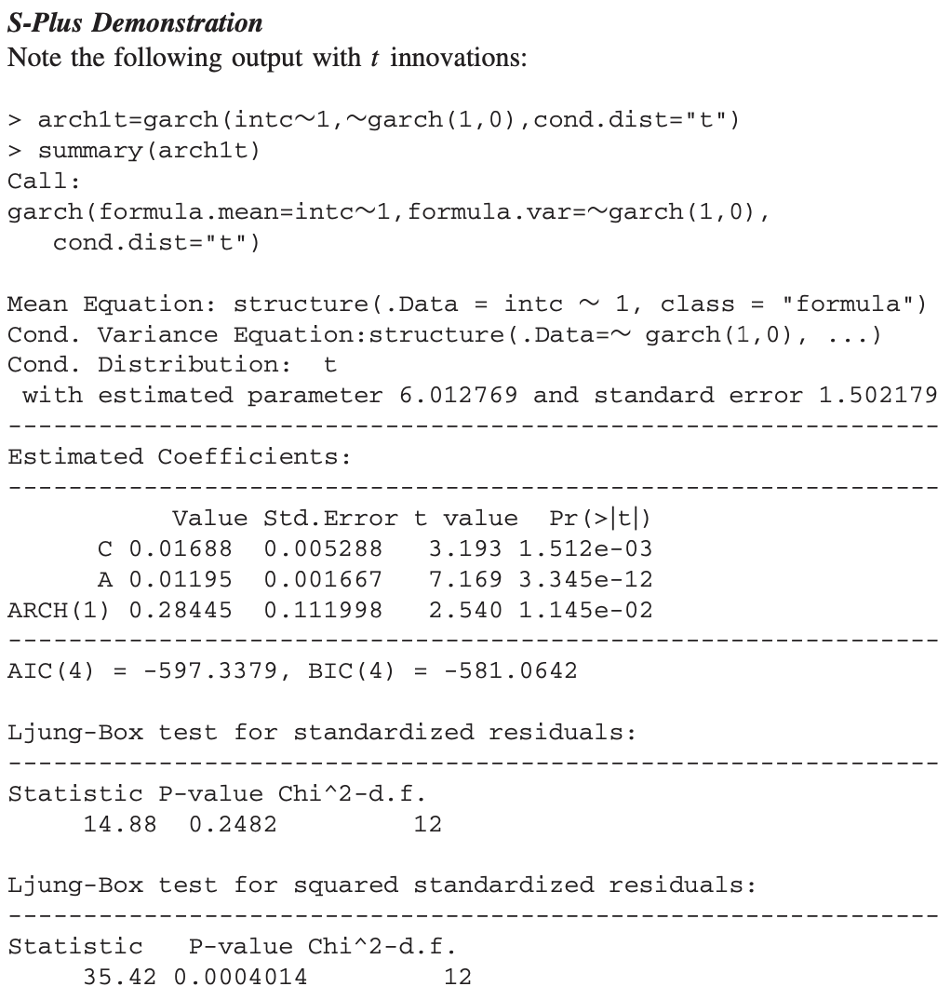

Comparing model (3.12) with (3.13): 
1. a heavy-tailed distribution for $\epsilon_t$ reduces the **ARCH coefficient** [from $\alpha_1 = 0.35602$ under normality to $\alpha_1 = 0.2845$ under a Students-t distribution.] [He's not talking about $\alpha_0$ because that increased from normality to t distribution.
2. the difference between the two models is small for this example. 
3. A more appropriate conditional heteroscredastic model for the monthly log INTC returns is GARCH(1,1) which is discussed next. 

Note: In S-Plus the command `garch` allows for conditional distributions: `cond.dist - "t"` or `cond.dist - "ged"` and the default is Gaussian.

#### The R estimates

Skew Student-t, skew normal, and skew GED distributions are available in the fGarch package of Rmetrics. The commands are sstd, snorm, and sged, respectively. See the R demonstration below for an example.

For comparison, we also fit an ARCH(1) model with Student-t innovations to the series. The resulting model is [similar to S-Plus]

$$\large r_t = 0.0167 + a_t, \;\;\;\; \sigma_t^2 = 0.0119 + 0.2853 a_{t-1}^2$$

where all estimates are significant at the 5% level [similar to S-Plus]
- the standard errors of the parameters are 0.0053, 0.0016, 0.1106 
- [jointly estimated with the coefficients] the degrees of freedom estimate is 6.02 with standard error 1.56
- All the estimates are significant at the 5% level. 
- The unconditional standard deviation of at is $\sqrt{\frac{0.0120}{1 − 0.2853}} ≈ 0.1296$, which is close to that obtained under normality. 

A skewed Student t follows
An ARMA (1,0) + GARCH (1,1) with Gaussian noises follows that.

In [ ]:
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

library(fGarch)
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
m1stdt <- garchFit(intc~garch(1,0), data=intc, trace=F, cond.dist="std")
summary(m1stdt)
#m1stdt@residuals
# https://cran.r-project.org/web/packages/fGarch/fGarch.pdf
# for use of @residuals: https://stat.ethz.ch/pipermail/r-sig-finance/2008q1/002108.html

In [ ]:
#skewed student t distribution for epsilon
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

library(fGarch)
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
m1sstdt=garchFit(intc~garch(1,0), data=intc, trace=F, cond.dist='sstd')
summary(m1sstdt)

In [ ]:
#fit a ARMA(1,0) + GARCH(1,1) model with Gaussian nooises
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
require(psych)
library(urca)

library(fGarch)
da=read.table("m-intc7308.txt",header=T)
intc <- log(da[,2]+1)
m111g <- garchFit(intc~arma(1,0)+garch(1,1), data=intc,trace=F)
summary(m111g)

### Example 3.2 

Percentage change USDDEM 10 minute intervals.

Figure 3.3(a) log returns

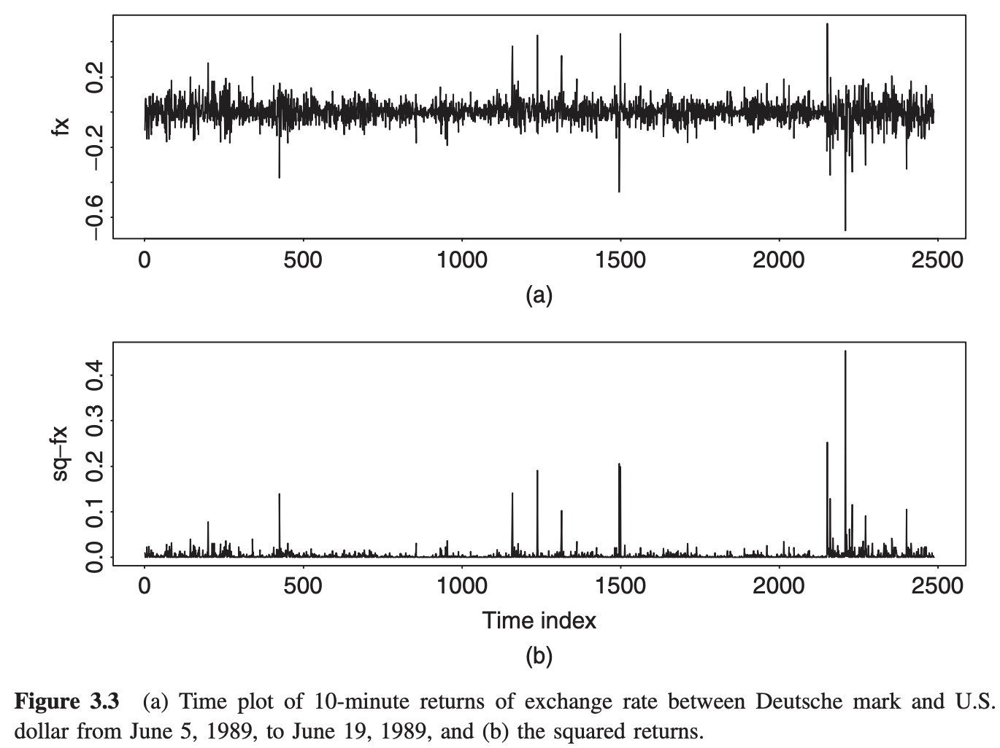

Figure 3.4

(a) ACF of log returns shows no serial correlations.

(b) PACF of squared series of log returns shows
- spikes at lags 1 and 3.
- large spikes at higher lags but lower lags tend to be more important.

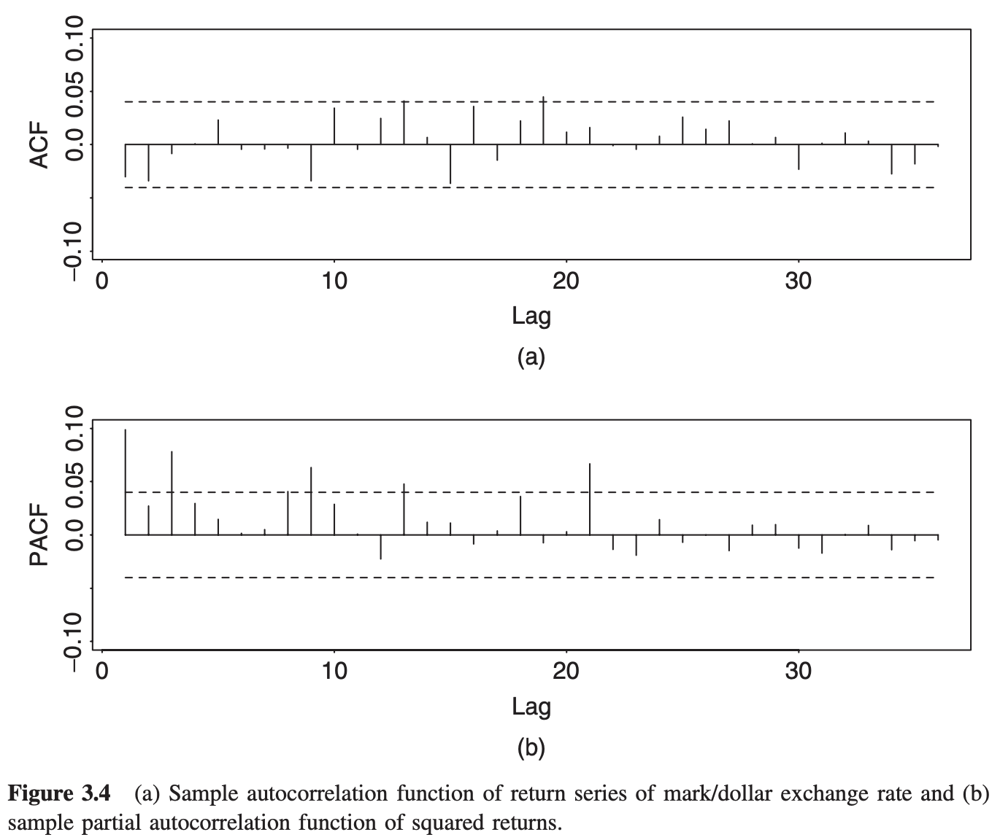

Procedure from previous section is followed giving a ARCH(3) model for the series.

[My output is noted from this table produced below: Coefficient(s):]

|mu | omega | alpha1 | alpha2 | alpha3  
| --------- | --------- | --------- | --------- | --------- |
| 0.0015664 | 0.0022272 | 0.3285231 | 0.0754208 | 0.1029967 |

Gaussian likelihood function yields the fitted model:

$\large r_t = \mu_t + a_t = 0.0018 + \sigma_t \epsilon_t$ 

[mine:]
$\large r_t = \mu_t + a_t = 0.0015664 + \sigma_t \epsilon_t$ 



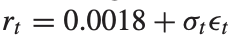

$\large \sigma_t^2 = 0.22 \times 10^{-2} + 0.322 a_{t-1}^2 + 0.074 a_{t-2}^2 + 0.093 a_{t-3}^2$

[mine:]

$\large \sigma_t^2 = 0.0022272 \times 10^{-2} + 0.3285231 a_{t-1}^2 + 0.0754208 a_{t-2}^2 + 0.1029967 a_{t-3}^2$

where all the standard errors of the parameters are $0.47 \times 10^{-6}$ [0.0001162], 0.017 [0.0363918], 0.016 [0.0243932], and 0.014 [0.0243966] supporting the conclusion that the estimates in the volatility equation are statistically significant at the 5% significance level [true even though different SE figures].

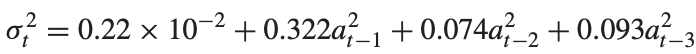

Model checking using the standardized residuals $\tilde{a}_t$ indicates the model is adequate. 

[standardized residuals Q(15) Q(20) reject hypothesis that the squared residuals lack ARCH effects at the 5% significance level. ACF of squared residuals shows dependency at 7 and 14 lag - could this be monday effect?]

In [ ]:
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
#require(psych)
#library(urca)

da=read.table("exch-perc.txt",header=F)
#already log returns
dem <- da[,]
head(dem)


Box.test(dem, lag=12, type="Ljung")
at <- dem-mean(dem)
Box.test(at^2,lag=12,type="Ljung")

library(FinTS)
ArchTest(dem, lag=12)

par(mfcol=c(2,1))
plot(dem, type='l',ylim=c(-0.7,0.5))
plot(dem^2, type='l',ylim=c(0.0,0.5))

par(mfcol=c(2,1))
acf(dem, xlim=c(1,24), ylim=c(-.1,.1))
pacf(at^2, ylim=c(-.1,.1))
m1dem <- garchFit(dem~garch(3,0), data=dem,trace=F)
summary(m1dem)
m1dem.r = m1@residuals
acf(m1dem.r)
pacf(m1dem.r)

## 3.5 The GARCH model

ARCH
- simple
- but requires many parameters to adequately describe volatility process of asset returns
    - **Example 3.3**: SP500 ARCH(9) model needed for the volatility process - too much!
    
**Generalized ARCH = GARCH** by Bollerslev (1986) extends ARCH.

For log return:

$$\large r_t, \text{ let } a_t = r_t - u_t \text{ = innovation at time t.}$$ 

$a_t$ follows a GARCH(m,s) model if:

(3.14)

$$\large a_t = \sigma_t \epsilon_t, \;\; \sigma_t^2 = \alpha_0 + \sum_{i=1}^m \alpha_i a_{t-i}^2 + \sum_{j=1}^s \beta_j \sigma_{t-j}^2$$

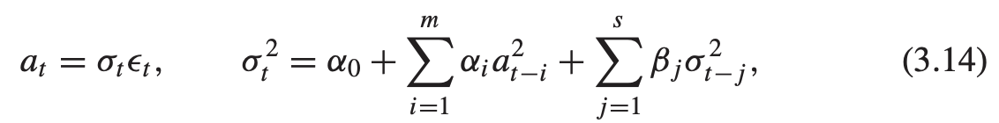

where

- $\alpha_i$ is referred to as an **ARCH parameter**, [coefficient to $\alpha_{t-i}^2$]
- $\beta_j$ is referred to as a **GARCH parameter**, [coefficient to $\sigma_{t-j}^2$]
- {$\epsilon_t$} 
    - is a sequence of iid random variables with mean zero and variance 1
    - often assumed to follow a 
        - standard normal distribution
        - Student-t distribution
        - generalized error distribution
- $a_0 > 0$
- $a_i ≥ 0$
- $\beta_j ≥ 0$
- $\sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i) < 1$
    - implying that 
        - the unconditional variance of $a_t = \text{Var}(a_t)$ is finite 
        - the conditional variance $\sigma_t^2$ evolves over time. 
        - [evolves over time is implied by RHS of (3.14)]
        - [finiteness by limiting sum of all $\alpha_i + \beta_i to < 1, \text{Var}(\epsilon)=1$]
    - $\alpha_i = 0 \text{ for } i > m \text{ and } \beta_j = 0 \text{ for } j > s$
- (3.14) reduces to ARCH(m) model if s = 0, [i.e. if no $\beta_j$s and $\sigma_{t-j}^2$s determining $\sigma_t^2$].

**Properties of GARCH models**:
To understand GARCH model's properties, construct the following representation: 

- let:
    
$$ \large \eta_t = a_t^2 - \sigma_t^2$$
$$ \large \sigma_t^2 = a_t^2 - \eta_t$$

- resubscript the above from t to t-i:
    
$$\sigma_{t-i}^2 = a_{t-i}^2 - \eta_{t-i} \;\; (i = 0, ... s)$$

- plug in the above into the RHS of RHS of (3.14) GARCH model:
    
(3.14)
$$ \large \sigma_t^2 = \alpha_0 + \sum_{i=1}^m \alpha_i a_{t-i}^2 + \sum_{j=1}^s \beta_j \sigma_{t-j}^2$$

$$ \large \sigma_t^2 = \alpha_0 + \sum_{i=1}^m \alpha_i a_{t-i}^2 + \sum_{j=1}^s \beta_j (a_{t-j}^2 - \eta_{t-j})$$

[collect the $a_{t-j}$ with $a_{t-i}$ by changing the summation superscript to max(m,s) per the condition above]

$$ \large \sigma_t^2 = \alpha_0 + \sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i) a_{t-i}^2 - \sum_{j=1}^s \eta_{t-j}$$

[replace $\sigma^2$ on LHS (3.14) per $\sigma_t^2 = a_t^2 - \eta_t$]

$$ \large a_t^2 - \eta_t = \alpha_0 + \sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i) a_{t-i}^2 - \sum_{j=1}^s \eta_{t-j}$$

[move $\eta_t$ to RHS]

$$ \large a_t^2 = \alpha_0 + \sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i) a_{t-i}^2 + \eta_t - \sum_{j=1}^s \beta_j \eta_{t-j}$$

(3.15)

$$ \large a_t^2 = \alpha_0 + \sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i) a_{t-i}^2 + \eta_t - \sum_{j=1}^s \beta_j \eta_{t-j}$$

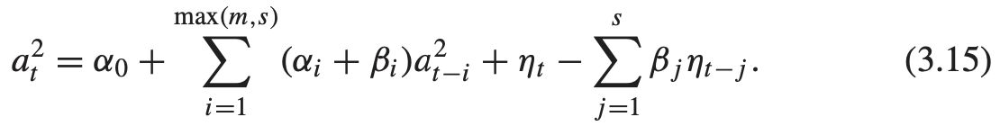

[$a_t^2 = \alpha_0 + \eta_t$ + sum of past $(\alpha_i + \beta_i)$ weighted $(\sigma_{t-1}^2 + \eta_{t-1}) - \beta_j$ weighted $\eta_{t-j}$s]


You will need this for next line:
https://en.wikipedia.org/wiki/Martingale_(probability_theory)
In probability theory, a martingale is a sequence of random variables (i.e., a stochastic process) for which, at a particular time, t, the conditional expectation of the next value, t+1, in the sequence is equal to the present value, at t, regardless of all prior values. An unbiased random walk (in any number of dimensions) is an example of a martingale.

{$\eta_t$} 
- Is simple to check that {$\eta_t$} is a Martingale difference series:  

$E(\eta_t) = 0$   
$cov(eta_t, eta_{t-j}) = 0$ for j ≥ 1   
[not yet sure how to reconcile Martingale $E(\eta_{t+1}|\eta_t) = \eta_t$ with the zero covariance though if that expectation is for anything other than $\eta_t$ then there is vol and direction; so that's maybe the only way to show zero covariance] 

- however, {$\eta_t$} in general is not an iid sequence. [Seems covariance defines it as independent; so, maybe not identical as was the case with ARCH.]

(3.15) is an ARMA form for the squared series $a_t^2$.  Thus a GARCH model can be regarded as an application of ARMA idea to the squared series $a_t^2$. [ARCH model is in AR form and an application of AR idea to squared series $a_t^2$.] Using unconditional mean of an ARMA model [remeber E(x) = $\frac{a_0}{1-\alpha_1 - \alpha_2 - ... - \alpha_m}$], this is true provided the denominator is positive:

$$ \large E(a_t^2) = \frac{\alpha_0}{1 - sum_{i=1}^{max(m,s)}(\alpha_i + \beta_i)}$$

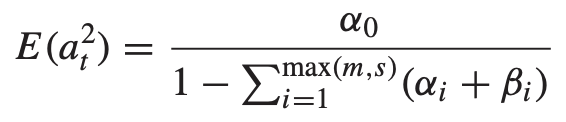

[The above is also revealed to be the unconditional variance of $a_t$ = Var($a_t$) which of course makes sense since $E(a_t^2) = E[(a_t - \mu_{a_t})^2] = E[(a_t - 0)^2]$ ]

**GARCH model strengths and weaknesses**:

Focus on GARCH(1,1)

(3.16)

$$ \large \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + \beta_1 \sigma_{t-1}^2, \;\; 0 ≤ \alpha_1, \beta_1 ≤ 1, (\alpha_1 + \beta_1) < 1$$

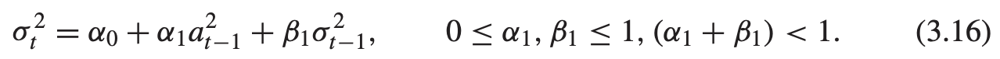

1. a large $a_{t-1}^2$ or $\sigma_{t-1}^2$ gives rise to a large $\sigma_t^2$, which means a large $a_{t-1}^2$ tends to be followed by another large $a_t^2$ generating the well known volatility clustering behavior. 

2. [similar to ARCH explanation,] it can be shown that:

if the denominator > 0

$$\large \text{if } 1 - 2\alpha_1^2 - (\alpha_1 + \beta_1)^2 > 0$$

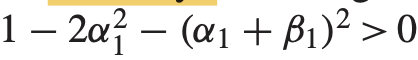

then the fourth moment

$$\large \frac{E(a_t^4)}{[E(a_t^2)]^2} = \frac{3 [1 - (\alpha_1 + \beta_1)^2]}{1 - (\alpha_1 + \beta_1)^2 - 2 \alpha_1^2} > 3$$

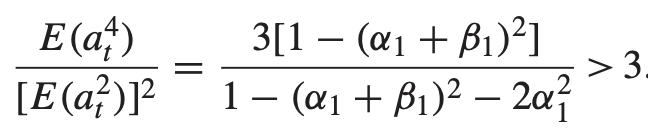›

thus, similar to ARCH models, the tail distribution of a GARCH(1,1) process is heavier than that of a normal distribution.

3. The model provides a parmetric function that describes the volatility evolution.

**Forecasts** of a GARCH model can be obtained using methods similar to ARIMA model.  

Example: For a GARCH(1,1) model in (3.16) with forecast origin h, ...

The 1-step-ahead forecast is modeled:

$$\large \sigma_{h+1}^2 = \alpha_0 + \alpha_1 a_h^2 + \beta_1 \sigma_h^2$$

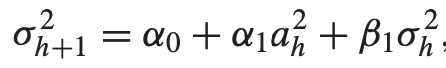

where $a_h$ and $\sigma_h^2$ are known at the time index h.

Thus the 1-step-ahead forecasts is

$$\large \sigma_h^2(1) = \alpha_0 + \alpha_1 a_h^2 + \beta_1 \sigma_h^2$$

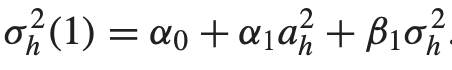

The multistep-ahead forecast, use $a_t = \sigma_t \epsilon_t \longrightarrow a_t^2 = \sigma_t^2 \epsilon_t^2$ to rewrite the volatility portion of (3.16) as 

RHS of (3.16):

$$ \large \sigma_t^2 = \alpha_0 + \alpha_1 a_{t-1}^2 + \beta_1 \sigma_{t-1}^2$$

resubscript from $\sigma_t$ to $\sigma_{t+1}$:

$$ \large \sigma_{t+1}^2 = \alpha_0 + \alpha_1 a_t^2 + \beta_1 \sigma_t^2$$

replace $a_t^2$ with $\sigma_t^2 \epsilon_t^2$:

$$ \large \sigma_{t+1}^2 = \alpha_0 + \alpha_1 (\sigma_t^2 \epsilon_t^2) + \beta_1 \sigma_t^2$$

subtract - $\alpha_1 \sigma_t^2$ and add + $\alpha_1 \sigma_t^2$: 

$$ \large \sigma_{t+1}^2 = \alpha_0 + \alpha_1 (\sigma_t^2 \epsilon_t^2) + [- \alpha_1 \sigma_t^2 + \alpha_1 \sigma_t^2] + \beta_1 \sigma_t^2$$

collect:

$$ \large \sigma_{t+1}^2 = \alpha_0 + \alpha_1 \sigma_t^2 (\epsilon_t^2 - 1) + (\alpha_1 + \beta_1) \sigma_t^2$$

rearrange to match:

$$ \large \sigma_{t+1}^2 = \alpha_0 + (\alpha_1 + \beta_1) \sigma_t^2 + \alpha_1 \sigma_t^2 (\epsilon_t^2 - 1)$$

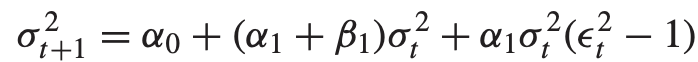

when in the above equation t = h + 1 the equation [now with $\sigma_t^2$ and $\epsilon_t^2$ replacing $a_t^2$] becomes:

$$ \large \sigma_{(h+1)+1}^2 = a_0 + (\alpha_1 + \beta_1) \sigma_{h+1}^2 + \alpha_1 \sigma_{h+1}^2 (\epsilon_{h+1}^2 - 1)$$

[$\epsilon_{h+1}$ is defined iid with variance = 1 and mean zero.  Thus the variance of $\epsilon_{h+1} = 1 = E[(\epsilon_{h+1} - 0)^2] = 1 = \epsilon_{h+1}^2$.  Thus, $(\epsilon_{h+1}^2 - 1) = 0$ in the last equation, and $\alpha_1 \sigma_{h+1}^2 (\epsilon_{h+1}^2 - 1)$ drops out.]

$$ \large \sigma_{h+2}^2 = \alpha_0 + (\alpha_1 + \beta_1) \sigma_{h+1}^2 + \alpha_1 \sigma_t^2 (\epsilon_t^2 - 1)$$

$$ \large \sigma_{h+2}^2 = \alpha_0 + (\alpha_1 + \beta_1) \sigma_{h+1}^2$$

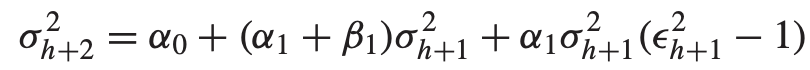

The h+2 = 2-step ahead forecast at the forecast origin h, satisfies this equation:

$$ \large \sigma_h(2) = \alpha_0 + (\alpha_1 + \beta_1) \sigma_h^2(1)$$

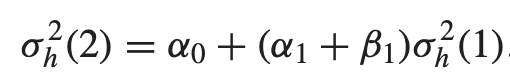

In general, 

(3.17) 

$$ \large \sigma_h^2(\ell) = \alpha_0 + (\alpha_1 + \beta_1) \sigma_h^2(\ell - 1) \; \; \text{ for } \ell > 1$$

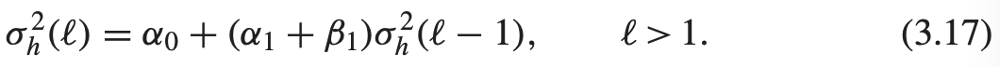

This result is same as that of ARMA(1,1) model with AR polynomial $1 - (\alpha_1 + \beta_1)B$.  By repeated substitutions in (3.17) an $\boldsymbol\ell$**-step ahead forecast** can be rewritten [to see convergence of vol forecast to unconditional variance of $a_t$ as $\ell \longrightarrow \infty$].

start with (3.17):

$$ \large \sigma_h^2(\ell) = \alpha_0 + (\alpha_1 + \beta_1) \sigma_h^2(\ell - 1)$$

substitute once:

$$ \large \sigma_h^2(\ell) = \alpha_0 + (\alpha_1 + \beta_1) [a_0 + (\alpha_1 + \beta_1) \sigma_h^2(\ell - 2)]$$

substitute twice:

$$ \large \sigma_h^2(\ell) = \alpha_0 + (\alpha_1 + \beta_1) [a_0 + (\alpha_1 + \beta_1) \{a_0 + (\alpha_1 + \beta_1) \sigma_h^2(\ell - 3)\}]$$

substitute thrice:

$$ \large \sigma_h^2(\ell) = \alpha_0 + (\alpha_1 + \beta_1) [a_0 + (\alpha_1 + \beta_1) \{a_0 + (\alpha_1 + \beta_1) (a_0 + (\alpha_1 + \beta_1) \sigma_h^2(\ell - 4))\}]$$

break it down:

$$ \large \sigma_h^2(\ell) = \alpha_00 + (\alpha_1 + \beta_1) [a_0 + (\alpha_1 + \beta_1) \{a_0 + (\alpha_1 + \beta_1) a_0 + (\alpha_1 + \beta_1)(\alpha_1 + \beta_1) \sigma_h^2(\ell - 4)\}]$$

break it down:

$$ \large \sigma_h^2(\ell) = a_0 + (\alpha_1 + \beta_1) [a_0 + (\alpha_1 + \beta_1) a_0 + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) a_0 + (\alpha_1 + \beta_1)(\alpha_1 + \beta_1)(\alpha_1 + \beta_1) \sigma_h^2(\ell - 4)]$$

break it down:

$$ \large \sigma_h^2(\ell) = \alpha_0 + (\alpha_1 + \beta_1) a_0 + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) a_0 + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) a_0 + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1)(\alpha_1 + \beta_1)(\alpha_1 + \beta_1) \sigma_h^2(\ell - 4)$$

group:

$$ \large \sigma_h^2(\ell) = \alpha_0 (1 + (\alpha_1 + \beta_1) + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) (\alpha_1 + \beta_1) + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1)(\alpha_1 + \beta_1)(\alpha_1 + \beta_1) \sigma_h^2(\ell - 4)$$

then either:

(1) my way: power series: $1 + x + x^2 + x^3 + ... + x^n = \frac{1}{1-x}$

$$ \large \sigma_h^2(\ell) = \frac{\alpha_00}{1- (\alpha_1 + \beta_1)} + (\alpha_1 + \beta_1) (\alpha_1 + \beta_1)(\alpha_1 + \beta_1)(\alpha_1 + \beta_1) \sigma_h^2(\ell - 4)$$

resolve last item:

$$ \large \sigma_h^2(\ell) = \frac{\alpha_0}{1- (\alpha_1 + \beta_1)} + (\alpha_1 + \beta_1)^j \sigma_h^2(\ell - j)$$

when $\ell - j = 1, \text{ then } j = \ell - 1$:

$$ \large \sigma_h^2(\ell) = \frac{\alpha_0}{1- (\alpha_1 + \beta_1)} + (\alpha_1 + \beta_1)^{\ell - 1} \sigma_h^2(1)$$

as $\ell \longrightarrow \infty$:

$$ \large \sigma_h^2(\ell) = \frac{\alpha_0}{1 - (\alpha_1 + \beta_1)} $$

(2) or his way I can get to:

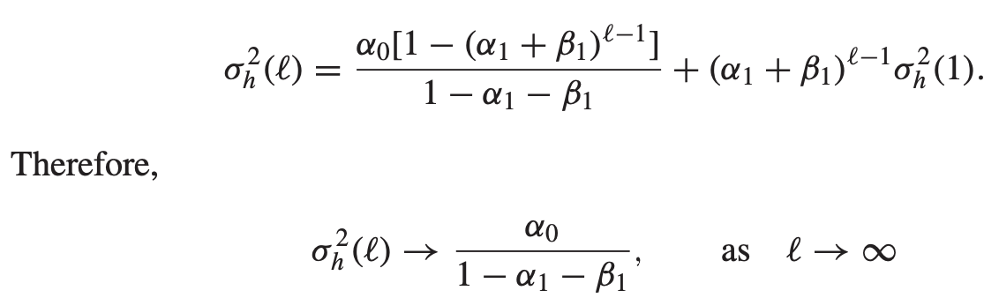

provided that $\alpha_1 + \beta_1 < 1$.  Consequently multistep-ahead volatility [square-root of conditional variance] forecasts of a GARCH(1,1) model converge to [Var($a_t$) = ] the unconditional variance of $a_t$ as the forecast window increases to infinity [$\ell \longrightarrow \infty$] provided that Var($a_t$) exists [i.e. provided $\alpha_1 + \beta_1 < 1$].
[When $E(a_t)=0$, Var($a_t) = E(a_t^2) \text{, which is shown above }= \frac{a_0}{1 - (\alpha_1 + \beta_1)}$]

GARCH literature is enornous.  Model weaknesses are same as ARCH: 
- GARCH responds equally to positive and negative shocks.
- recent empirical studies of high-frequency financial time series indicate that the tail behavior of GARCH models remains too short, even with standardized Student-t innovations. 
- More on GARCH in 3.16 section.

## 3.5.1 An illustrative example

[Here I am a bit confused: these are excess returns so already isnt the data $a_t = r_t - \mu_t$ and so why is there a difference between the coefficients of the MA model of prior $a_t$ first presented applied below and the AR model of prior $r_t$ next presented applied bleow? In other words, arent AR and MA models the same if $r_t = a_t$?]

[Answer is no, you idiot: Pure AR Models - Depends on the lagged values of the data you are modeling to make forecasts. Pure MA Models - Depends on the errors(residuals) of the previous forecasts you made to make current forecasts.  It isnt about $r_t - \mu_t = a_t$]

Garch model can be built using the modeling procedure described for the ARCH models.
- Specifying GARCH model order is not easy: lower order GARCH models, GARCH(1,1), GARCH(2,1), GARCH(1,2), are used in most situations.  
- Conditional maximum-likelihood method continues to apply 
    - provided starting values of volatility {$\sigma_t^2$} are assumed to be known.
    - say for example GARCH(1,1)
        - If $\sigma_1^2$ is treated as fixed, then $\sigma_t^2$ can be computed recursively for a GARCH(1,1) model.
        - In some applications, [Var($a_t$) = $E(a_t^2) =$] the sample variance of $a_t$ [$= (r_t - \mu_t)^2$] is a good starting value of $\sigma_1^2$.
        - the fitted model can be checked using the standardized residual $\tilde{a}_t = \frac{a_t}{\sigma_t}$ and its squared process.
        
### Example 3.3

Figure 3.6: $r_t$ = monthly excess return of S&P500 index starting 1926 for 792 observations. 

[dataset already is excess return; so no need to center.]

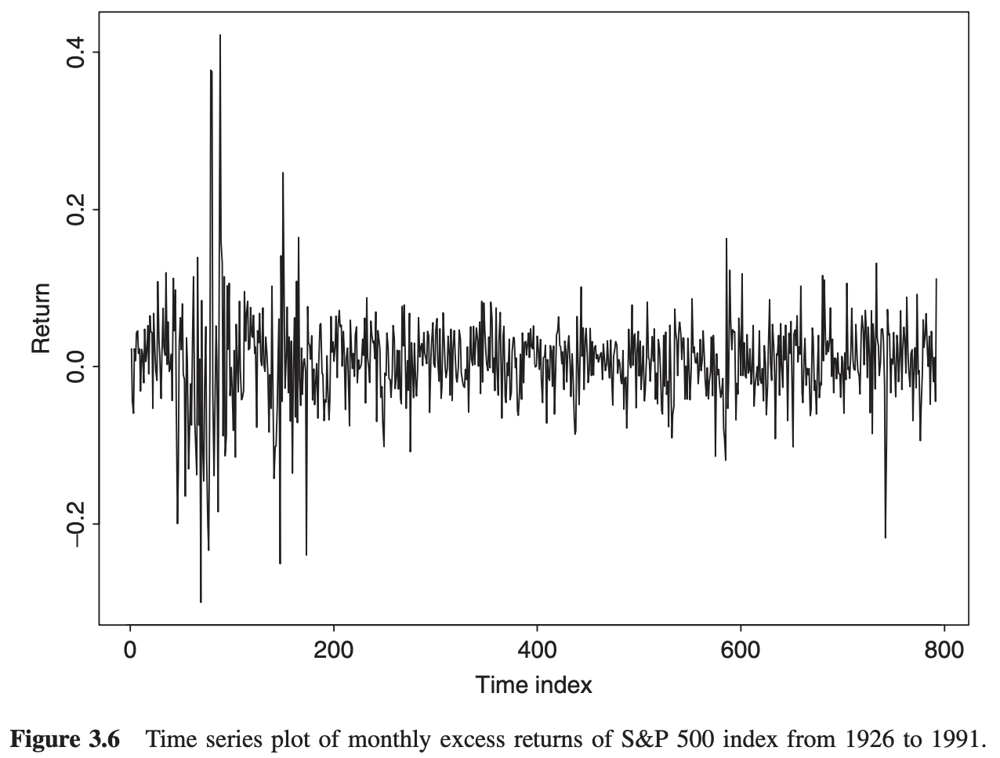

Figure 3.7: Sample ACF of $r_t$ and sample PACF of $r_t^2$.
- (a) ACF of $r_t - \mu_t = a_t = \text{excess returns}$ shows the $a_t$ series has serial correlation at lags 1 nd 3 
- (b) PACF of squared excess returns shows strong linear dependence [of $a_t^2$]. 

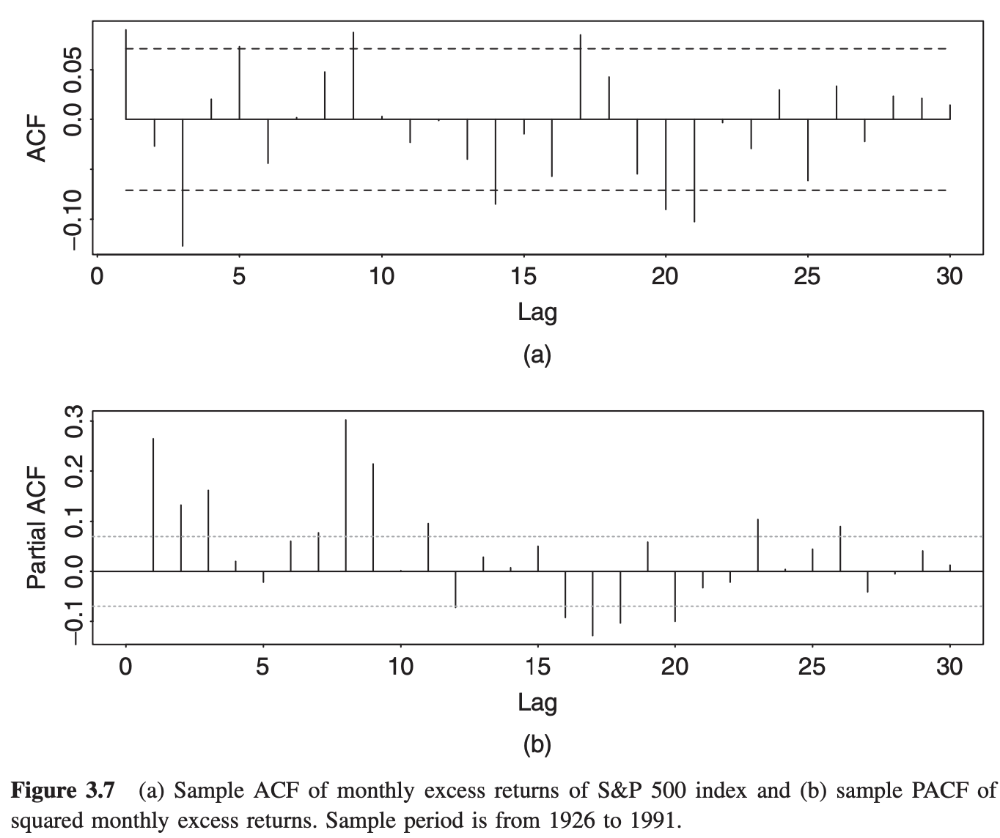

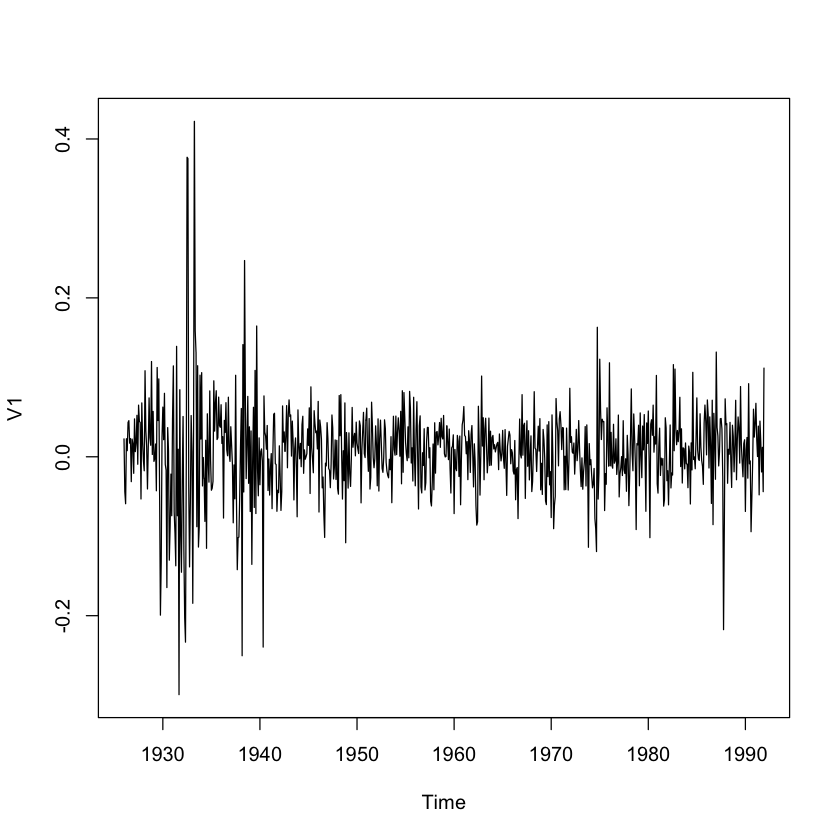

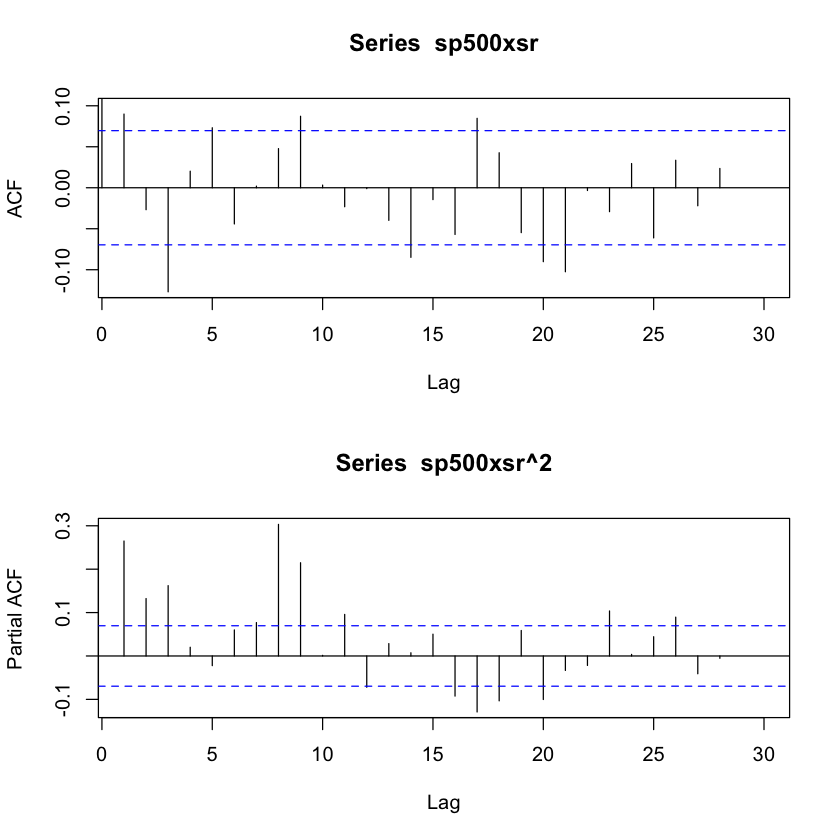

In [60]:
#my way with ts object
da=read.table("sp500.txt")
sp500xsr=da[,]
sp5.ts <- ts(da, frequency = 12, start = c(1926, 1)) # Jan 1926
plot(sp5.ts, type="l") # fig 3.6
par(mfcol=c(2,1))
acf(sp500xsr, xlim=c(1,30), ylim=c(-0.125,0.1))  # fig 3.7
pacf(sp500xsr^2, xlim=c(1,30), ylim=c(-0.125,0.3))  # fig 3.7


Attempt to fit an MA(3) model [to fit $r_t$ to prior $a_{t-i}$ and find all but the 2nd coefficient are signif at the 5% level; then rerun without that parameter:
https://www.rdocumentation.org/packages/forecast/versions/8.15/topics/Arima
[These coefficients are close to the book; notice the second parameter is zeroed; I tried , include.mean = FALSE,
  include.drift = TRUE,
  include.constant,method="ML", biasadj=TRUE to get the same but could not]

$$\large r_t = 0.0062 + a_t + 0.0944 a_{t-1} - 0.1407 a_{t-3}, \;\; \hat{\sigma}_a = 0.0576$$

$$\large [r_t = 0.0062 + a_t + 0.0940 a_{t-1} - 0.1407 a_{t-3}, \;\; \hat{\sigma}_a = \sqrt{0.003322} = 0.05763]$$

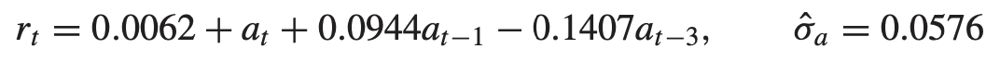

In [61]:
.003322^.5

[1] 0.05763679

In [62]:
da=read.table("sp500.txt")
sp500xsr=da[,]
library(forecast)
summary(arima(sp500xsr, order=c(0,0,3)))
summary(arima(sp500xsr, order=c(0,0,3), fixed=c(NA,0,NA,NA)))


Call:
arima(x = sp500xsr, order = c(0, 0, 3))

Coefficients:
         ma1     ma2      ma3  intercept
      0.0949  0.0096  -0.1415     0.0062
s.e.  0.0348  0.0355   0.0357     0.0020

sigma^2 estimated as 0.003321:  log likelihood = 1136.3,  aic = -2262.6

Training set error measures:
                        ME       RMSE        MAE  MPE MAPE      MASE
Training set -9.147221e-06 0.05763048 0.03982622 -Inf  Inf 0.7139597
                      ACF1
Training set -0.0005560796


Call:
arima(x = sp500xsr, order = c(0, 0, 3), fixed = c(NA, 0, NA, NA))

Coefficients:
         ma1  ma2      ma3  intercept
      0.0940    0  -0.1407     0.0062
s.e.  0.0343    0   0.0356     0.0020

sigma^2 estimated as 0.003322:  log likelihood = 1136.26,  aic = -2264.52

Training set error measures:
                        ME       RMSE        MAE  MPE MAPE      MASE
Training set -8.348351e-06 0.05763318 0.03982513 -Inf  Inf 0.7139401
                     ACF1
Training set 0.0003456086

For simplicity use the AR(3) model [to fit $r_t$ to prior $r_{t-i}$]:

$$\large r_1 = \phi_1 r_{t-1} + \phi_2 r_{t-2} + \phi_3 r_{t-3} + \beta_0 + a_t$$

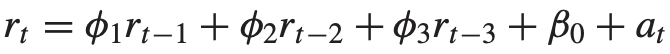

The fitted AR(3) model under normality **assumption** is 

[book]
(3.18)

$$\large r_1 = 0.088 r_{t-1} - 0.023 r_{t-2} 0.0123 r_{t-3} + 0.0066 + a_t, \;\; \hat{\sigma}_a^2 = 0.00333$$ 

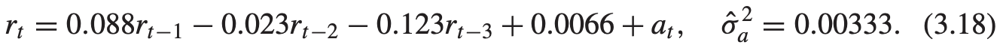

[here]

$$\large r_1 = 0.0890 r_{t-1} - 0.0238 r_{t-2} 0.01229 r_{t-3} + 0.0062 + a_t, \;\; \hat{\sigma}_a^2 = 0.00333$$ 

In [63]:
notworking <- arma(sp500xsr, order = c(1, 0))

ERROR: Error in arma(sp500xsr, order = c(1, 0)): could not find function "arma"


In [64]:
da=read.table("sp500.txt")
sp500xsr=da[,]
library(forecast)
summary(arima(sp500xsr, order=c(3,0,0)))


Call:
arima(x = sp500xsr, order = c(3, 0, 0))

Coefficients:
         ar1      ar2      ar3  intercept
      0.0890  -0.0238  -0.1229     0.0062
s.e.  0.0353   0.0355   0.0353     0.0019

sigma^2 estimated as 0.00333:  log likelihood = 1135.25,  aic = -2260.5

Training set error measures:
                        ME       RMSE        MAE  MPE MAPE     MASE        ACF1
Training set -1.572828e-05 0.05770751 0.03981263 -Inf  Inf 0.713716 0.005326322

For GARCH effect use GARCH(1,1) model

$$\large a_t = \sigma_t \epsilon_t,  \;\; \sigma_t^2 = a_0 + \beta_1 \sigma_{t-1}^2 + \alpha_1 a_{t-1}^2$$

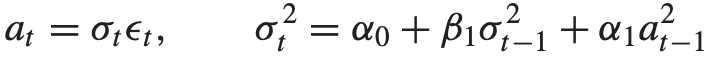

with joint estimation of an AR(3)--GARCH(1,1) model:

[book]

[mean equation?]
$$\large r_t = 0.0078 + 0.032 r_{t-1} - 0.029 r_{t-2} - 0.008 r_{t-3} + a_t$$

[volatility equation?]
$$ \large \sigma_t^2 = 0.000084 + 0.1213 a_{t-1}^2 + 0.8523 \sigma_{t-1}^2$$ 

[here]
$$\large r_t = 0.0077 + 0.032 r_{t-1} - 0.0302 r_{t-2} - 0.00106 r_{t-3} + a_t$$

$$ \large \sigma_t^2 = 0.00007975 + 0.1243 a_{t-1}^2 + 0.853 \sigma_{t-1}^2$$ 

from the volatility equation, the unconditional variance of $a_t$ is

$$\large \text{Var}(a_t) = \frac{\omega}{1  - \beta - \alpha} $$

[book]
$$\large \text{Var}(a_t) = \frac{0.000084}{1 - 0.8523 - 0.1213} = 0.00317$$

which is close to 0.00333 in (3.18)

[here]
$$\large \text{Var}(a_t) = \frac{0.00007975}{1 - 0.853 - 0.1243} = 3.5085e-03 $$

In [ ]:
7.975e-05/(1-8.5302e-01-1.2425e-01)

In [65]:
da=read.table("sp500.txt")
sp500xsr=da[,]
library(fGarch)
garchFit(~arma(3,0) + garch(1,1), data=sp500xsr, trace=F)

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~arma(3, 0) + garch(1, 1), data = sp500xsr, 
    trace = F) 

Mean and Variance Equation:
 data ~ arma(3, 0) + garch(1, 1)
<environment: 0x7fb5081dbba0>
 [data = sp500xsr]

Conditional Distribution:
 norm 

Coefficient(s):
         mu          ar1          ar2          ar3        omega       alpha1  
 7.7077e-03   3.1968e-02  -3.0261e-02  -1.0649e-02   7.9746e-05   1.2425e-01  
      beta1  
 8.5302e-01  

Std. Errors:
 based on Hessian 

Error Analysis:
         Estimate  Std. Error  t value Pr(>|t|)    
mu      7.708e-03   1.607e-03    4.798 1.61e-06 ***
ar1     3.197e-02   3.837e-02    0.833  0.40473    
ar2    -3.026e-02   3.841e-02   -0.788  0.43076    
ar3    -1.065e-02   3.756e-02   -0.284  0.77677    
omega   7.975e-05   2.810e-05    2.838  0.00454 ** 
alpha1  1.242e-01   2.247e-02    5.529 3.22e-08 ***
beta1   8.530e-01   2.183e-02   39.075  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log 

However the standard error of the parameters and the consequent t-ratios suggest that all 3 AR coefficients are insignificant at the 5% level.  Refine the model, dropping all AR parameters:

[makes sense since there wasnt much in the ACF of returns but there was in PACF of returns squared]

(3.19)

[book]
$$\large r_t = 0.0076 + a_t, \;\; \sigma_t^2 = 0.000086 + 0.1216 a_{t-1}^2 + 0.8511 \sigma_{t-1}^2$$

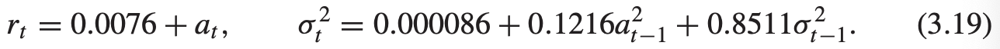

[here]
$$\large r_t = 7.4497e-03 + a_t, \;\; \sigma_t^2 = 8.0615e-05 + 1.2198e-01 a_{t-1}^2 + 8.5436e-01 \sigma_{t-1}^2$$

The standard error of the constant in the mean equation is 0.0015 [1.538e-03], whereas those of the parameters in the volatility equation are 0.00024 [2.833e-05], 0.0197 [2.202e-02], and 0.0190 [2.175e-02] in the book [here].

The unconditional variance of $a_t$ [in the book] is [$\omega = a_0$]

$\large \frac{0.000086}{1 - 0.8511 - 0.1216} = \frac{\omega}{1 - \beta - \alpha} = 0.00314$.

The unconditional variance of $a_t$ [here] is [$\omega = a_0$]

$\large \frac{8.0615e-05}{1 - 8.5436e-01 - 1.2198e-01} = \frac{\omega}{1 - \beta - \alpha} = 3.14e-03$.

This is a **simple stationary GARCH(1,1) model** 

Figure 3.8 shows 
- the estimated volatility process, $\sigma_t$ and 
- the standardized shocks = $\large \tilde{a}_t = \frac{a_t}{\sigma_t}$ for the GARCH(1,1) model in (3.19). [This computatoin is shown below as 'stresi.manual.m1 <- at/conditional.sd]

Figure 3.9 fails to shows any significant serial correlation in the sample ACF of standardized residuals $\tilde{a}_t$ or conditional heteroscedasticity in the squared process aka standardized residual series $\tilde{a}_t^2$. [I compute the standardized residuals below and compare their ACFs same as Figure 3.9 with the ACFs of nonstandardized residuals which show significant serial correlation and conditional heteroscedasticity.] 

More specificially, Q(12) = 11.99 (0.45) [= 11.99 (0.4457)], Q(24) = 28.52 (0.24) [= 28.437 (0.242)] for $\tilde{a}_t$, and Q(12) = 13.11 (0.36) [= 13.038 (0.3663)] and Q(24) = 26.45 (0.33) [= 26.235 (0.3414)] for $\tilde{a}_t^2$ are the test statistic (p values) that do not allow use to reject the null hypothesis of no autocorrelation in stanrdardized residuals $\tilde{a}_t$ and no conditional heteroscedasticity in the standardardized residuals squared $\tilde{a}_t^2$.  Thus, the model appears adequate [eliminates all non-random predictability] in describing the linear dependence in the return and volatility series.  

[I compute Box-Ljung and Box-Pierce that do match garchFit(~garch(1,1), data=sp5.ts, trace=F) but not book EXACTLY; so not sure which. Interesting that DOF are not reduced by p,q in a GARCH model.] 

Note that the fitted model shows $\hat{\alpha}_1 + \hat{\beta}_1 = 0.9772$ which is close to 1.  This phenomenon is commonly observed in practice and leads to imposing the constraint $\hat{\alpha}_1 + \hat{\beta}_1 = 1$ in a GARCH(1,1) model resulting in an **integrated GARCH or IGARCH model** in section 3.6.
 
3.19)

[book]
$$\large r_t = 0.0076 + a_t, \;\; \sigma_t^2 = 0.000086 + 0.1216 a_{t-1}^2 + 0.8511 \sigma_{t-1}^2$$

[here]
$$\large r_t = 7.4497e-03 + a_t, \;\; \sigma_t^2 = 8.0615e-05 + 1.2198e-01 a_{t-1}^2 + 8.5436e-01 \sigma_{t-1}^2$$

Finally, to forecast the volatility of month execess returns of S&P500, use the (3.19) equaton: 

at the forecast origin h, 

$$\large \sigma_{h+1}^2 = 0.000086 + 0.1216 a_h^2 + 0.8511 \sigma_h^2$$

The **1-step ahead forecast** is 

$\large \sigma_h^2(1) = 0.000086 + 0.1216 a_h^2 + 0.8511 \sigma_h^2$

where:
- $a_h$ is the residual of the mean equation [$r_t = 0.0076 + a_t$] at time h
- $\sigma_h$ is [conditional standard deviation] obtained from the volatility equation.
    - The **starting value** $\sigma_0^2$ is fixed at either **zero or the unconditional variance** of $a_t = \text{Var}(a_t) = \frac{\omega}{1 - \beta - \alpha} = \frac{0.000086}{1 - 0.8511 - 0.1216} [\text{ or here } = \frac{8.0615e-05}{1 - 8.5436e-01 - 1.2198e-01}]$

For **multistep-ahead forecasts**, [more than 1-step-ahead: $\ell > 1$], use the recursive formula in (3.17). 

(3.17) 

$$ \large \sigma_(\ell) = a_0 + (\alpha_1 + \beta_1) \sigma_h(\ell - 1) \; \; \text{ for } \ell > 1$$

Table 3.1 shows mean and volatility forecasts for the monthly excess return of S&P500 with forecast origin h = 792 based on GARCH(1,1) model in equation (3.19)

these plots are replicated a few cells below here

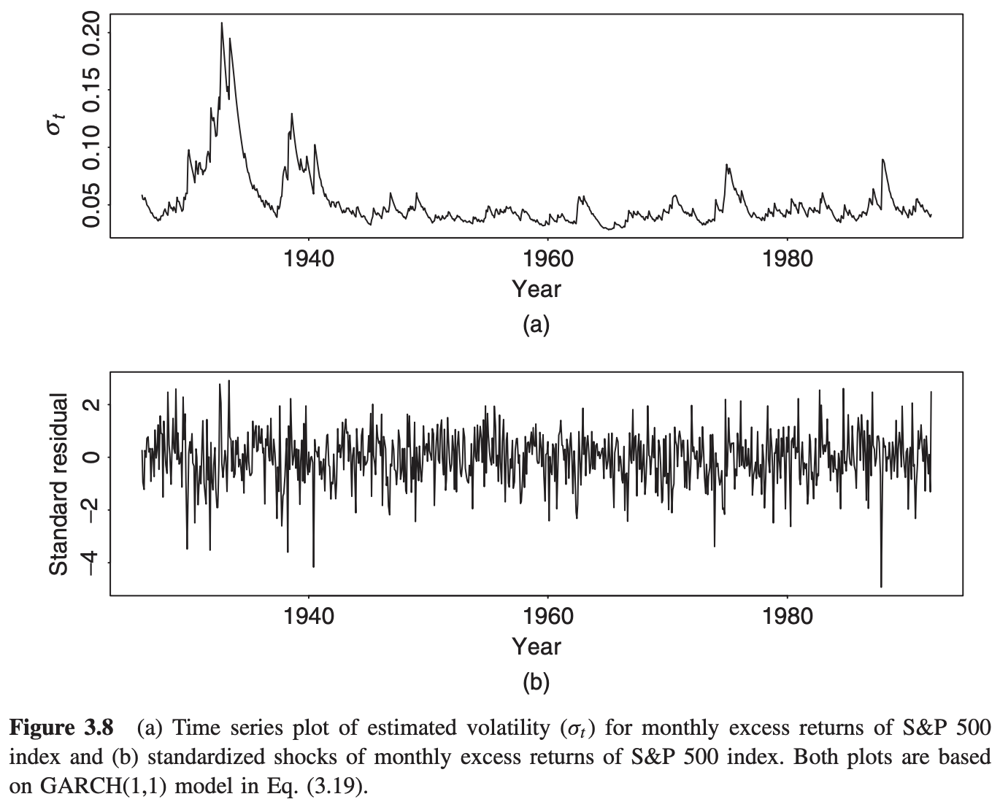

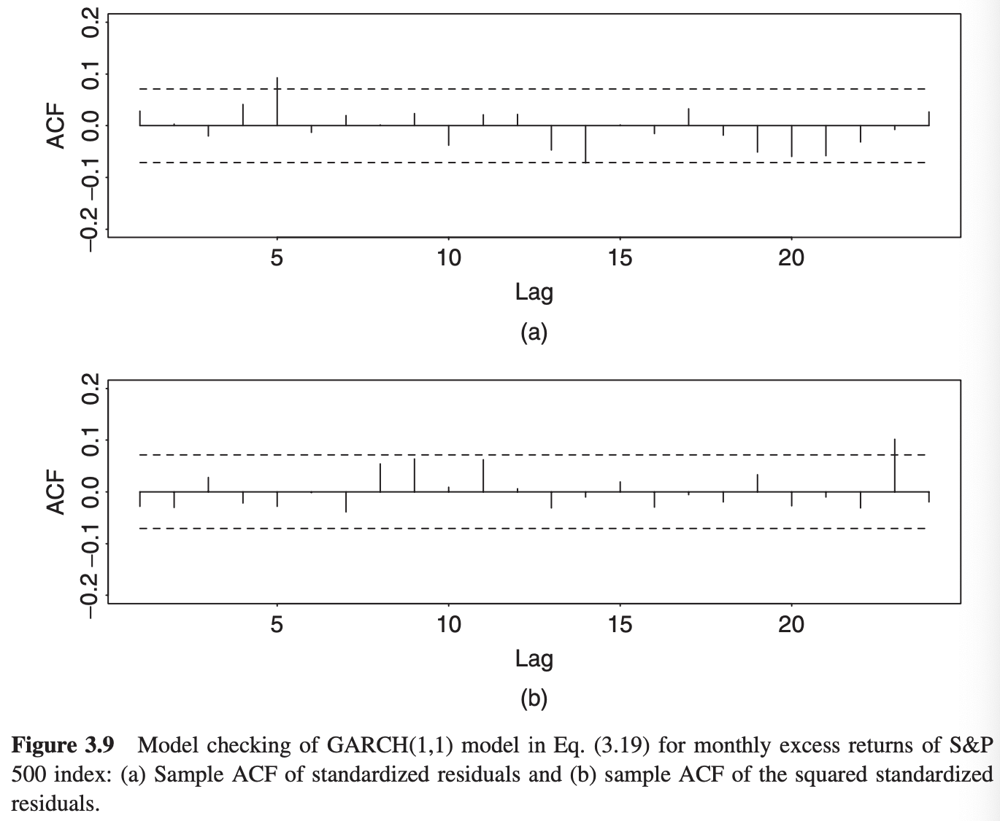

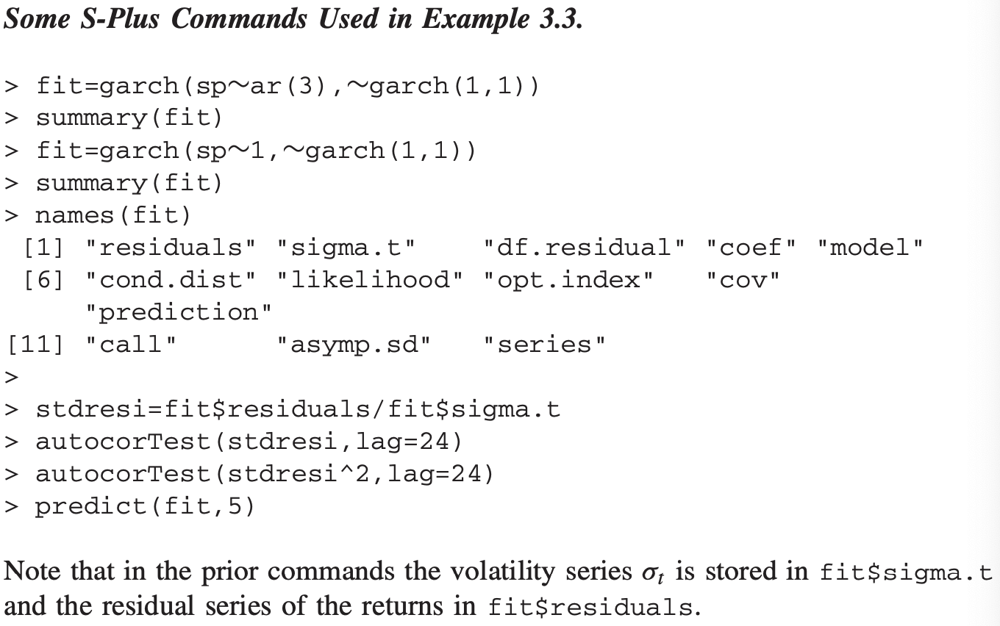

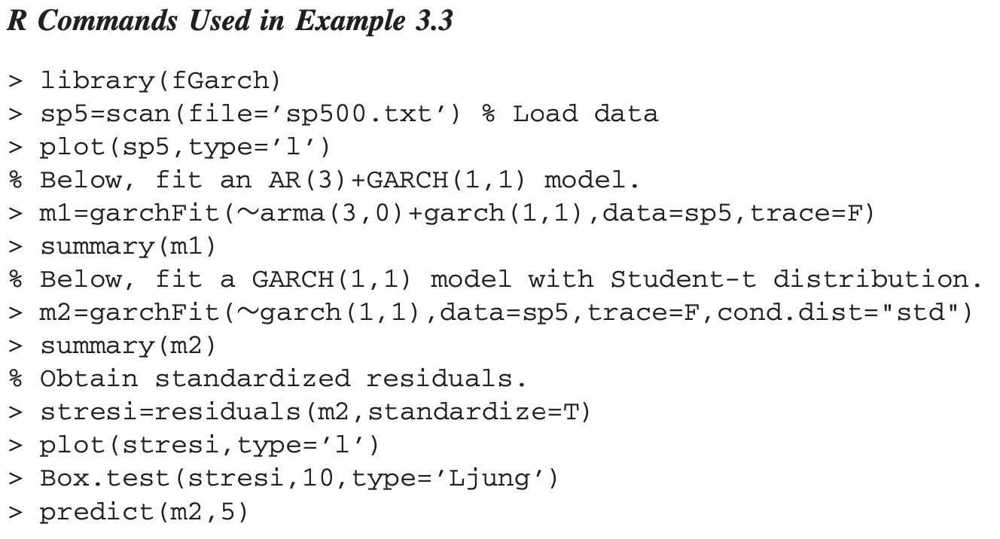

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp5, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fab42d64168>
 [data = sp5]

Conditional Distribution:
 norm 

Coefficient(s):
        mu       omega      alpha1       beta1  
6.2567e-03  7.4536e-05  1.1649e-01  8.6362e-01  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     6.257e-03   1.551e-03    4.033 5.51e-05 ***
omega  7.454e-05   2.661e-05    2.801   0.0051 ** 
alpha1 1.165e-01   2.130e-02    5.468 4.55e-08 ***
beta1  8.636e-01   2.036e-02   42.426  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1262.279    normalized:  1.593787 

Description:
 Wed Feb  2 19:17:33 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  214.971   0           
 Shapiro-Wilk Test  R    W      0.9720273 3.53491

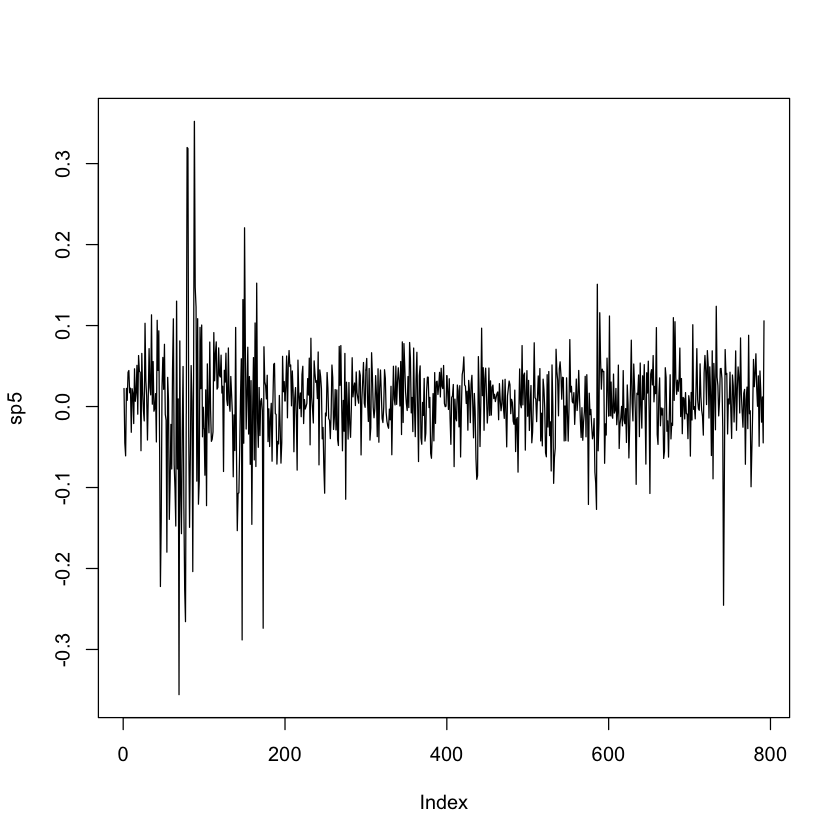


	Box-Ljung test

data:  stresi
X-squared = 11.633, df = 10, p-value = 0.3104


meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.006256724,0.05258037,0.05258037
0.006256724,0.05276575,0.05276575
0.006256724,0.05294680,0.05294680
0.006256724,0.05312365,0.05312365
0.006256724,0.05329642,0.05329642


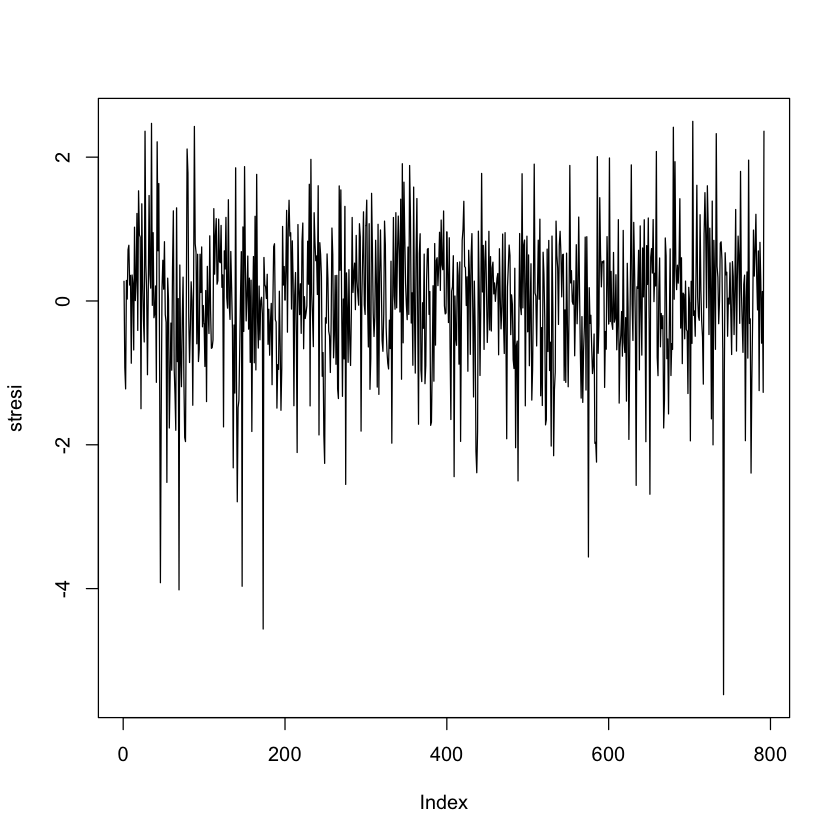

In [7]:
#replicate book code
library(fGarch)
sp5=scan(file='sp500.txt')
# sp5=log(1+sp5) <--without this log treatment results more similar to book 


plot(sp5,type='l')
m.book=garchFit(~garch(1,1),data=sp5,trace=F)
summary(m.book)
stresi=residuals(m.book,standardize=T)
plot(stresi,type='l')
Box.test(stresi,10,type='Ljung')
(predict(m.book,5))

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”


mu        omega       alpha1        beta1 
7.449721e-03 8.061465e-05 1.219754e-01 8.543612e-01


Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp5, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb5086114d8>
 [data = sp5]

Conditional Distribution:
 norm 

Coefficient(s):
        mu       omega      alpha1       beta1  
7.4497e-03  8.0615e-05  1.2198e-01  8.5436e-01  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     7.450e-03   1.538e-03    4.845 1.27e-06 ***
omega  8.061e-05   2.833e-05    2.845  0.00444 ** 
alpha1 1.220e-01   2.202e-02    5.540 3.02e-08 ***
beta1  8.544e-01   2.175e-02   39.276  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1269.455    normalized:  1.602848 

Description:
 Wed Feb  2 12:18:08 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  80.32111  0           
 Shapiro-Wilk Test  R    W      0.98505   3.13688

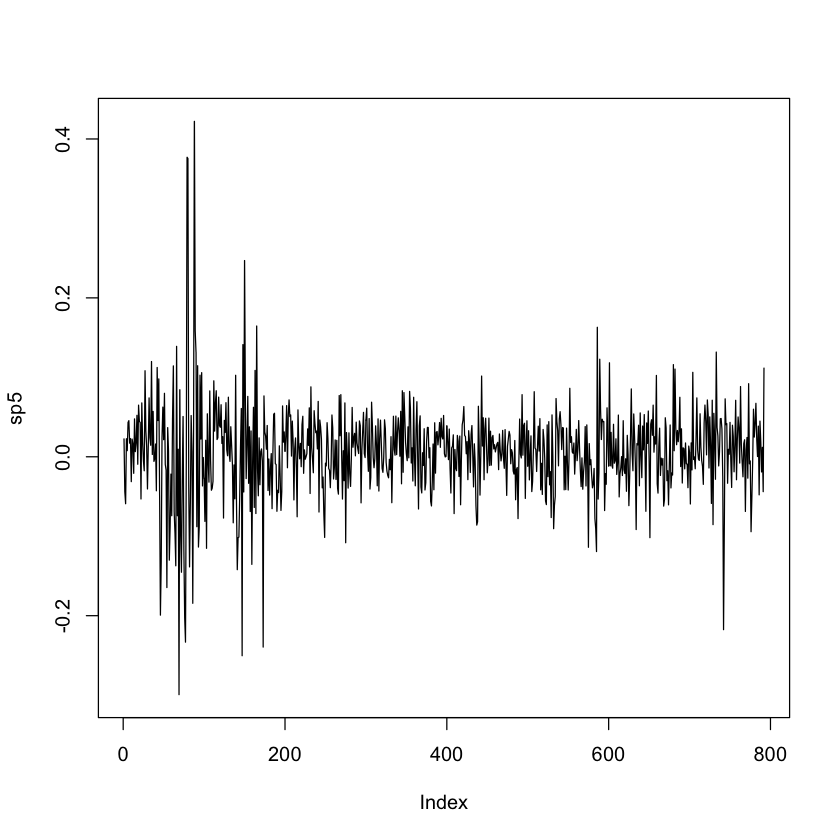


	Box-Ljung test

data:  stresi
X-squared = 11.221, df = 10, p-value = 0.3406


meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.007449721,0.05377242,0.05377242
0.007449721,0.05388567,0.05388567
0.007449721,0.05399601,0.05399601
0.007449721,0.05410353,0.05410353
0.007449721,0.05420829,0.05420829


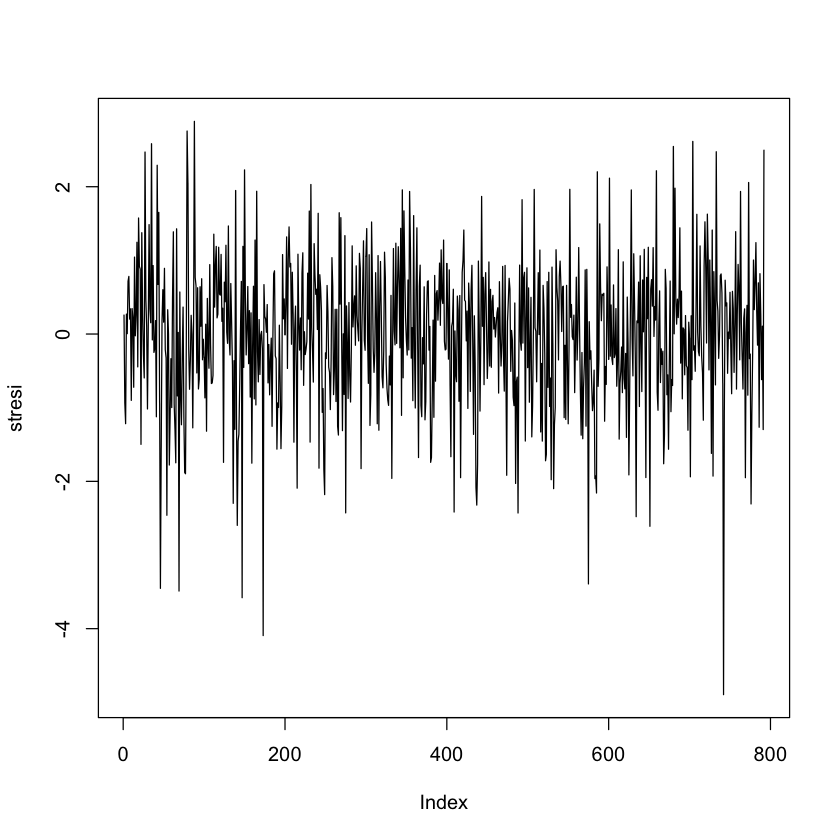

In [67]:
#replicate book code for garch(1,1)
library(fGarch)
sp5=scan(file='sp500.txt')
plot(sp5,type='l')
m.book.garch=garchFit(~garch(1,1),data=sp5,trace=F)
m.book.garch @ fit $ par
summary(m.book.garch)
stresi=residuals(m.book.garch,standardize=T)
plot(stresi,type='l')
Box.test(stresi,10,type='Ljung')
predict(m.book.garch,5)

In [68]:
b = c(1,2,3,4,5,6,7,8)
b[-1]

[1] 2 3 4 5 6 7 8

mu 
0.007449721

omega 
8.061465e-05

alpha1 
0.1219754

beta1 
0.8543612

[1] TRUE

[1] 0.002891473

[1] 0.05377242

meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.007449721,0.05377242,0.05377242
0.007449721,0.05388567,0.05388567
0.007449721,0.05399601,0.05399601
0.007449721,0.05410353,0.05410353
0.007449721,0.05420829,0.05420829


omega 
0.05388567

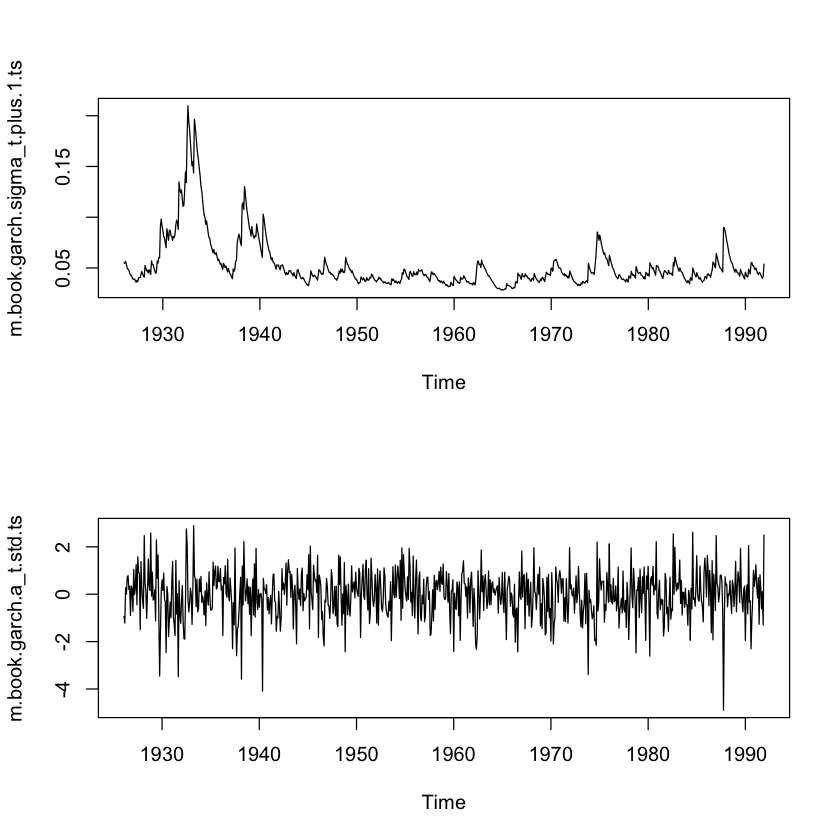

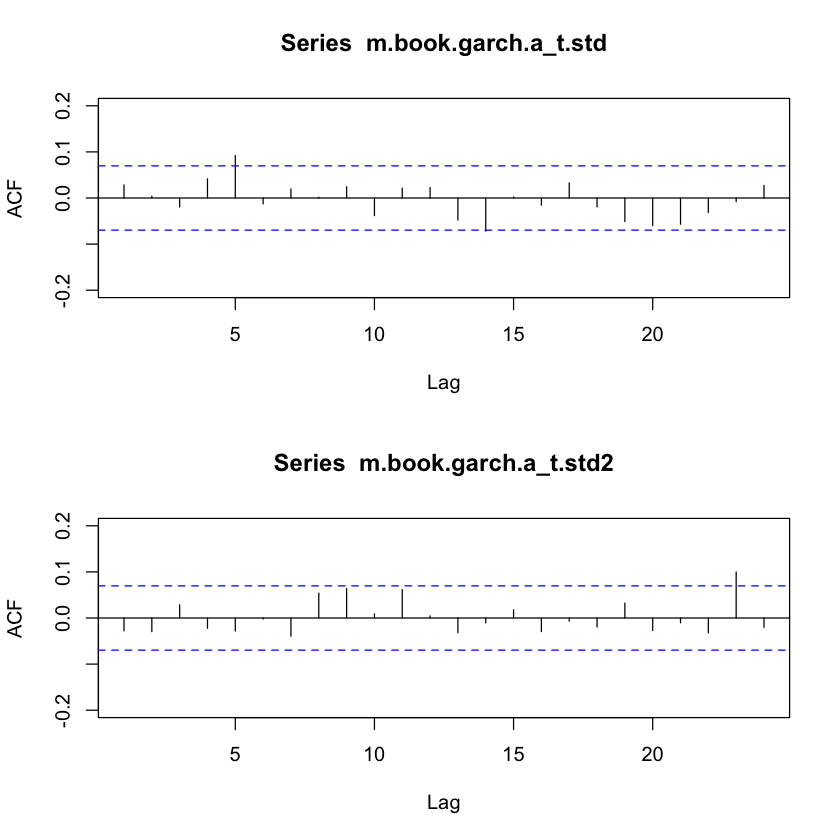

In [69]:
# this matches predict with manual computation of squareroot of variance at horizon
# the calc in the cell below doesnt match
(m.book.garch.mu = m.book.garch @ fit $ par[1])
(m.book.garch.alpha_0 = m.book.garch @ fit $ par[2])
(m.book.garch.alpha_1 = m.book.garch @ fit $ par[3])
(m.book.garch.beta_1 = m.book.garch @ fit $ par[4])
m.book.garch.r_t = sp5
m.book.garch.a_t = m.book.garch @ residuals
m.book.garch.a_t_alt = m.book.garch.r_t - m.book.garch.mu
all.equal(m.book.garch.a_t,m.book.garch.a_t_alt)
m.book.garch.a2_t = m.book.garch.a_t**2
m.book.garch.sigma2_t = m.book.garch @ h.t
m.book.garch.sigma2_t.plus.1 = m.book.garch.alpha_0 + m.book.garch.alpha_1 * m.book.garch.a2_t + m.book.garch.beta_1 * m.book.garch.sigma2_t
(m.book.garch.sigma2_h.plus.1 = tail(m.book.garch.sigma2_t.plus.1, n=1))
m.book.garch.sigma_t.plus.1 = m.book.garch.sigma2_t.plus.1**.5
# the manually computed square root of variance at t = h+1 (using all variables with time subscript = h) 
(m.book.garch.sigma_h.plus.1 = tail(m.book.garch.sigma_t.plus.1, n=1))
# matches the std dev of the 1st forecast i.e. at h+1
predict(m.book.garch, 5)
m.book.garch.sigma2_h.plus.2 = m.book.garch.alpha_0 + (m.book.garch.alpha_1 + m.book.garch.beta_1) * m.book.garch.sigma2_h.plus.1
# manually computed  square root of variance at t = h+2 (using all variables with time subscript = h+1)
(m.book.garch.sigma_h.plus.2 = m.book.garch.sigma2_h.plus.2**.5)
# make ts from the volatility data
m.book.garch.sigma_t.plus.1.ts <- ts(m.book.garch.sigma_t.plus.1, frequency = 12, start = c(1926, 1)) # Jan 1926
# make standardized residuals from a_t/sigma_t - i think sigma_t.plus.1 is 1 time subscript ahead of a_t
m.book.garch.a_t.std = m.book.garch.a_t[-1]/m.book.garch.sigma_t.plus.1[-792]
m.book.garch.a_t.std.ts <- ts(m.book.garch.a_t.std, frequency = 12, start = c(1926, 2)) # Feb 1926
# figure 3.8
par(mfrow=c(2,1))
plot(m.book.garch.sigma_t.plus.1.ts, type='l')
plot(m.book.garch.a_t.std.ts, type='l')
par(mfrow=c(2,1))
m.book.garch.a_t.std2 = m.book.garch.a_t.std**2
# figure 3.8 
par(mfrow=c(2,1))
acf(m.book.garch.a_t.std, xlim=c(1,24),ylim=c(-0.2,+0.2))
acf(m.book.garch.a_t.std2, xlim=c(1,24),ylim=c(-0.2,+0.2))

In [70]:
length(m.book.garch.a_t[-1]) 
length(m.book.garch.sigma_t.plus.1[-792])

[1] 791

[1] 791

In [71]:
(8.06146539788949e-05 + ( 0.121975383382849 + 0.854361195868205) * 0.0537724189498621)**.5

[1] 0.2293046

In [72]:
8.0615e-05/(1 - 8.5436e-01 - 1.2198e-01)

[1] 0.003407227

In [73]:
da=read.table("sp500.txt")
sp500xsr=da[,]
head(sp500xsr)
library(fGarch)
m1 = garchFit(~garch(1,1), data=sp500xsr, trace=F)
summary(m1)
#rt = fitted; residuals = at; so this shows mu = rt - at
head(head(fitted(m1) - residuals(m1)))
# r_t
tail(sp500xsr)
tail(fitted(m1))
predict(m1,5)

[1]  0.0225 -0.0440 -0.0591  0.0227  0.0077  0.0432

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp500xsr, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb5092cb388>
 [data = sp500xsr]

Conditional Distribution:
 norm 

Coefficient(s):
        mu       omega      alpha1       beta1  
7.4497e-03  8.0615e-05  1.2198e-01  8.5436e-01  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     7.450e-03   1.538e-03    4.845 1.27e-06 ***
omega  8.061e-05   2.833e-05    2.845  0.00444 ** 
alpha1 1.220e-01   2.202e-02    5.540 3.02e-08 ***
beta1  8.544e-01   2.175e-02   39.276  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1269.455    normalized:  1.602848 

Description:
 Wed Feb  2 12:18:20 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  80.32111  0           
 Shapiro-Wilk Test  R    W      0.98505

1           2           3           4           5           6 
0.007449721 0.007449721 0.007449721 0.007449721 0.007449721 0.007449721

[1]  0.0449  0.0196 -0.0191  0.0119 -0.0439  0.1116

787     788     789     790     791     792 
 0.0449  0.0196 -0.0191  0.0119 -0.0439  0.1116

meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.007449721,0.05377242,0.05377242
0.007449721,0.05388567,0.05388567
0.007449721,0.05399601,0.05399601
0.007449721,0.05410353,0.05410353
0.007449721,0.05420829,0.05420829


In [74]:
# build 1-step-ahead and multi-sgtep ahead forecast using formuala from book 
(m1.param = m1@fit$par)
(m1.mu = m1.param[1]) # matches the r_t - a_t calc above
(m1.alpha0 = m1.param[2])
(m1.alpha1 = m1.param[3])
(m1.beta1 = m1.param[4])
#a_t = r_t - mu
m1.a_t.1 = sp500xsr - m1.mu
m1.a_t.2 = fitted(m1) - m1.mu
all.equal(m1.a_t.1, as.numeric(m1.a_t.2))
m1.a_t = sp500xsr - m1.mu
# a_t squared at forecast horizon, residual squared 
m1.a2_t = m1.a_t**2
# conditional var
m1.sigma2_t = m1 @ h.t
# conditional var at t
m1.sigma2_t.plus.1 = m1.alpha0 + m1.alpha1 * m1.a2_t + m1.beta1 * m1.sigma2_t
m1.sigma_t.plus.1 = m1.sigma2_t.plus.1**.5
(m1.sigma_h.plus.1 = tail(m1.sigma_t.plus.1, n=1))
#computed similar way with same result
m1.a2_h = tail(m1.a2_t, n=1)
m1.sigma2_h = tail(m1.sigma2_t, n=1)
m1.sigma2_h.plus.1 = m1.alpha0 + m1.alpha1 * m1.a2_h + m1.beta1 * m1.sigma2_h
(m1.sigma_h.plus.1 = m1.sigma2_h.plus.1**.5)
# multistep ahead forecast shown to h+2
m1.sigma2_h.plus.2 = m1.alpha0 + (m1.alpha1 + m1.beta1) * m1.sigma2_h.plus.1
(m1.sigma_h.plus.2 = m1.sigma2_h.plus.2**.5)

mu        omega       alpha1        beta1 
7.449721e-03 8.061465e-05 1.219754e-01 8.543612e-01

mu 
0.007449721

omega 
8.061465e-05

alpha1 
0.1219754

beta1 
0.8543612

[1] TRUE

[1] 0.05377242

omega 
0.05377242

omega 
0.05388567

[1] TRUE

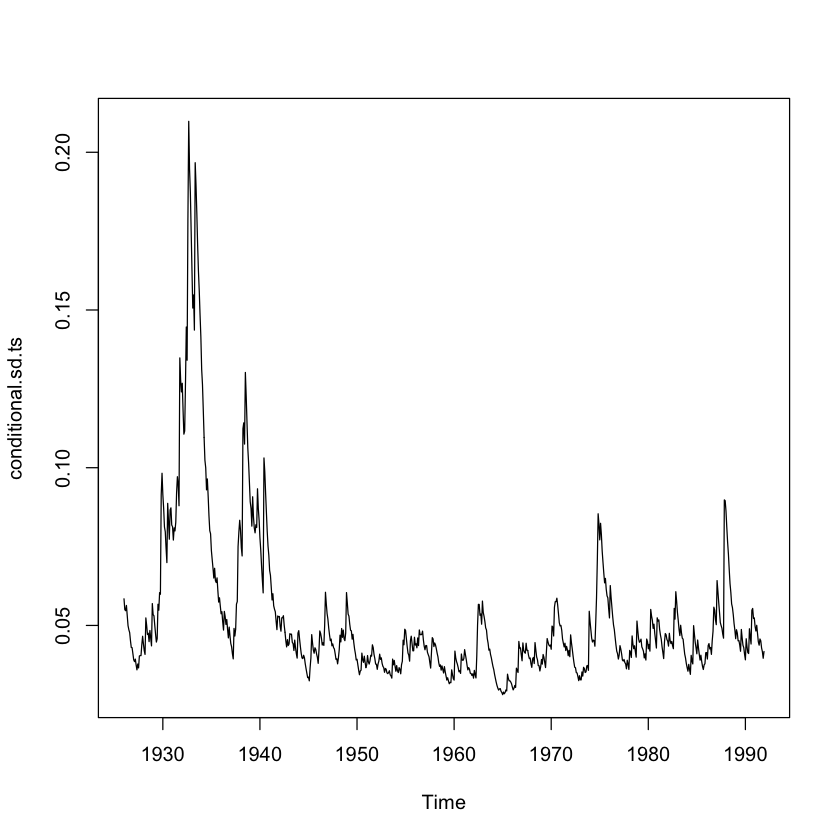

[1] TRUE

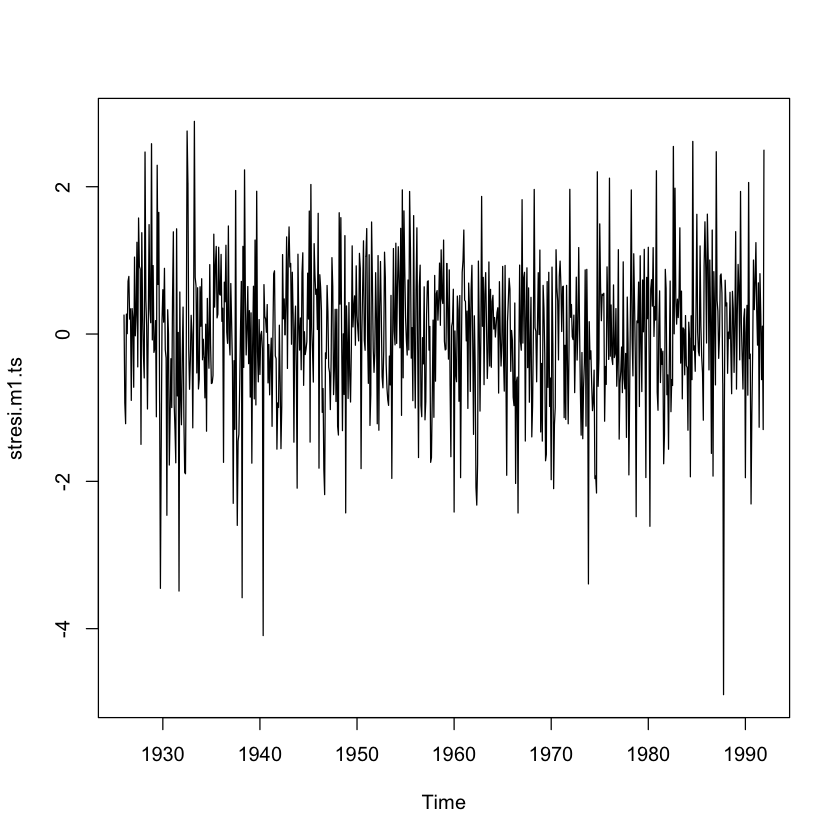

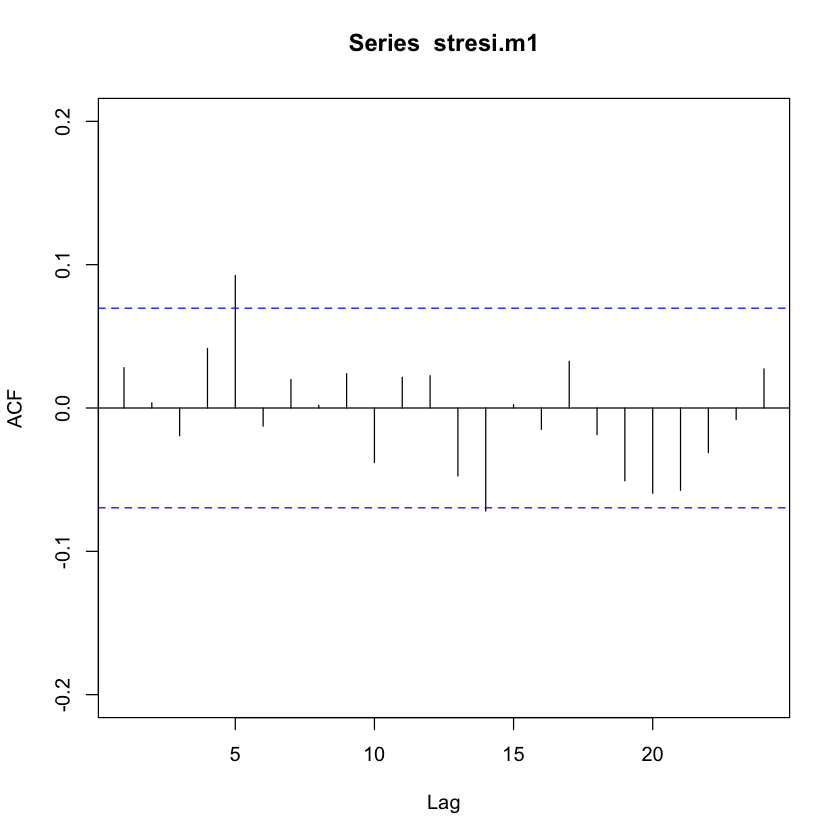

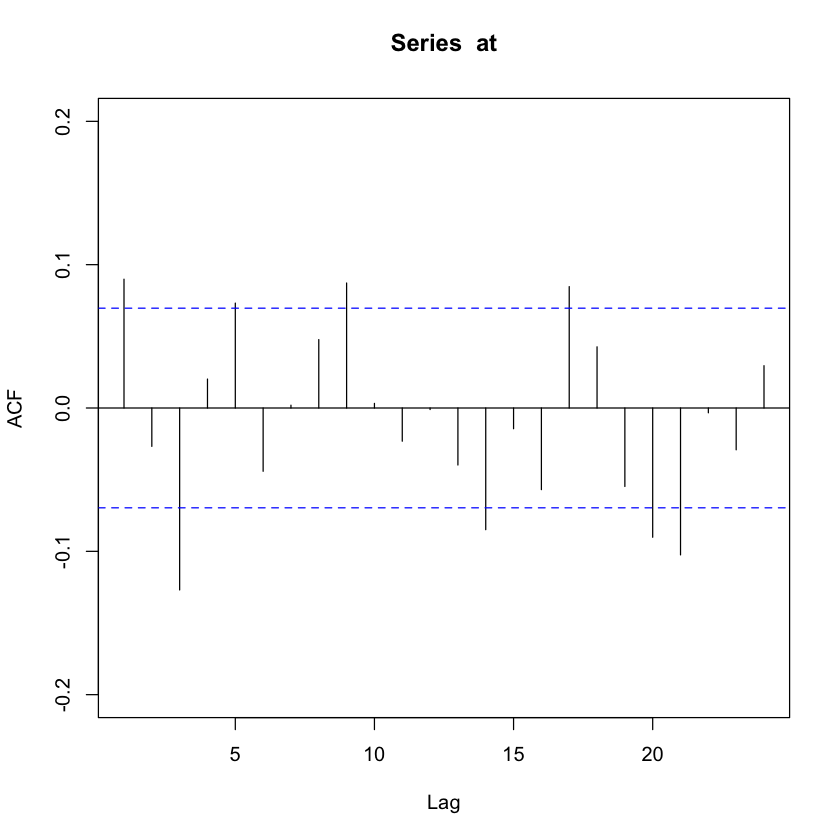

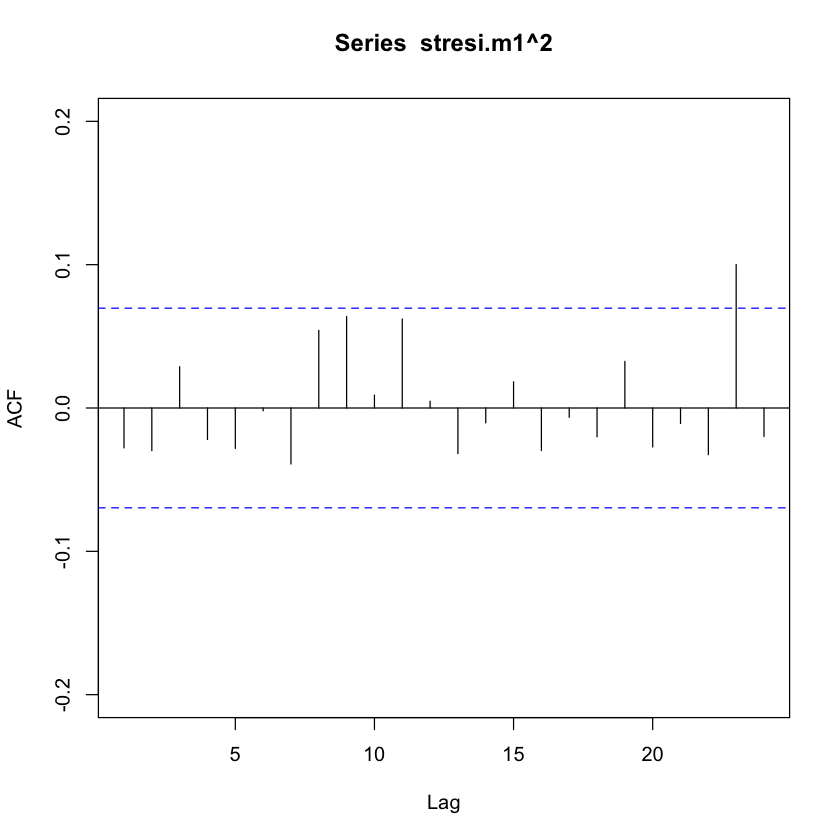


	Box-Ljung test

data:  stresi.m1
X-squared = 11.221, df = 10, p-value = 0.3406



	Box-Ljung test

data:  stresi.m1
X-squared = 11.999, df = 12, p-value = 0.4457



	Box-Ljung test

data:  stresi.m1
X-squared = 28.437, df = 24, p-value = 0.242



	Box-Ljung test

data:  stresi.m1^2
X-squared = 9.9202, df = 10, p-value = 0.4475



	Box-Ljung test

data:  stresi.m1^2
X-squared = 13.038, df = 12, p-value = 0.3663



	Box-Ljung test

data:  stresi.m1^2
X-squared = 26.235, df = 24, p-value = 0.3414


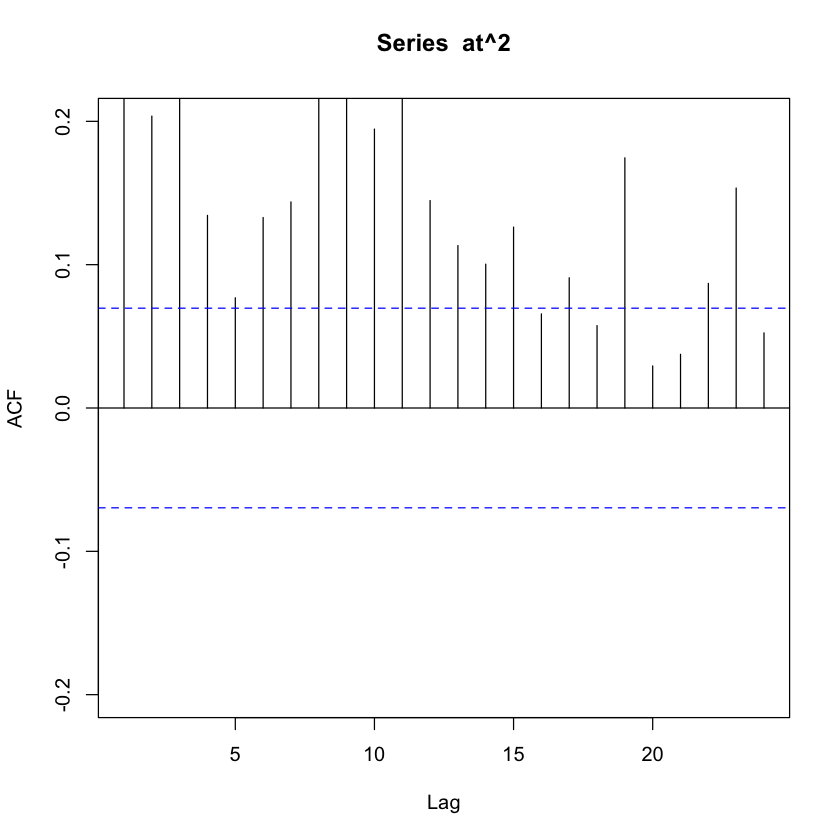

In [75]:
# my work after looking at ?garchFit
# https://stat.ethz.ch/pipermail/r-sig-finance/2008q1/002108.html

conditional.v <- m1 @ h.t
conditional.sd <- m1 @ sigma.t
conditional.sd.ts <- ts(conditional.sd, frequency=12, start = c(1926,1))
all.equal(conditional.v, as.numeric(conditional.sd.ts^2))
plot(conditional.sd.ts, type='l') # figure 3.8

stresi.m1 <- residuals(m1, standardize=T)
stresi.m1.ts <- ts(stresi.m1, frequency=12, start = c(1926,1))
plot(stresi.m1.ts, type='l') 


#at = residuals(m1) and sigmat = m1 @ sigma.t; at/sigmat = residuals(m1, standardize=T)

at <- residuals(m1)
stresi.manual.m1 <- at / conditional.sd
all.equal(stresi.manual.m1, stresi.m1)


acf(stresi.m1,xlim=c(1,24), ylim=c(-0.2,0.2))
acf(at,xlim=c(1,24), ylim=c(-0.2,0.2))
acf(stresi.m1^2,xlim=c(1,24), ylim=c(-0.2,0.2))
acf(at^2,xlim=c(1,24), ylim=c(-0.2,0.2))

Box.test(stresi.m1, lag=10, type="Ljung")
Box.test(stresi.m1, lag=12, type="Ljung")
Box.test(stresi.m1, lag=24, type="Ljung")
Box.test(stresi.m1^2, lag=10, type="Ljung")
Box.test(stresi.m1^2, lag=12, type="Ljung")
Box.test(stresi.m1^2, lag=24, type="Ljung")

### t Innovation

Assuming that $\epsilon_t$ follows a standardized Student-t distribution with 5 degrees of freedom, reestimate GARCH(1,1) model

 
(3.20)

[book]
$$\large r_t = 0.0085 + a_t, \;\; \sigma_t^2 = 0.00012 + 0.1121 a_{t-1}^2 + 0.8432 \sigma_{t-1}^2$$

[here]
$$\large r_t = 0.00845504 + a_t, \;\; \sigma_t^2 = 0.0001248 + 0.113 a_{t-1}^2 + 0.8422 \sigma_{t-1}^2$$

where the standard errors of the parameters are $0.0015 [1.515e-03], 0.51 \times 10^{-4} [4.519e-05], 0.0296[2.693e-02], 0.0371[3.186e-02]$.  This model is essentially an IGARCH(1,1) model as $\hat{a}_1 + \hat{\beta}_1 ~ 0.953$ [0.9552] which is close to 1.  The Ljung-Box statistics of the standardized residuals {$\tilde{a}_t$} give Q(10) = 11.38(0.33) [11.37961(0.3287173)] and of the standardized residuals squared {$\tilde{a}_t^2$} give Q(10) = 10.48(0.40) [10.52266(0.3958941)] suggesting that the fitted GARCH(1,1) model with Student-t distribution is adequate.

In [76]:
0.1121+0.8432
0.113+0.8422


[1] 0.9553

[1] 0.9552

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp5, cond.dist = "std", 
    trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb5381a7ed0>
 [data = sp5]

Conditional Distribution:
 std 

Coefficient(s):
        mu       omega      alpha1       beta1       shape  
0.00845504  0.00012485  0.11302582  0.84220210  7.00318057  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     8.455e-03   1.515e-03    5.581 2.39e-08 ***
omega  1.248e-04   4.519e-05    2.763  0.00573 ** 
alpha1 1.130e-01   2.693e-02    4.198 2.70e-05 ***
beta1  8.422e-01   3.186e-02   26.432  < 2e-16 ***
shape  7.003e+00   1.680e+00    4.169 3.06e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1283.417    normalized:  1.620476 

Description:
 Wed Feb  2 12:19:06 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarqu

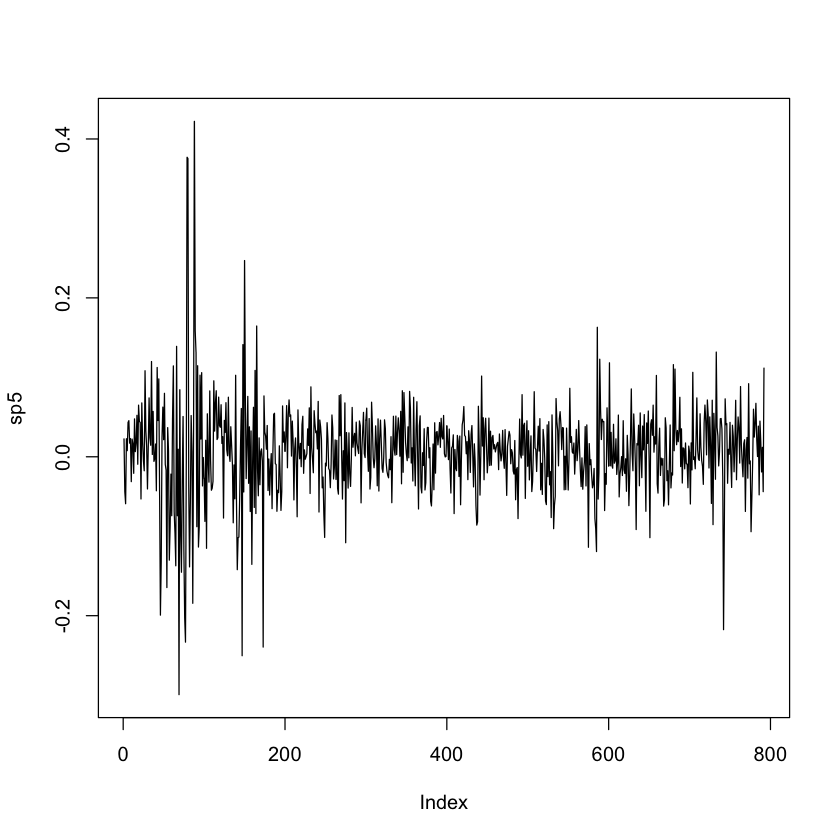


	Box-Ljung test

data:  stresi
X-squared = 11.38, df = 10, p-value = 0.3287


meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.007449721,0.05377242,0.05377242
0.007449721,0.05388567,0.05388567
0.007449721,0.05399601,0.05399601
0.007449721,0.05410353,0.05410353
0.007449721,0.05420829,0.05420829


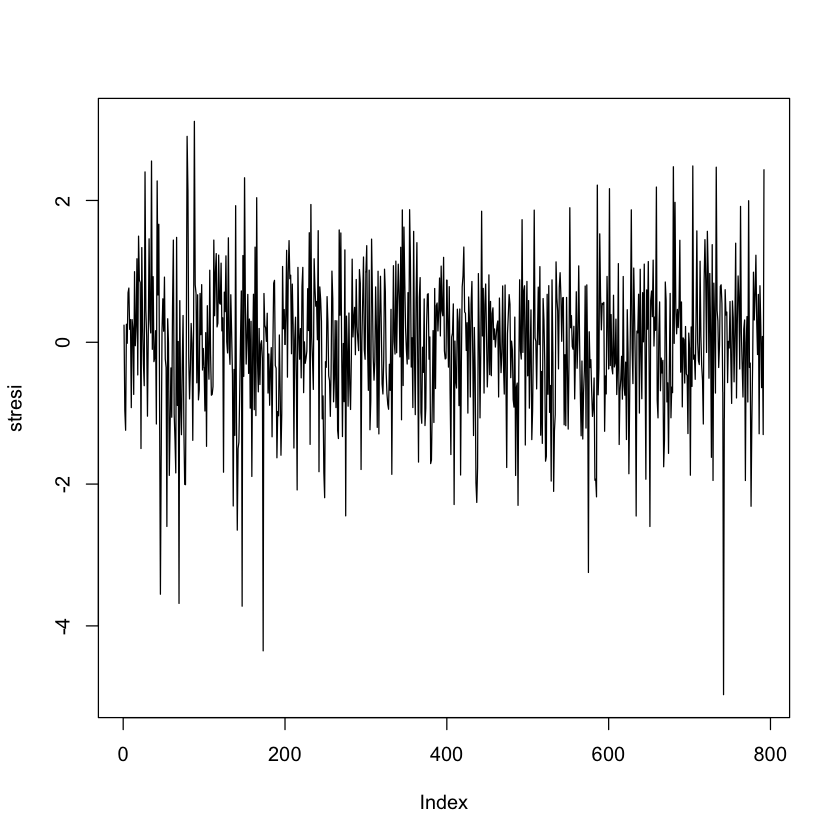

In [77]:
#replicate book code for garch(1,1) student-t
library(fGarch)
sp5=scan(file='sp500.txt')
plot(sp5,type='l')
m.book.garch.stdtt=garchFit(~garch(1,1),data=sp5,cond.dist='std',trace=F)
summary(m.book.garch.stdtt)
stresi=residuals(m.book.garch.stdtt,standardize=T)
plot(stresi,type='l')
Box.test(stresi,10,type='Ljung')
predict(m.book.garch,5)

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp5, cond.dist = "std", 
    trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb57ea69330>
 [data = sp5]

Conditional Distribution:
 std 

Coefficient(s):
        mu       omega      alpha1       beta1       shape  
0.00845504  0.00012485  0.11302582  0.84220210  7.00318057  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     8.455e-03   1.515e-03    5.581 2.39e-08 ***
omega  1.248e-04   4.519e-05    2.763  0.00573 ** 
alpha1 1.130e-01   2.693e-02    4.198 2.70e-05 ***
beta1  8.422e-01   3.186e-02   26.432  < 2e-16 ***
shape  7.003e+00   1.680e+00    4.169 3.06e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1283.417    normalized:  1.620476 

Description:
 Wed Feb  2 12:19:07 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarqu


	Box-Ljung test

data:  stresi.m2
X-squared = 11.38, df = 10, p-value = 0.3287



	Box-Ljung test

data:  stresi.m2^2
X-squared = 10.523, df = 10, p-value = 0.3959


meanForecast,meanError,standardDeviation
<dbl>,<dbl>,<dbl>
0.008455044,0.05330089,0.05330089
0.008455044,0.05327886,0.05327886
0.008455044,0.05325781,0.05325781
0.008455044,0.05323769,0.05323769
0.008455044,0.05321847,0.05321847


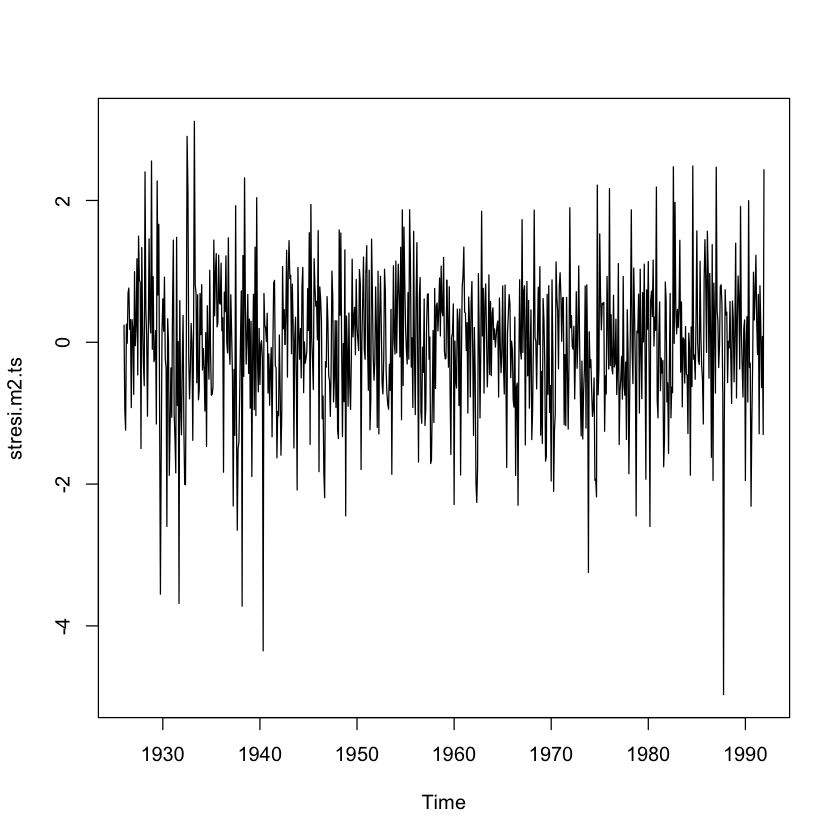

In [78]:
# Below, fit a GARCH(1,1) model with Student-t distribution

m2 <- garchFit(~garch(1,1), data=sp5, trace=F, cond.dist="std")
summary(m2)

# Obtain standardized residuals

stresi.m2 <- residuals(m2, standardize=T)
stresi.m2.ts <- ts(stresi.m2, frequency=12, start = c(1926,1))
plot(stresi.m2.ts, type='l')

Box.test(stresi.m2, 10, type='Ljung')
Box.test(stresi.m2^2, 10, type='Ljung')
predict(m2,5)

### Estimation of DOF

Extend the GARCH(1,1) model by estimating the degrees of freedom fo the Student-t distribution used, obtain this model:

(3.21)

[book]
$$\large r_t = 0.0085 + a_t, \;\; \sigma_t^2 = 0.00012 + 0.1121 a_{t-1}^2 + 0.8432 \sigma_{t-1}^2$$

[here; unchanged from fixed DOF]
$$\large r_t = 0.00845504 + a_t, \;\; \sigma_t^2 = 0.0001248 + 0.11302582 a_{t-1}^2 + 0.84220210 \sigma_{t-1}^2$$


where
- estimated DOF is 7.02 [7.003e+00] with standard error 1.78 [1.680e+00]; thus cannot reject the hypothesis of using standardized Student-t distribution with 5 degrees of freedome at the 5% significance level.  [Is that 7 DOF - 2 = 5 for each parameter?]
[seems to me that we should be able to use the jointly determined 7.02 DOF rather than apriori 5 given the standard error of the jointly determined DOF, or am I missing the point here?]
- standard errors of the estimated parameters in (3.21) are similar to those in (3.20)


https://stat.ethz.ch/pipermail/r-help/2011-November/294732.html   
https://stat.ethz.ch/pipermail/r-sig-finance/2012q2/010465.html   
https://stats.stackexchange.com/questions/225044/fgarch-and-include-shape-in-r

In [79]:
m.book.garch.stdtt.dof <- garchFit(~garch(1,1), data=sp5, trace=F, cond.dist="std", include.shape=TRUE)
m.book.garch.stdtt.dof@fit$params$shape
m.book.garch.stdtt.dof@fit$params
m.book.garch.stdtt.dof.res = m.book.garch.stdtt.dof@residuals
m.book.garch.stdtt.dof.stres <- residuals(m.book.garch.stdtt.dof, standardize=T)
summary(m.book.garch.stdtt.dof)
# https://stat.ethz.ch/pipermail/r-help/2011-November/294732.html
# https://stat.ethz.ch/pipermail/r-sig-finance/2012q2/010465.html
# https://stats.stackexchange.com/questions/225044/fgarch-and-include-shape-in-r

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”


[1] 4

$params
          mu        omega       alpha1       gamma1        beta1        delta 
0.0084550440 0.0001248488 0.1130258237 0.1000000000 0.8422021002 2.0000000000 
        skew        shape 
1.0000000000 7.0031805736 

$U
         mu       omega      alpha1      gamma1       beta1       delta 
-1.05083512  0.00000100  0.00000001 -0.99999999  0.00000001  0.00000000 
       skew       shape 
 0.10000000  1.00000000 

$V
        mu      omega     alpha1     gamma1      beta1      delta       skew 
  1.050835 100.000000   1.000000   1.000000   1.000000   2.000000  10.000000 
     shape 
 10.000000 

$includes
    mu  omega alpha1 gamma1  beta1  delta   skew  shape 
  TRUE   TRUE   TRUE  FALSE   TRUE  FALSE  FALSE   TRUE 

$index
    mu  omega alpha1  beta1  shape 
     1      2      3      5      8 

$mu
       mu 
0.1050835 

$delta
[1] 2

$skew
[1] 1

$shape
[1] 4

$cond.dist
[1] "std"

$leverage
[1] FALSE

$persistence
persistence 
        0.9 

$control
$control$fscale
[1] TRUE

$control$xscale
[1] TRUE

$control$algorithm
[1] "nlminb"

$control$llh
[1] "internal"

$control$tol1
[1] 1

$control$tol2
[1] 1

$control$MIT
[1] 2000

$control$MFV
[1] 5000

$control$MET
[1] 5

$control$MEC
[1] 2

$control$MER
[1] 1

$control$MES
[1] 4

$control$XMAX
[1] 1000

$control$TOLX
[1] 1e-10

$control$TOLC
[1] 1e-06

$control$TOLG
[1] 1e-06

$control$TOLD
[1] 1e-06

$control$TOLS
[1] 1e-04

$control$RPF
[1] 0.01


$llh
[1] 965.4144


Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp5, cond.dist = "std", 
    include.shape = TRUE, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb508146d30>
 [data = sp5]

Conditional Distribution:
 std 

Coefficient(s):
        mu       omega      alpha1       beta1       shape  
0.00845504  0.00012485  0.11302582  0.84220210  7.00318057  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     8.455e-03   1.515e-03    5.581 2.39e-08 ***
omega  1.248e-04   4.519e-05    2.763  0.00573 ** 
alpha1 1.130e-01   2.693e-02    4.198 2.70e-05 ***
beta1  8.422e-01   3.186e-02   26.432  < 2e-16 ***
shape  7.003e+00   1.680e+00    4.169 3.06e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1283.417    normalized:  1.620476 

Description:
 Wed Feb  2 12:22:30 2022 by user:  


Standardised Residuals Tests:
                                Statist

In [80]:
m.book.garch.stdtt.dof@fit$coef@m


ERROR: Error in eval(expr, envir, enclos): trying to get slot "m" from an object of a basic class ("numeric") with no slots


box test with dof
https://www.rdocumentation.org/packages/stats/versions/3.6.2/topics/Box.test


In [81]:
# these residuals do not match above because theyre not standardized
Box.test(m.book.garch.stdtt.dof.res,lag=10,type='Ljung',fitdf=0)

# these rediduals match computation above
Box.test(m.book.garch.stdtt.dof.stres,lag=10,type='Ljung',fitdf=0)

#if use the model jointly determining dof
Box.test(m.book.garch.stdtt.dof.stres,lag=10,type='Ljung',fitdf=3)




	Box-Ljung test

data:  m.book.garch.stdtt.dof.res
X-squared = 33.939, df = 10, p-value = 0.0001891



	Box-Ljung test

data:  m.book.garch.stdtt.dof.stres
X-squared = 11.38, df = 10, p-value = 0.3287



	Box-Ljung test

data:  m.book.garch.stdtt.dof.stres
X-squared = 11.38, df = 7, p-value = 0.1229


## 3.5.2 Forecasting Evaluation

The volatility of an asset return is not directly observable; thus, comparing the forecasting performance of different volatility models is a challenge. 

Some researchers use out-of-sample forecasts to assess the forecasting performance of a volatility model: they compare the volatility forecasts $\sigma_h^2(\ell)$ with the shock in the forecasting sample $a_{h+\ell}^2$. 
- This approach often finds a low correlation coefficient $R^2$ between $\sigma_h^2(\ell) \text{ and } a_{h+\ell}^2$ which is not surprising because $a_{h+\ell}^2$ alone is not an adequate measure of the volatility at time index $h+\ell$. Consider, e.g., the 1-step-ahead forecasts. 
    - From a statistical point of view, $E(a_{h+1}^2|F_h) = \sigma_{h+1}^2$; so, that $a_{h+1}^2$ is a **consistent estimate** of $\sigma_{h+1}^2$. 
    - But $a_{h+1}^2$ is not an **accurate estimate** of $\sigma_{h+1}^2$ because a single observation of a random variable $a_{h+1}^2$ with a known mean value cannot provide an accurate estimate of its [ $a_{h+1}^2$ or $\sigma_{h+1}^2$ ?] variance. 
- Consequently, such an approach to evaluate forecasting performance of volatility models is strictly speaking not proper. For more information concerning forecasting evaluation of GARCH models, readers are referred to Andersen and Bollerslev (1998).

## 3.5.3 A Two-Pass Estimation Method

[copy and paste start]

(3.3)

$$ 
\begin{aligned}
 \large r_t = \mu_t + a_t, \,\, \mu_t &= \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_t = r_t - \phi_0 - \sum_{i=1}^k \beta_i x_{it}\\
\large & = \sum_{i=1}^p \phi_i y_{t-i} - \sum_{i=1}^q \theta_i a_{t-i}, \,\, y_{t-1} = r_{t-1} - \phi_0 - \sum_{i=1}^k \beta_i x_{i,t-1}\\
\large &= \sum_{i=1}^p \phi_i [r_{t-1} - \phi_0 - \sum_{i=1}^k \beta_i x_{i,t-1}] - \sum_{i=1}^q \theta_i a_{t-i}\\
\large r_t =\mu_t + a_t  &= \sum_{i=1}^p \phi_i [r_{t-1} - \phi_0 - \sum_{i=1}^k \beta_i x_{i,t-1}] - \sum_{i=1}^q \theta_i a_{t-i} + a_t
\end{aligned}
$$

(3.15)

$$ \large a_t^2 = \alpha_0 + \sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i) a_{t-i}^2 + \eta_t - \sum_{j=1}^s \beta_j \eta_{t-j}$$

Build a volatility model for an asset return series in four steps:
1. Specify mean equation by testing for serial dependence in the data [testing returns data not returns squared data] then if necessary, by building an econometric model, e.g. ARMA model, to remove any linear dependence from the return series.
2. Use the squared "residuals of the mean equation" to test for ARCH effects [after cleaning returns data of correlations].
3. Specify the volatility model if ARCH effects are statistically significant. Perform joint estimation of the mean and volatility equations. [Return to returns and add in volatility and co-determine the 2 equations.]
4. Check the fitted model and refine if needed.

[copy and paste end]

Based on Eq. (3.15), a two-pass estimation method can be used to estimate GARCH models. 
1. First, ignoring any ARCH effects, one estimates the mean equation [(3.3)] of a return series using the methods discussed in Chapter 2 (e.g., maximum-likelihood method). Denote the residual series by $a_t$. 
2. Second, treating {$a_t^2$} as an observed time series, one applies the maximum-likelihood method to estimate parameters of Eq. (3.15). 
    - Denote the AR and MA coefficient estimates by $\hat{\phi}_i$ and $\hat{\theta}_i$. 
    - The GARCH **estimates** are obtained as $\hat{\beta}_i = \hat{\theta}_i$ and $\hat{\alpha}_i = \hat{\phi}_i − \hat{\theta}_i$. 

Obviously, such estimates are approximations to the true parameters and their statistical properties have not been rigorously investigated. However, limited experience shows that this simple approach often provides good approximations, especially when the sample size is moderate or large. For instance, consider the monthly excess return series of the S&P 500 index of Example 3.3. Using the conditional MLE method in SCA, we [garchFit in R, I] obtain the model:

[book]

$$\large r_t = 0.0061 + a_t, \;\;  a_t^2 = 0.00014 + 0.9583 a_{t-1}^2 + \eta_t − 0.8456\eta_{t−1}$$

[mine]

$$\large r_t = 0.0061 + a_t, \;\;  a_t^2 = 0.00034 + 0.9598 a_{t-1}^2 + \eta_t − 0.8496\eta_{t−1}$$

where all estimates are significantly different from zero at the 5% level. 

[This method appears to deploy ARIMA to model $a_t$ as one might use it to model $r_t$ with $a_{t-1}$ standing in for $r_{t-1}$ and $\eta_{t-1}$ standing in for $r_t$'s innovation $a_{t-1}$. Of course it occurs to me that $a_t$ and $\eta_t$ distribution assumptions may be different, but they are both additive to the modeled time series: $a_t = r_t - \mu_t, \eta_t = a_t^2 - \sigma_t^2 \longrightarrow \text{ ARIMA: } \mu_t = r_t - a_t, \sigma_t^2 = a_t^2 - \eta_t$] 

[Note on page 64, (2.25) formula is $r_t - \phi_1 r_{t-1} = \phi_0 + a_t - \theta_1 a_{t-1}$ or $r_t = \phi_0 + \phi_1 r_{t-1}  + a_t - \theta_1 a_{t-1}$ and on page 132, (3.15) is $a_t^2 = \alpha_0 + \sum_{i=1}^{max(m,s)} (\alpha_i + \beta_i)a_{t-i}^2 + \eta_0 - \sum_{j=1}^s \beta_j \eta_{t-j}$. Thus, the ARIMA model of $a_t^2$ throws off $\phi_1$ and $\theta_1$ which are translated to GARCH parameters $\alpha_1$ and $\beta_1$ as follows:   

$\phi_1 = \alpha_1 + \beta_1 \text{ and } \theta_1 = \beta_1 \longrightarrow \beta_1 = \theta_1 \text{ and substituting that into the first equation } \alpha_1 = \phi_1 - \theta_1$]

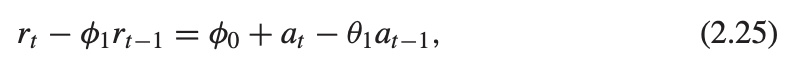

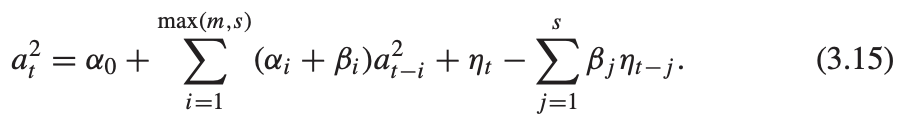

From the ARIMA estimates, we have the book's values [my values] :   
- ARIMA's $\hat{\theta}_1$ = -0.8456 [-0.8496] = GARCH's $-\hat{\beta}_1$ in (3.15) $\longrightarrow \hat{\beta}_1 = 0.8456 [0.8496]$. 
- ARIMA's $\hat{\phi}_1$ = 0.9583 [0.9598] = GARCH's $\hat{\alpha}_1 + \hat{\beta}_1$ in (3.15) $\longrightarrow \hat{\alpha}_1 = \hat{\phi}_1 -  \hat{\beta}_1 = 0.9583 [0.9598] - 0.8456 [0.8496] = 0.1127[0.1102]$

These approximate estimates 

[book]
$$\large r_t = 0.0061 + a_t, \;\; \sigma_t^2 = \, ?? + 0.1127 a_{t-1}^2 + 0.8456 \sigma_{t-1}^2$$

[book]
$$\large r_t = 0.0061 + a_t, \;\; \sigma_t^2 = \, ?? + 0.1102572 a_{t-1}^2 + 0.849591821177368 \sigma_{t-1}^2$$

are very close to those in Eq. (3.19) or (3.21). 

(3.19)

[book]
$$\large r_t = 0.0076 + a_t, \;\; \sigma_t^2 = 0.000086 + 0.1216 a_{t-1}^2 + 0.8511 \sigma_{t-1}^2$$

[mine]
$$\large r_t = 7.4497e-03 + a_t, \;\; \sigma_t^2 = 8.0615e-05 + 1.2198e-01 a_{t-1}^2 + 8.5436e-01 \sigma_{t-1}^2$$

(3.21)

[book]
$$\large r_t = 0.0085 + a_t, \;\; \sigma_t^2 = 0.00012 + 0.1121 a_{t-1}^2 + 0.8432 \sigma_{t-1}^2$$

[here; unchanged from fixed DOF]
$$\large r_t = 0.00843758 + a_t, \;\; \sigma_t^2 = 0.00012513 + 0.11314942 a_{t-1}^2 + 0.84193989 \sigma_{t-1}^2$$

Furthermore, the fitted volatility series [computed below] of the two-pass method is very close to that of Figure 3.8(a).

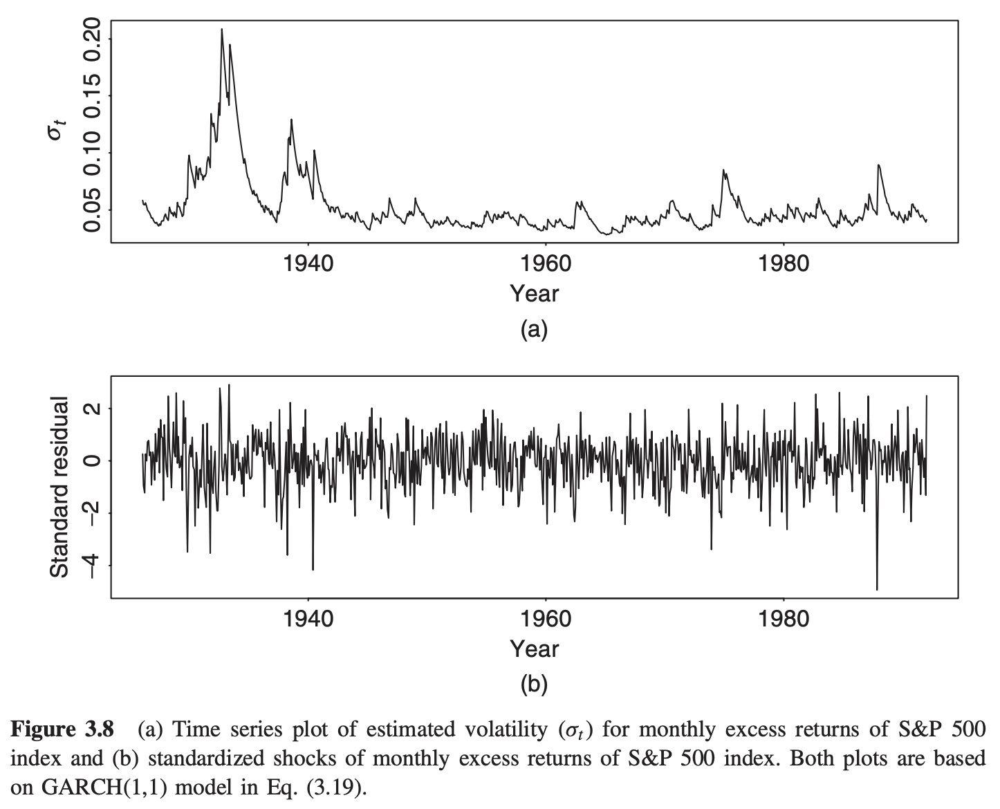

In [87]:
0.9583 - 0.8456; 0.9598 - 0.8496

[1] 0.1127

[1] 0.1102

my answers here are same as https://github.com/cran/FinTS/blob/master/inst/scripts/ch03.R 


Call:
arima(x = sp5, order = c(0, 0, 0))

Coefficients:
      intercept
         0.0061
s.e.     0.0021

sigma^2 estimated as 0.003413:  log likelihood = 1125.53,  aic = -2247.06

[1] 0.006143056

[1] 0.003413116


Call:
arima(x = twopass.sp5.arima.at2, order = c(1, 0, 1))

Coefficients:
         ar1      ma1  intercept
      0.9598  -0.8496     0.0034
s.e.  0.0150   0.0273     0.0014

sigma^2 estimated as 0.0001135:  log likelihood = 2473,  aic = -4938.01

Training set error measures:
                       ME       RMSE         MAE       MPE     MAPE      MASE
Training set 5.534503e-06 0.01065532 0.003741167 -134320.4 134344.8 0.8373881
                   ACF1
Training set 0.04463242

ar1          ma1    intercept 
 0.959849018 -0.849591821  0.003397642

alpha is 0.1102572 
beta is 0.8495918

Warning message:
“Using formula(x) is deprecated when x is a character vector of length > 1.
  Consider formula(paste(x, collapse = " ")) instead.”



Title:
 GARCH Modelling 

Call:
 garchFit(formula = ~garch(1, 1), data = sp5, trace = F) 

Mean and Variance Equation:
 data ~ garch(1, 1)
<environment: 0x7fb51fe174d8>
 [data = sp5]

Conditional Distribution:
 norm 

Coefficient(s):
        mu       omega      alpha1       beta1  
7.4497e-03  8.0615e-05  1.2198e-01  8.5436e-01  

Std. Errors:
 based on Hessian 

Error Analysis:
        Estimate  Std. Error  t value Pr(>|t|)    
mu     7.450e-03   1.538e-03    4.845 1.27e-06 ***
omega  8.061e-05   2.833e-05    2.845  0.00444 ** 
alpha1 1.220e-01   2.202e-02    5.540 3.02e-08 ***
beta1  8.544e-01   2.175e-02   39.276  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Log Likelihood:
 1269.455    normalized:  1.602848 

Description:
 Wed Feb  2 14:27:06 2022 by user:  


Standardised Residuals Tests:
                                Statistic p-Value     
 Jarque-Bera Test   R    Chi^2  80.32111  0           
 Shapiro-Wilk Test  R    W      0.98505   3.13688

[1] TRUE

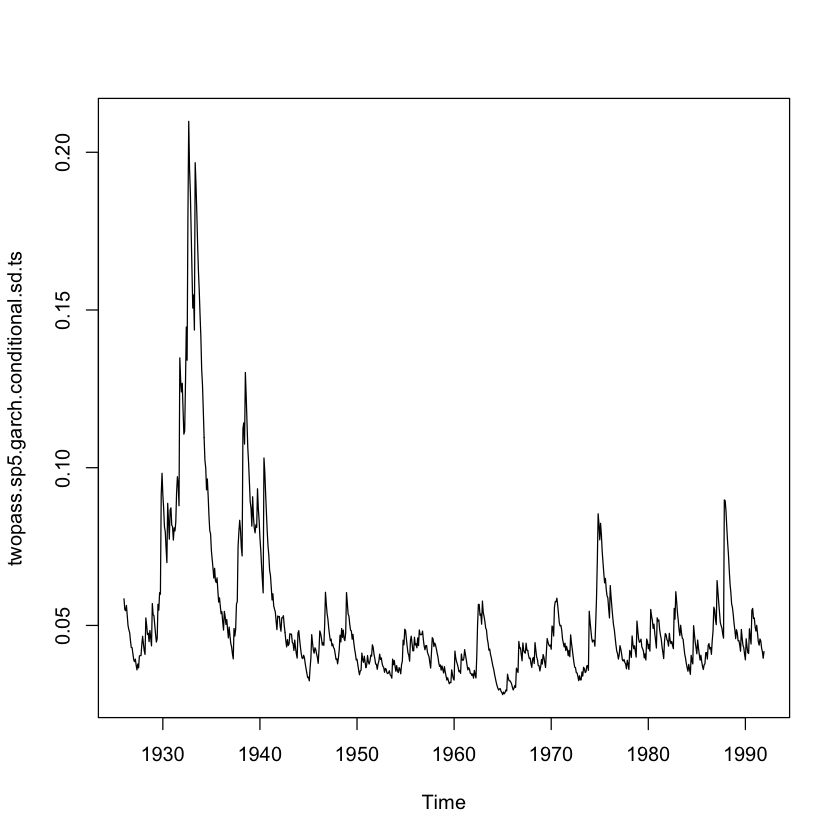

In [88]:
require(fBasics)
require(forecast)
require(fUnitRoots)
library(fUnitRoots)
#require(psych)
#library(urca)
library(fGarch)
sp5=scan(file='sp500.txt')

(twopass.sp5.arima <- arima(sp5,order=c(0,0,0)))
twopass.sp5.arima.at <- residuals(twopass.sp5.arima) # sp5 arima model residuals = a_t
mean(sp5) # equal to the intercept (?)
sum(twopass.sp5.arima.at^2)/length(twopass.sp5.arima.at) # equal to the sigma^2 for series
twopass.sp5.arima.at2 <- twopass.sp5.arima.at^2 # at^2
twopass.at2.arima <- arima(twopass.sp5.arima.at2,order=c(1,0,1)) # arima model on at2 (and/or sigma2) is garch model
summary(twopass.at2.arima) # GARCH
twopass.at2.arima$coef
twopass.at2.arima.phihat = twopass.at2.arima$coef[1] # ar coeff phihat in arima model 
twopass.at2.arima.thetahat = twopass.at2.arima$coef[2] # ma coeff thetahat in arima model
# this should be a negative but using addition because it matches book result.
twopass.at2.garch.alphahat <- twopass.at2.arima.phihat + twopass.at2.arima.thetahat
twopass.at2.garch.betahat <- twopass.at2.arima.thetahat
cat("alpha is",twopass.at2.garch.alphahat, "\nbeta is", -twopass.at2.garch.betahat)

twopass.sp5.garch <- garchFit(~garch(1,1), data=sp5,trace=F)
summary(twopass.sp5.garch)
twopass.sp5.garch.conditional.v <- twopass.sp5.garch @ h.t
twopass.sp5.garch.conditional.sd <- twopass.sp5.garch @ sigma.t
twopass.sp5.garch.conditional.sd.ts <- ts(twopass.sp5.garch.conditional.sd, frequency=12, start = c(1926,1))
all.equal(twopass.sp5.garch.conditional.v, as.numeric(twopass.sp5.garch.conditional.sd.ts^2))
plot(twopass.sp5.garch.conditional.sd.ts, type='l') 


In [89]:
# https://github.com/cran/FinTS/blob/master/inst/scripts/ch03.R
library(fGarch)
sp500=scan(file='sp500.txt')

mean(sp500)
sp500a <- sp500-mean(sp500)
(sp500a1.1 <- arima(sp500a^2, c(1,0,1)))
coef(sp500a1.1)
(beta.1 <- (-coef(sp500a1.1)[2]))
(alpha.1 <- sum(coef(sp500a1.1)[1:2]))

[1] 0.006143056


Call:
arima(x = sp500a^2, order = c(1, 0, 1))

Coefficients:
         ar1      ma1  intercept
      0.9598  -0.8496     0.0034
s.e.  0.0150   0.0273     0.0014

sigma^2 estimated as 0.0001135:  log likelihood = 2473,  aic = -4938.01

ar1          ma1    intercept 
 0.959849018 -0.849591821  0.003397642

ma1 
0.8495918

[1] 0.1102572

## The integrated GARCH model

